## Проект: прогноз временных рядов (панель) с метрикой SMAPE
### Цель
Построить модели прогнозирования для набора ежедневных временных рядов (панель).

Основной критерий успеха: SMAPE на отложенной выборке (holdout) < 12%.

Дополнительно оцениваем качество на backtest (rolling-origin), чтобы проверить устойчивость.

### Данные
Формат «длинной» таблицы:

ds — временная метка (datetime, частота D);

unique_id — идентификатор ряда;

y — целевое значение.

### Возможные экзогенные признаки (в части экспериментов): item, store, quarter, quarter_start, quarter_end и др.
Для future-регрессоров соблюдаем принцип known_future (значения известны на горизонте).

### Хранение: Parquet. Для чтения/записи используем pyarrow (или fastparquet).

### Разбиения и метрика
Holdout: для каждого ряда последние HORIZON точек — отложенная выборка; обучение — на «истории» до holdout.

### Backtest: rolling-origin (несколько фолдов шагом HORIZON).

### Метрика: SMAPE

## Структура ноутбука
Подготовка окружения и импортов (включая проверку Parquet-движка).

Загрузка данных и базовая валидация (ds → datetime, сортировка, asfreq('D'), заполнение внутренних пропусков).

### Утилиты:

функции сплита на holdout и backtest;

SMAPE, логирование результатов в results.csv;

«робастное» чтение/починка CSV → results.fixed.csv (UTF-8).

Бейзлайны: Naive recursive / non-recursive.

### Классика: линейные AR (Elastic/Linear), SARIMAX, Holt-Winters.

Prophet (additive/multiplicative, лог-трансформация).

ML: CatBoost с лагами/оконными фичами.

### Нейро-модели: NeuralProphet, модели Darts / TimesNet (малые конфиги).

### AutoML:

AutoTS (пресеты fast/default/general).

PyCaret Time Series: быстрый turbo и «тяжёлый» прогон.

Агрегация метрик (pivot model × {holdout, backtest}), расчёт разницы и ранжирование.

Выводы и выбор финальной модели.

## Окружения (conda)
ts_automl — основное для AutoML/классики:

AutoTS, PyCaret (TS), Prophet, SARIMAX/HW, CatBoost, утилиты.

etna_env_dl — для нейро-моделей:

NeuralProphet (CPU fallback), (опционально) Darts/TimesNet, Torch/Lightning.

### Примечание (Windows): возможны проблемы с кодировкой консоли (cp1251).
Рекомендуется писать логи метрик в UTF-8/UTF-8-SIG и/или нормализовать имена моделей к ASCII.

## Использованные модели
Бейзлайны: Naive recursive / non-recursive.

Классика:

SARIMAX с недельной сезонностью + Fourier(год), «лёгкий» и «усиленный» варианты.

Holt-Winters (multiplicative).

Линейные AR (Elastic/Linear) с лагами и оконными статистиками.

Prophet: additive / multiplicative, лог-варианты.

CatBoost: табличная регрессия по лагам и агрегатам.

NeuralProphet: безопасный вариант без лагов + future-регрессоры; CPU-режим для стабильности.

Darts / TimesNet: NBEATS/GRU/LSTM/Transformer/TimesNet (малые конфигурации).

AutoML:

AutoTS: пресеты fast/default/general, ансамбли simple/horizontal, разная глубина генетического поиска.

PyCaret Time Series: быстрый compare_models(turbo=True) и усиленный прогон.

### Выходные артефакты
results.csv — потоковая запись результатов по мере запусков.

results.fixed.csv — «почищенная» версия (UTF-8), используется для финальной сводной таблицы и отчёта.

Промежуточные графики и логи (опционально).

# Data Preparation

In [1]:
import csv
import gc
import joblib
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import random
import re
import time
import warnings
warnings.filterwarnings('ignore')

from contextlib import contextmanager
from copy import deepcopy
from etna.analysis import plot_forecast, acf_plot, plot_correlation_matrix, stl_plot
from etna.datasets.tsdataset import TSDataset
from etna.ensembles import StackingEnsemble, VotingEnsemble
from etna.metrics import SMAPE
from etna.models import (
    NaiveModel, 
    ElasticPerSegmentModel, 
    LinearPerSegmentModel, 
    CatBoostPerSegmentModel,
    CatBoostMultiSegmentModel,
    ProphetModel,
    SARIMAXModel,
    HoltWintersModel)
from etna.pipeline import Pipeline, AutoRegressivePipeline
from etna.transforms import (
    StandardScalerTransform,
    MeanTransform,
    LagTransform,
    LogTransform,
    DateFlagsTransform,
    FourierTransform, 
    LagTransform)
from etna.transforms.math import AddConstTransform
from matplotlib._pylab_helpers import Gcf
from pathlib import Path
from sklearn.linear_model import RidgeCV 
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from tqdm.auto import tqdm

def set_seed(seed: int = 42):
    """Set random seed for reproducibility."""
    random.seed(seed)
    np.random.seed(seed)

set_seed()
smape = SMAPE()

In [2]:
HORIZON = 90
CONSIDER_SHOP = [1, 2, 3]
SEGMENTS_TO_SHOW = ['3 + 27' , '1 + 47'] # просто рандомные сегменты для построения графика прогноза
root_path = r'D:\ML\LS\MLA\Time_series\Time_series2\practice'

In [3]:
results_file = Path(root_path) / "results.csv"

def train_and_evaluate_model(
        ts,
        model,
        transforms,
        horizon,
        metrics,
        model_name="model",
        is_auto_regressive=False,
        print_metrics=True,
        return_forecast=False,
        n_train_samples=360*2,
        segments_to_plot=SEGMENTS_TO_SHOW,
        do_backtest=True,
        n_folds_backtest=5,
):
    """
    Обучает модель, делает holdout-прогноз на H шагов, считает метрику и опционально делает backtest.
    Результаты (средняя метрика) логируются в results.csv.
    """

    # Защита: metrics должен быть объектом метрики, а не списком
    if isinstance(metrics, (list, tuple)):
        raise ValueError("metrics должен быть одиночным объектом метрики, а не списком.")

    # Имя метрики
    mname = getattr(metrics, "__class__", type(metrics)).__name__

    # Разбивка
    train_ts, test_ts = ts.train_test_split(test_size=horizon)

    # Pipeline
    if not is_auto_regressive:
        pipe = Pipeline(model=model, transforms=transforms, horizon=horizon)
    else:
        pipe = AutoRegressivePipeline(model=model, transforms=transforms, horizon=horizon)

    # Обучение + прогноз
    t0 = time.time()
    pipe.fit(train_ts)
    forecast_ts = pipe.forecast()
    fit_forecast_sec = time.time() - t0

    # Метрики по сегментам
    seg_scores = metrics(test_ts, forecast_ts)  # dict(segment -> score)
    seg_scores = pd.Series(seg_scores, name='score')
    avg_metric = float(seg_scores.mean())

    if print_metrics:
        print(f"[{model_name}] {mname} avg: {avg_metric:.4f} | fit+forecast: {fit_forecast_sec:.1f}s")

    # Плоты
    if segments_to_plot:
        existing = [s for s in segments_to_plot if s in test_ts.segments]
        if existing:
            plot_forecast(forecast_ts, test_ts, train_ts,
                          n_train_samples=n_train_samples,
                          segments=existing)

    # Логируем holdout
    write_header = not results_file.exists()
    with open(results_file, mode="a", newline="") as f:
        writer = csv.writer(f)
        if write_header:
            writer.writerow(["model", "mode", "avg_metric"])
        writer.writerow([model_name, "holdout", avg_metric])

    # Backtest
    if do_backtest:
        try:
            metrics_df, _, _ = pipe.backtest(
                mode='expand',
                n_folds=n_folds_backtest,
                ts=ts,
                metrics=[metrics],
                aggregate_metrics=True,
                joblib_params=dict(backend='threading'),  # избегаем memmap
                n_jobs=-1
            )
        except ValueError as e:
            # fallback при read-only или подобных глюках joblib/pandas
            if "read-only" in str(e).lower():
                print("backtest с threading упал, пробую n_jobs=1 (без параллелизма)...")
                metrics_df, _, _ = pipe.backtest(
                    mode='expand',
                    n_folds=n_folds_backtest,
                    ts=ts,
                    metrics=[metrics],
                    aggregate_metrics=True,
                    joblib_params=dict(backend='threading'),
                    n_jobs=1
                )
            else:
                raise

        backtest_metric = float(metrics_df[mname].mean())
        if print_metrics:
            print(f"[{model_name}] {mname} backtest avg: {backtest_metric:.4f}")

        with open(results_file, mode="a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([model_name, "backtest", backtest_metric])

    if return_forecast:
        seg_df = seg_scores.reset_index(drop=False).rename(columns={'index': 'segment'})
        return seg_df, avg_metric, forecast_ts

    return seg_scores, avg_metric

In [4]:
df = pd.read_csv(os.path.join(root_path, 'HW_train.csv'), parse_dates=['date'])

df.rename(columns={'date': 'timestamp',
                   'sales': 'target'}, inplace=True)
df

,timestamp,store,item,target
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10
...,...,...,...,...
912995,2017-12-27,10,50,63
912996,2017-12-28,10,50,59
912997,2017-12-29,10,50,74
912998,2017-12-30,10,50,62


In [6]:
print('Dataset shape:', df.shape)

Dataset shape: (913000, 4)


In [5]:
df_new = pd.read_csv(os.path.join(root_path, 'HW_test.csv'), parse_dates=['date'])

df_new.rename(columns={'date': 'timestamp',
                   'sales': 'target'}, inplace=True)

df_new.drop(columns='id', inplace=True)

df_new
print('Test dataset shape:', df_new.shape)

Test dataset shape: (45000, 3)


In [6]:
df['segment'] = (df['store'].astype(str) + ' + '
                 + df['item'].astype(str))

df_new['segment'] = (df_new['store'].astype(str) + ' + '
                     + df_new['item'].astype(str))

df.head()

,timestamp,store,item,target,segment
0,2013-01-01,1,1,13,1 + 1
1,2013-01-02,1,1,11,1 + 1
2,2013-01-03,1,1,14,1 + 1
3,2013-01-04,1,1,13,1 + 1
4,2013-01-05,1,1,10,1 + 1


In [7]:
for col in ['store', 'item']:
    df[col] = df[col].astype('category')
    df_new[col] = df_new[col].astype('category')

In [8]:
regressor_df = df[['timestamp', 'segment', 'store', 'item']].copy()
regressor_df

,timestamp,segment,store,item
0,2013-01-01,1 + 1,1,1
1,2013-01-02,1 + 1,1,1
2,2013-01-03,1 + 1,1,1
3,2013-01-04,1 + 1,1,1
4,2013-01-05,1 + 1,1,1
...,...,...,...,...
912995,2017-12-27,10 + 50,10,50
912996,2017-12-28,10 + 50,10,50
912997,2017-12-29,10 + 50,10,50
912998,2017-12-30,10 + 50,10,50


In [9]:
# экзогенные переменные store и item
regressor_df_new = df_new.copy()
regressor_df_new

,timestamp,store,item,segment
0,2018-01-01,1,1,1 + 1
1,2018-01-02,1,1,1 + 1
2,2018-01-03,1,1,1 + 1
3,2018-01-04,1,1,1 + 1
4,2018-01-05,1,1,1 + 1
...,...,...,...,...
44995,2018-03-27,10,50,10 + 50
44996,2018-03-28,10,50,10 + 50
44997,2018-03-29,10,50,10 + 50
44998,2018-03-30,10,50,10 + 50


In [10]:
regressor_df = regressor_df.sort_index(
    axis=1, ascending=False)

regressor_df_new = regressor_df_new.sort_index(
    axis=1, ascending=False)

In [13]:
regressor_df.shape, regressor_df_new.shape, regressor_df.shape[0] + regressor_df_new.shape[0]

((913000, 4), (45000, 4), 958000)

In [14]:
regressor_df.columns, regressor_df_new.columns

(Index(['timestamp', 'store', 'segment', 'item'], dtype='object'),
 Index(['timestamp', 'store', 'segment', 'item'], dtype='object'))

In [11]:
regressor_df = pd.concat([regressor_df, regressor_df_new], axis=0)

regressor_df['quarter'] = regressor_df['timestamp'].dt.quarter
regressor_df['quarter_start'] = regressor_df['timestamp'].dt.is_quarter_start
regressor_df['quarter_end'] = regressor_df['timestamp'].dt.is_quarter_end
regressor_df

,timestamp,store,segment,item,quarter,quarter_start,quarter_end
0,2013-01-01,1,1 + 1,1,1,True,False
1,2013-01-02,1,1 + 1,1,1,False,False
2,2013-01-03,1,1 + 1,1,1,False,False
3,2013-01-04,1,1 + 1,1,1,False,False
4,2013-01-05,1,1 + 1,1,1,False,False
...,...,...,...,...,...,...,...
44995,2018-03-27,10,10 + 50,50,1,False,False
44996,2018-03-28,10,10 + 50,50,1,False,False
44997,2018-03-29,10,10 + 50,50,1,False,False
44998,2018-03-30,10,10 + 50,50,1,False,False


In [12]:
# подготавливаем исторический набор эндогенных переменных
df.drop(['store', 'item'], axis=1, inplace=True)
df

,timestamp,target,segment
0,2013-01-01,13,1 + 1
1,2013-01-02,11,1 + 1
2,2013-01-03,14,1 + 1
3,2013-01-04,13,1 + 1
4,2013-01-05,10,1 + 1
...,...,...,...
912995,2017-12-27,63,10 + 50
912996,2017-12-28,59,10 + 50
912997,2017-12-29,74,10 + 50
912998,2017-12-30,62,10 + 50


In [13]:
df = TSDataset.to_dataset(df)
df

segment,1 + 1,1 + 10,1 + 11,1 + 12,1 + 13,1 + 14,1 + 15,1 + 16,1 + 17,1 + 18,...,9 + 46,9 + 47,9 + 48,9 + 49,9 + 5,9 + 50,9 + 6,9 + 7,9 + 8,9 + 9
feature,target,target,target,target,target,target,target,target,target,target,...,target,target,target,target,target,target,target,target,target,target
timestamp,,,,,,,,,,,,,,,,,,,,,
2013-01-01,13,37,37,33,37,22,42,14,13,38,...,34,6,28,11,9,36,29,30,45,27
2013-01-02,11,34,43,35,31,35,33,11,18,51,...,28,14,38,16,11,44,33,24,43,36
2013-01-03,14,32,34,41,50,26,45,12,15,42,...,41,18,24,20,8,29,19,35,34,25
2013-01-04,13,45,52,45,45,32,39,15,19,50,...,41,15,30,19,15,43,33,35,41,31
2013-01-05,10,35,45,46,49,31,47,22,16,56,...,42,13,33,16,13,53,36,28,49,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-12-27,14,55,43,47,49,42,62,16,29,54,...,49,19,41,26,18,52,39,44,52,44
2017-12-28,19,63,64,49,68,51,82,24,13,69,...,42,23,36,37,18,73,56,54,76,48


In [14]:
regressor_df = TSDataset.to_dataset(regressor_df)
regressor_df

segment    1 + 1                                         1 + 10          \
feature     item quarter quarter_end quarter_start store   item quarter   
timestamp                                                                 
2013-01-01     1       1       False          True     1     10       1   
2013-01-02     1       1       False         False     1     10       1   
2013-01-03     1       1       False         False     1     10       1   
2013-01-04     1       1       False         False     1     10       1   
2013-01-05     1       1       False         False     1     10       1   
...          ...     ...         ...           ...   ...    ...     ...   
2018-03-27     1       1       False         False     1     10       1   
2018-03-28     1       1       False         False     1     10       1   
2018-03-29     1       1       False         False     1     10       1   
2018-03-30     1       1       False         False     1     10       1   
2018-03-31     1       1        True         False     1     10       1   

segment                                     ... 9 + 8                      \
feature    quarter_end quarter_start store  ...  item quarter quarter_end   
timestamp                                   ...                             
2013-01-01       False          True     1  ...     8       1       False   
2013-01-02       False         False     1  ...     8       1       False   
2013-01-03       False         False     1  ...     8       1       False   
2013-01-04       False         False     1  ...     8       1       False   
2013-01-05       False         False     1  ...     8       1       False   
...                ...           ...   ...  ...   ...     ...         ...   
2018-03-27       False         False     1  ...     8       1       False   
2018-03-28       False         False     1  ...     8       1       False   
2018-03-29       False         False     1  ...     8       1       False   
2018-03-30       False         False     1  ...     8       1       False   
2018-03-31        True         False     1  ...     8       1        True   

segment                        9 + 9                                          
feature    quarter_start store  item quarter quarter_end quarter_start store  
timestamp                                                                     
2013-01-01          True     9     9       1       False          True     9  
2013-01-02         False     9     9       1       False         False     9  
2013-01-03         False     9     9       1       False         False     9  
2013-01-04         False     9     9       1       False         False     9  
2013-01-05         False     9     9       1       False         False     9  
...                  ...   ...   ...     ...         ...           ...   ...  
2018-03-27         False     9     9       1       False         False     9  
2018-03-28         False     9     9       1       False         False     9  
2018-03-29         False     9     9       1       False         False     9  
2018-03-30         False     9     9       1       False         False     9  
2018-03-31         False     9     9       1        True         False     9  

[1916 rows x 2500 columns]

In [15]:
# создаём объединённый набор
ts = TSDataset(df=df, freq='D', df_exog=regressor_df,
               known_future='all')
ts

segment    1 + 1                                                1 + 10  \
feature     item quarter quarter_end quarter_start store target   item   
timestamp                                                                
2013-01-01     1       1       False          True     1   13.0     10   
2013-01-02     1       1       False         False     1   11.0     10   
2013-01-03     1       1       False         False     1   14.0     10   
2013-01-04     1       1       False         False     1   13.0     10   
2013-01-05     1       1       False         False     1   10.0     10   
...          ...     ...         ...           ...   ...    ...    ...   
2017-12-27     1       4       False         False     1   14.0     10   
2017-12-28     1       4       False         False     1   19.0     10   
2017-12-29     1       4       False         False     1   15.0     10   
2017-12-30     1       4       False         False     1   27.0     10   
2017-12-31     1       4        True         False     1   23.0     10   

segment                                       ...       9 + 8                \
feature    quarter quarter_end quarter_start  ... quarter_end quarter_start   
timestamp                                     ...                             
2013-01-01       1       False          True  ...       False          True   
2013-01-02       1       False         False  ...       False         False   
2013-01-03       1       False         False  ...       False         False   
2013-01-04       1       False         False  ...       False         False   
2013-01-05       1       False         False  ...       False         False   
...            ...         ...           ...  ...         ...           ...   
2017-12-27       4       False         False  ...       False         False   
2017-12-28       4       False         False  ...       False         False   
2017-12-29       4       False         False  ...       False         False   
2017-12-30       4       False         False  ...       False         False   
2017-12-31       4        True         False  ...        True         False   

segment                 9 + 9                                                 
feature    store target  item quarter quarter_end quarter_start store target  
timestamp                                                                     
2013-01-01     9   45.0     9       1       False          True     9   27.0  
2013-01-02     9   43.0     9       1       False         False     9   36.0  
2013-01-03     9   34.0     9       1       False         False     9   25.0  
2013-01-04     9   41.0     9       1       False         False     9   31.0  
2013-01-05     9   49.0     9       1       False         False     9   30.0  
...          ...    ...   ...     ...         ...           ...   ...    ...  
2017-12-27     9   52.0     9       4       False         False     9   44.0  
2017-12-28     9   76.0     9       4       False         False     9   48.0  
2017-12-29     9   73.0     9       4       False         False     9   54.0  
2017-12-30     9   74.0     9       4       False         False     9   59.0  
2017-12-31     9   92.0     9       4        True         False     9   50.0  

[1826 rows x 3000 columns]

# Data Analysis

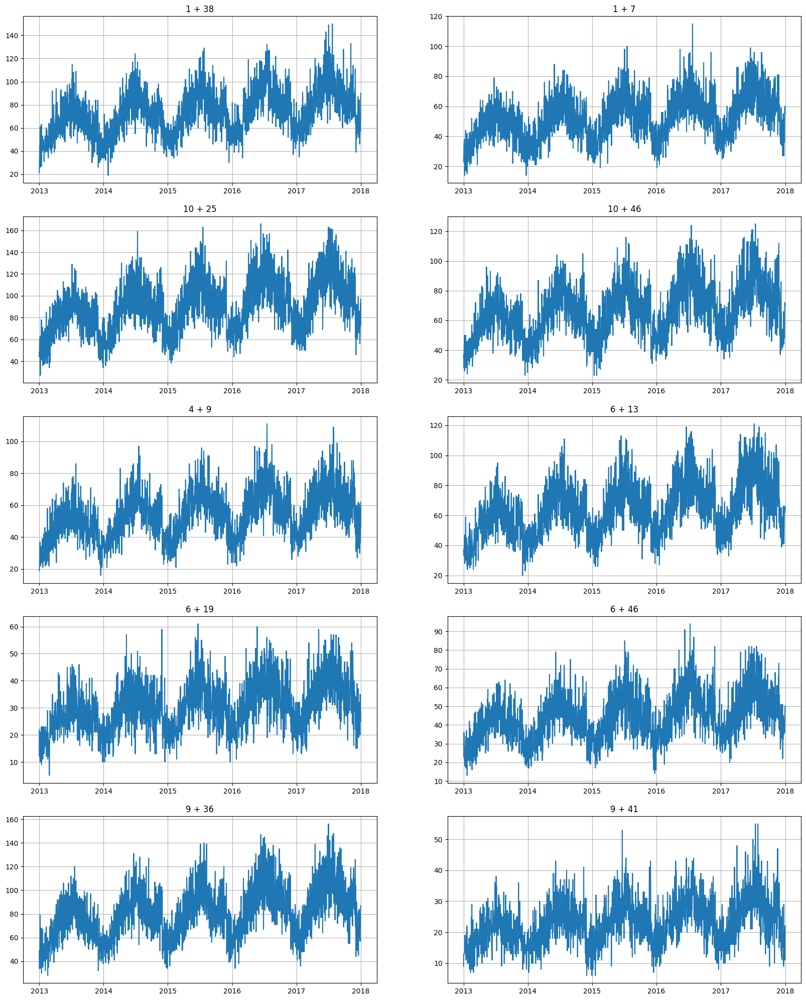

In [20]:
ts.plot()

In [21]:
ts.describe()

,start_timestamp,end_timestamp,length,num_missing,num_segments,num_exogs,num_regressors,num_known_future,freq
segments,,,,,,,,,
1 + 1,2013-01-01,2017-12-31,1826,0,500,5,5,5,D
1 + 10,2013-01-01,2017-12-31,1826,0,500,5,5,5,D
1 + 11,2013-01-01,2017-12-31,1826,0,500,5,5,5,D
1 + 12,2013-01-01,2017-12-31,1826,0,500,5,5,5,D
1 + 13,2013-01-01,2017-12-31,1826,0,500,5,5,5,D
...,...,...,...,...,...,...,...,...,...
9 + 50,2013-01-01,2017-12-31,1826,0,500,5,5,5,D
9 + 6,2013-01-01,2017-12-31,1826,0,500,5,5,5,D
9 + 7,2013-01-01,2017-12-31,1826,0,500,5,5,5,D


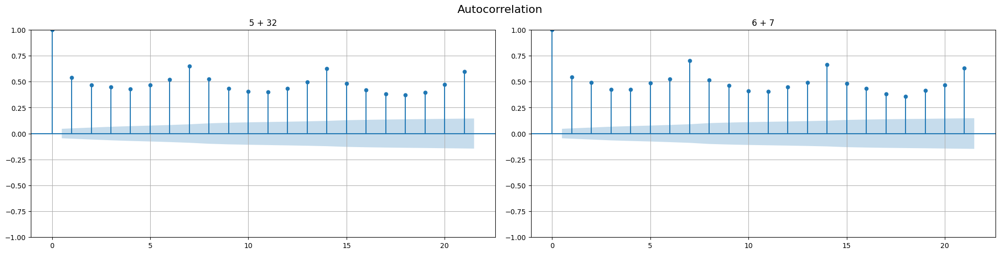

In [53]:
acf_plot(ts, lags=21, n_segments=2)

In [46]:
fig_dir = Path(root_path) / "figures"
fig_dir.mkdir(parents=True, exist_ok=True)

1 + 31 len: 1826 nan: feature
target    0
dtype: int64


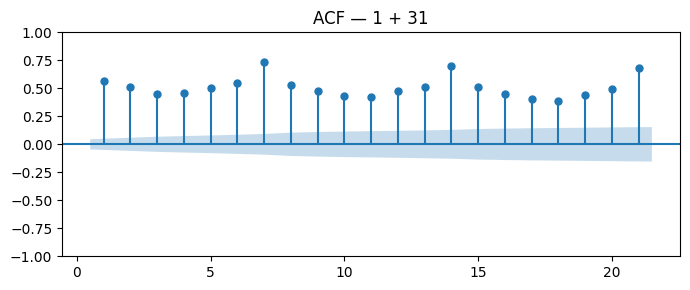

1 + 32 len: 1826 nan: feature
target    0
dtype: int64


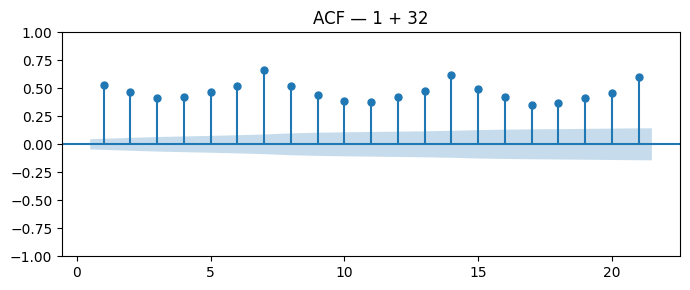

In [51]:
from statsmodels.graphics.tsaplots import plot_acf

segments = ['1 + 31', '1 + 32']  
data_wide = ts[:, :, 'target']   

for seg in segments:
    assert seg in data_wide.columns, f"Сегмент {seg} не найден! Доступные: {list(data_wide.columns)[:5]}..."
    s = data_wide[seg].astype(float).dropna()
    print(seg, "len:", len(s), "nan:", s.isna().sum())

    fig, ax = plt.subplots(figsize=(7,3))
    plot_acf(s, lags=21, ax=ax, zero=False)
    ax.set_title(f'ACF — {seg}')
    fig.tight_layout()
    fig.canvas.draw()  
    fig.savefig(fig_dir / f"acf_lags21_{seg.replace(' ','_').replace('+','_')}.png",
                dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)

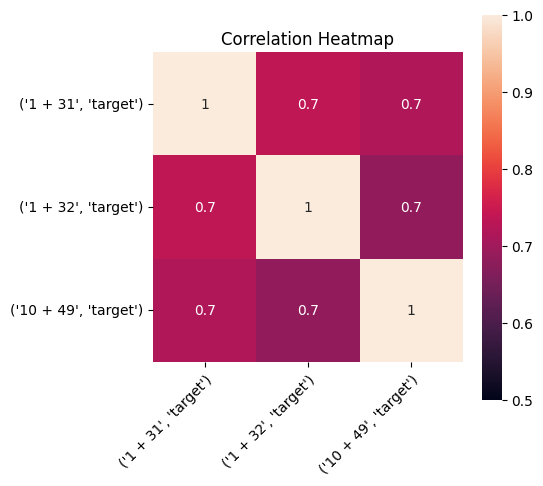

In [55]:
prev_ids = {m.num for m in Gcf.get_all_fig_managers()}

plot_correlation_matrix(
    ts,
    columns=['target'],
    segments=['1 + 31', '1 + 32', '10 + 49'],
    method="spearman", vmin=0.5, vmax=1, figsize=(5,5)
)

new_figs = [m.canvas.figure for m in Gcf.get_all_fig_managers() if m.num not in prev_ids]
fig = new_figs[-1] 
fig.canvas.draw()
fig.savefig(fig_dir / "corr_matrix_spearman_target_sel_segments.png", dpi=200, bbox_inches="tight")
plt.show()
plt.close(fig)

<Figure size 640x480 with 0 Axes>

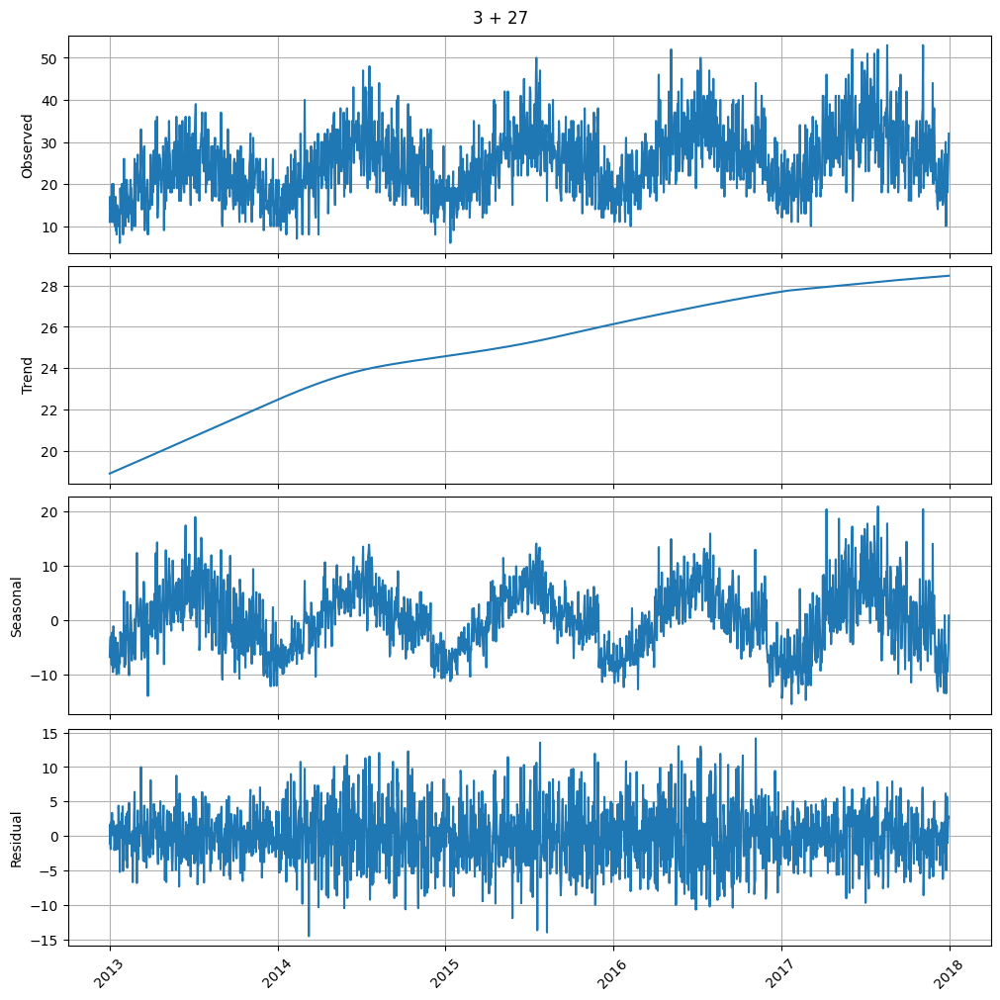

<Figure size 640x480 with 0 Axes>

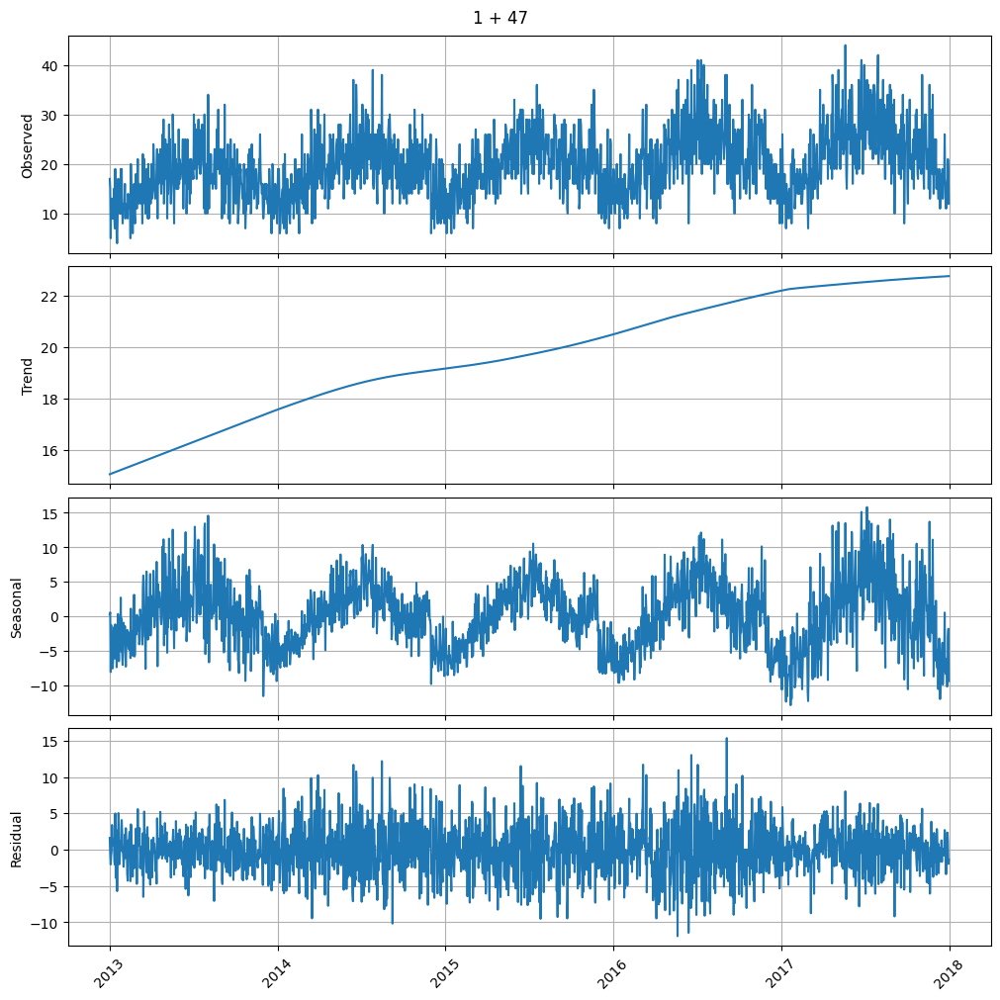

In [57]:
for seg in SEGMENTS_TO_SHOW:
    plt.figure()
    stl_plot(ts=ts, period=365, segments=[seg])
    fig = plt.gcf()
    fig.savefig(fig_dir / f"stl_period365_{seg.replace(' ', '_').replace('+','_')}.png", dpi=200, bbox_inches="tight")
    plt.show()
    plt.close(fig)

## Выводы по анализу временных рядов

### 1. Автокорреляция (ACF)
- Для выбранных сегментов наблюдается **устойчивая положительная автокорреляция** на многих лагах.
- Явно видна **сезонность**:
  - недельная (лаги, кратные 7 дням);
  - годовая (период ~365 дней).
- Это указывает на необходимость включения в модель **сезонных лагов** и параметров, учитывающих краткосрочные и долгосрочные циклы.

### 2. Корреляция между сегментами
- Высокие значения корреляции (>0.7) между отдельными сегментами.
- Возможен прирост точности при использовании **многосегментных (мультивариантных) моделей**, которые учитывают взаимосвязи между сериями (ETNA multisegment, VAR, Prophet с несколькими сегментами).

### 3. STL-декомпозиция
- **Сезонный компонент** выражен внутри года, с повторяющимися пиками и провалами.
- **Тренд** положительный — наблюдается общий рост продаж за весь период.
- **Остатки** в целом шумовые, но с отдельными локальными всплесками, что может быть связано с событиями (акции, праздники и т.п.).

## Рекомендации для дальнейшей работы

1. **Фичеинжиниринг**
   - Добавить регрессоры: месяц, неделя года, день недели, праздничные дни.
   - Включить лаги, кратные 7, 14, 365.
   - Добавить скользящие средние по окнам 7 и 30 дней.

2. **Выбор моделей**
   - Протестировать:
     - Модели с явной сезонностью (SARIMA/SARIMAX, Prophet, ETS).
     - ETNA/AutoTS с seasonal_params (365 и 7).
     - Мультивариантные модели (VAR, многосегментный Prophet).
   - Сравнить с базовыми одноcегментными моделями.

3. **Валидация**
   - Использовать backtesting с горизонтом 90 дней.
   - Проверять устойчивость качества на разных сегментах.

**Следующий шаг**: построить базовые и сезонно-усиленные модели (ETNA, AutoTS, PыCaret Time Series) с учётом выявленнх паттернов и сравнить их точность.


# 0. Naive Model

[Naive_recursive] SMAPE avg: 27.4699 | fit+forecast: 570.9s
[Naive_recursive] SMAPE backtest avg: 24.6926


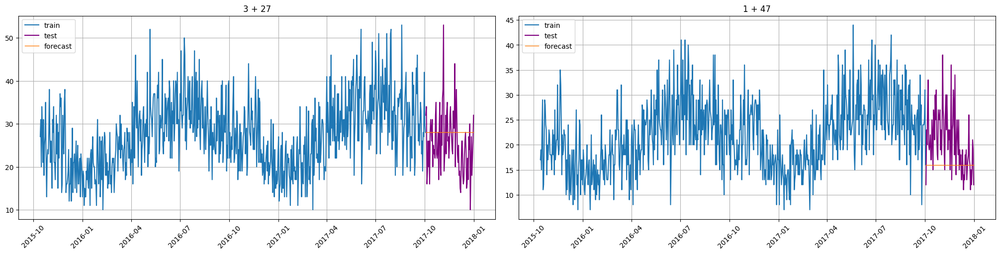

In [70]:
naive_model_recursive_metrics = train_and_evaluate_model(
    ts=ts,
    model=NaiveModel(),
    transforms=[],
    horizon=HORIZON,
    metrics=smape,
    model_name="Naive_recursive",
    is_auto_regressive=True,
    print_metrics=True,
)

[Naive_non_recursive] SMAPE avg: 27.4699 | fit+forecast: 3.4s
[Naive_non_recursive] SMAPE backtest avg: 24.6926


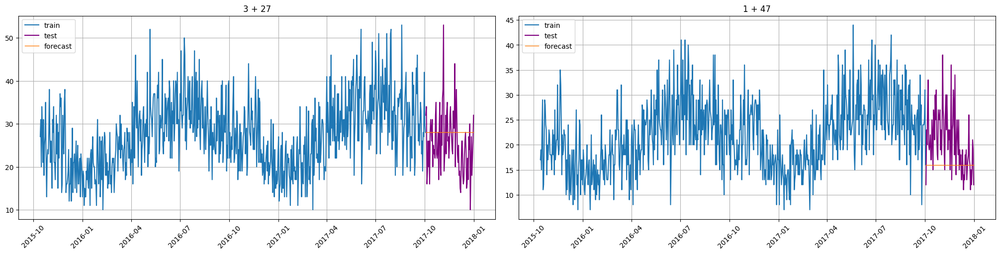

In [71]:
naive_model_NON_recursive_metrics = train_and_evaluate_model(
    ts=ts,
    model=NaiveModel(),
    transforms=[],
    horizon=HORIZON,
    metrics=smape,
    model_name="Naive_non_recursive",
    is_auto_regressive=False,
    print_metrics=True,
)

# 1. Linear Model

[Elastic_linear_AR] SMAPE avg: 19.7338 | fit+forecast: 1343.7s
[Elastic_linear_AR] SMAPE backtest avg: 23.1960


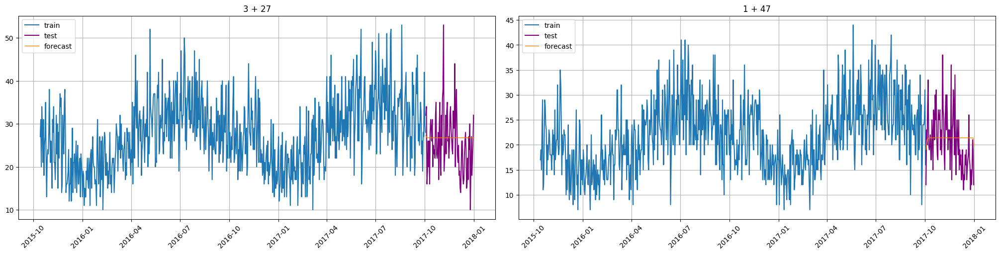

In [73]:
standardscaler = StandardScalerTransform(in_column=None)

mean7 = MeanTransform(in_column="target", window=7, out_column="mean_7")

lags = LagTransform(in_column="target", lags=[1], out_column="lag")

elast_transforms = [lags, mean7, standardscaler]

linear_model_metrics = train_and_evaluate_model(
    ts=ts,
    model=ElasticPerSegmentModel(l1_ratio=0, alpha=0, random_state=42),
    transforms=elast_transforms,
    horizon=HORIZON,
    metrics=smape,
    model_name="Elastic_linear_AR",  
    is_auto_regressive=True,
    print_metrics=True,
)

## Linear (улучшенный фичеинжиниринг)

[Linear_AR_rich_feats] SMAPE avg: 15.6161 | fit+forecast: 1532.2s
[Linear_AR_rich_feats] SMAPE backtest avg: 16.5324


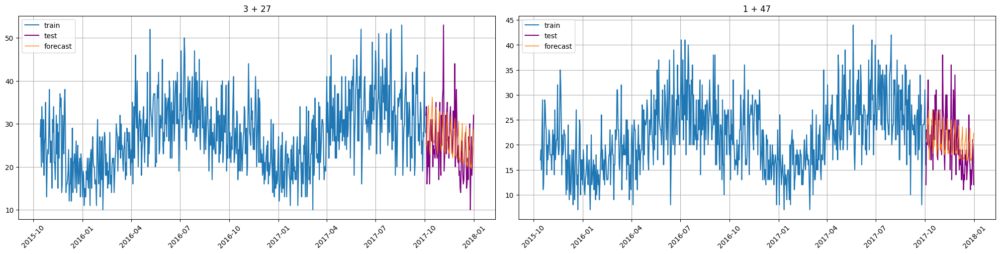

In [78]:
transforms_linear = [
    StandardScalerTransform(in_column="target"),
    MeanTransform(in_column="target", window=7, out_column="mean_7"),
    MeanTransform(in_column="target", window=28, out_column="mean_28"),
    LagTransform(in_column="target", lags=[1,2,7,14,28]),
    DateFlagsTransform(
        day_number_in_week=True,
        week_number_in_year=True,
        month_number_in_year=True,
        is_weekend=True
    ),
    FourierTransform(in_column="target", period=7, order=3),
    FourierTransform(in_column="target", period=365.25, order=5),
]

_ = train_and_evaluate_model(
    ts=ts,
    model=LinearPerSegmentModel(),
    transforms=transforms_linear,
    horizon=HORIZON,
    metrics=smape,
    model_name="Linear_AR_rich_feats",
    is_auto_regressive=True,
    print_metrics=True,
)

## CatBoostPerSegmentModel

[CatBoost_AR_rich_feats] SMAPE avg: 48.0215 | fit+forecast: 13003.5s
[CatBoost_AR_rich_feats] SMAPE backtest avg: 51.1842


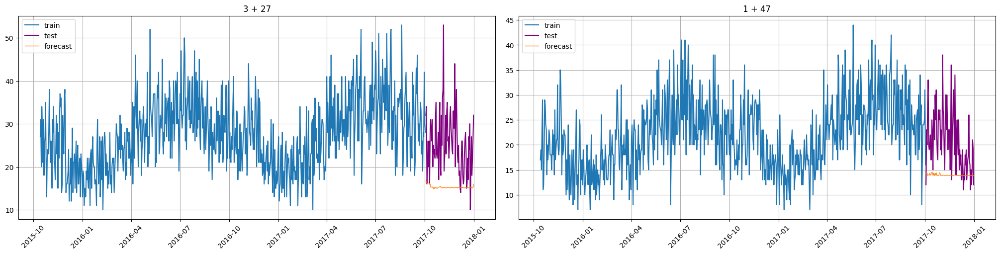

In [82]:
cat = CatBoostPerSegmentModel(
    depth=6, learning_rate=0.1, l2_leaf_reg=3.0, random_state=42, thread_count=-1
)
_ = train_and_evaluate_model(
    ts=ts,
    model=cat,
    transforms=transforms_linear,      
    horizon=HORIZON,
    metrics=smape,
    model_name="CatBoost_AR_rich_feats",
    is_auto_regressive=True,
    print_metrics=True,
)

## CatBoost-tuned

In [ ]:
# CatBoost: multi-segment если доступен, иначе per-segment
try:
    from etna.models import CatBoostMultiSegmentModel as _CBModel
except ImportError:
    from etna.models import CatBoostPerSegmentModel as _CBModel

# Признаки:
# - лог-стабилизация
# - календарные флаги
# - Фурье: недельная/годовая
# - расширенные лаги (короткие, недельные, длинные)
transforms_cb_rich = [
    AddConstTransform(in_column="target", value=1e-3, inplace=True),
    LogTransform(in_column="target", inplace=True),

    DateFlagsTransform(
        day_number_in_week=True,
        week_number_in_year=True,
        month_number_in_year=True,
        is_weekend=True,
    ),

    # недельная сезонность
    FourierTransform(in_column="target", period=7, order=3),
    # годовая сезонность
    FourierTransform(in_column="target", period=365, order=6),

    # лаги: 1..7, недельные и «длинные»
    LagTransform(
        in_column="target",
        lags=[1,2,3,4,5,6,7, 14,21,28,35,42,56, 63,84]
    ),
]

cat_rich = _CBModel(
    iterations=2500,
    depth=8,
    learning_rate=0.03,
    l2_leaf_reg=3.0,
    loss_function="MAE",
    random_state=42,
    thread_count=-1,
    early_stopping_rounds=200,
)

_ = train_and_evaluate_model(
    ts=ts,
    model=cat_rich,
    transforms=transforms_cb_rich,
    horizon=HORIZON,
    metrics=smape,
    model_name="CatBoost_rich_lags_fourier",
    is_auto_regressive=True,      # есть LagTransform → AR-пайплайн
    print_metrics=True,
    do_backtest=True,
    n_folds_backtest=5,
)

[CatBoost_rich_lags_fourier] SMAPE avg: 44.4352 | fit+forecast: 2512.6s


## ProphetModel_additive

11:57:33 - cmdstanpy - INFO - Chain [1] start processing
11:57:34 - cmdstanpy - INFO - Chain [1] done processing
11:57:34 - cmdstanpy - INFO - Chain [1] start processing
11:57:34 - cmdstanpy - INFO - Chain [1] done processing
11:57:34 - cmdstanpy - INFO - Chain [1] start processing
11:57:35 - cmdstanpy - INFO - Chain [1] done processing
11:57:35 - cmdstanpy - INFO - Chain [1] start processing
11:57:35 - cmdstanpy - INFO - Chain [1] done processing
11:57:35 - cmdstanpy - INFO - Chain [1] start processing
11:57:36 - cmdstanpy - INFO - Chain [1] done processing
11:57:36 - cmdstanpy - INFO - Chain [1] start processing
11:57:36 - cmdstanpy - INFO - Chain [1] done processing
11:57:36 - cmdstanpy - INFO - Chain [1] start processing
11:57:37 - cmdstanpy - INFO - Chain [1] done processing
11:57:37 - cmdstanpy - INFO - Chain [1] start processing
11:57:37 - cmdstanpy - INFO - Chain [1] done processing
11:57:37 - cmdstanpy - INFO - Chain [1] start processing
11:57:37 - cmdstanpy - INFO - Chain [1]

[Prophet_additive] SMAPE avg: 13.2380 | fit+forecast: 378.5s


12:08:55 - cmdstanpy - INFO - Chain [1] start processing
12:08:55 - cmdstanpy - INFO - Chain [1] done processing
12:08:55 - cmdstanpy - INFO - Chain [1] start processing
12:08:56 - cmdstanpy - INFO - Chain [1] done processing
12:08:56 - cmdstanpy - INFO - Chain [1] start processing
12:08:56 - cmdstanpy - INFO - Chain [1] done processing
12:08:56 - cmdstanpy - INFO - Chain [1] start processing
12:08:56 - cmdstanpy - INFO - Chain [1] done processing
12:08:56 - cmdstanpy - INFO - Chain [1] start processing
12:08:56 - cmdstanpy - INFO - Chain [1] done processing
12:08:57 - cmdstanpy - INFO - Chain [1] start processing
12:08:57 - cmdstanpy - INFO - Chain [1] done processing
12:08:57 - cmdstanpy - INFO - Chain [1] start processing
12:08:57 - cmdstanpy - INFO - Chain [1] start processing
12:08:57 - cmdstanpy - INFO - Chain [1] done processing
12:08:57 - cmdstanpy - INFO - Chain [1] done processing
12:08:58 - cmdstanpy - INFO - Chain [1] start processing
12:08:58 - cmdstanpy - INFO - Chain [1]

[Prophet_additive] SMAPE backtest avg: 13.0862


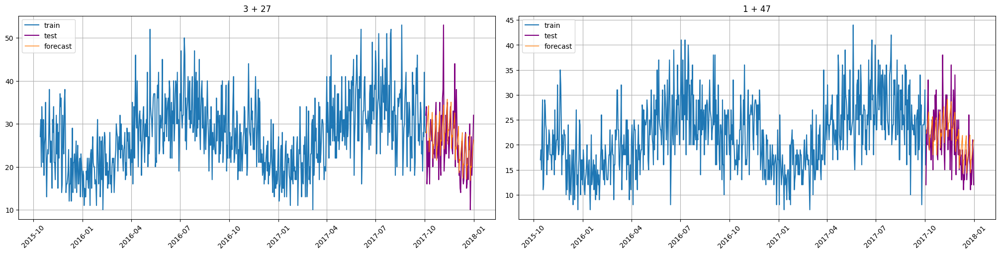

In [83]:
transforms_prophet_add = [
    # без скейлера и фурье — пусть Prophet сам
    DateFlagsTransform(
        day_number_in_week=True,
        week_number_in_year=True,
        month_number_in_year=True,
        is_weekend=True
    ),
]

prophet_add = ProphetModel(
    growth="linear",
    seasonality_mode="additive",
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
)

_ = train_and_evaluate_model(
    ts=ts,
    model=prophet_add,
    transforms=transforms_prophet_add,
    horizon=HORIZON,
    metrics=smape,
    model_name="Prophet_additive",
    is_auto_regressive=False,
    print_metrics=True,
)

## ProphetModel_multiplicative

12:31:51 - cmdstanpy - INFO - Chain [1] start processing
12:31:51 - cmdstanpy - INFO - Chain [1] done processing
12:31:52 - cmdstanpy - INFO - Chain [1] start processing
12:31:52 - cmdstanpy - INFO - Chain [1] done processing
12:31:52 - cmdstanpy - INFO - Chain [1] start processing
12:31:52 - cmdstanpy - INFO - Chain [1] done processing
12:31:53 - cmdstanpy - INFO - Chain [1] start processing
12:31:53 - cmdstanpy - INFO - Chain [1] done processing
12:31:53 - cmdstanpy - INFO - Chain [1] start processing
12:31:53 - cmdstanpy - INFO - Chain [1] done processing
12:31:53 - cmdstanpy - INFO - Chain [1] start processing
12:31:54 - cmdstanpy - INFO - Chain [1] done processing
12:31:54 - cmdstanpy - INFO - Chain [1] start processing
12:31:54 - cmdstanpy - INFO - Chain [1] done processing
12:31:54 - cmdstanpy - INFO - Chain [1] start processing
12:31:55 - cmdstanpy - INFO - Chain [1] done processing
12:31:55 - cmdstanpy - INFO - Chain [1] start processing
12:31:55 - cmdstanpy - INFO - Chain [1]

[Prophet_multiplicative] SMAPE avg: 13.2194 | fit+forecast: 375.0s


12:43:17 - cmdstanpy - INFO - Chain [1] start processing
12:43:17 - cmdstanpy - INFO - Chain [1] done processing
12:43:17 - cmdstanpy - INFO - Chain [1] start processing
12:43:17 - cmdstanpy - INFO - Chain [1] done processing
12:43:17 - cmdstanpy - INFO - Chain [1] start processing
12:43:17 - cmdstanpy - INFO - Chain [1] done processing
12:43:18 - cmdstanpy - INFO - Chain [1] start processing
12:43:18 - cmdstanpy - INFO - Chain [1] done processing
12:43:18 - cmdstanpy - INFO - Chain [1] start processing
12:43:18 - cmdstanpy - INFO - Chain [1] done processing
12:43:18 - cmdstanpy - INFO - Chain [1] start processing
12:43:19 - cmdstanpy - INFO - Chain [1] done processing
12:43:19 - cmdstanpy - INFO - Chain [1] start processing
12:43:19 - cmdstanpy - INFO - Chain [1] done processing
12:43:19 - cmdstanpy - INFO - Chain [1] start processing
12:43:19 - cmdstanpy - INFO - Chain [1] start processing
12:43:20 - cmdstanpy - INFO - Chain [1] done processing
12:43:20 - cmdstanpy - INFO - Chain [1]

[Prophet_multiplicative] SMAPE backtest avg: 12.8018


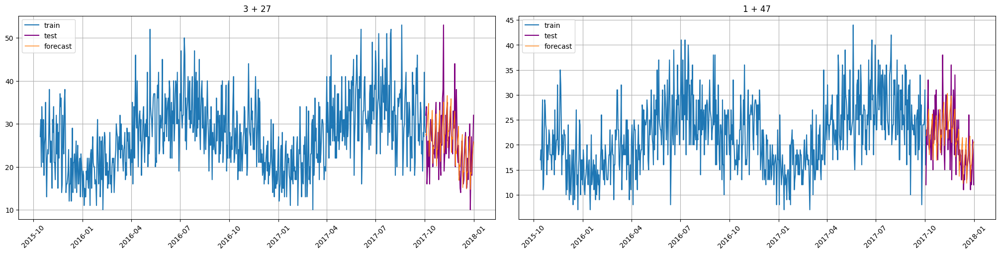

In [84]:
transforms_prophet_mul = [
    DateFlagsTransform(
        day_number_in_week=True,
        week_number_in_year=True,
        month_number_in_year=True,
        is_weekend=True
    ),
]

prophet_mul = ProphetModel(
    growth="linear",
    seasonality_mode="multiplicative",
    yearly_seasonality=True,
    weekly_seasonality=True,
    daily_seasonality=False,
)

_ = train_and_evaluate_model(
    ts=ts,
    model=prophet_mul,
    transforms=transforms_prophet_mul,
    horizon=HORIZON,
    metrics=smape,
    model_name="Prophet_multiplicative",
    is_auto_regressive=False,
    print_metrics=True,
)

## ProphetModel_additive_tuned

13:33:26 - cmdstanpy - INFO - Chain [1] start processing
13:33:27 - cmdstanpy - INFO - Chain [1] done processing
13:33:27 - cmdstanpy - INFO - Chain [1] start processing
13:33:28 - cmdstanpy - INFO - Chain [1] done processing
13:33:28 - cmdstanpy - INFO - Chain [1] start processing
13:33:29 - cmdstanpy - INFO - Chain [1] done processing
13:33:30 - cmdstanpy - INFO - Chain [1] start processing
13:33:31 - cmdstanpy - INFO - Chain [1] done processing
13:33:31 - cmdstanpy - INFO - Chain [1] start processing
13:33:32 - cmdstanpy - INFO - Chain [1] done processing
13:33:32 - cmdstanpy - INFO - Chain [1] start processing
13:33:33 - cmdstanpy - INFO - Chain [1] done processing
13:33:34 - cmdstanpy - INFO - Chain [1] start processing
13:33:35 - cmdstanpy - INFO - Chain [1] done processing
13:33:35 - cmdstanpy - INFO - Chain [1] start processing
13:33:36 - cmdstanpy - INFO - Chain [1] done processing
13:33:36 - cmdstanpy - INFO - Chain [1] start processing
13:33:37 - cmdstanpy - INFO - Chain [1]

[Prophet_log_strong] SMAPE avg: 12.9597 | fit+forecast: 706.0s


13:50:43 - cmdstanpy - INFO - Chain [1] start processing
13:50:43 - cmdstanpy - INFO - Chain [1] done processing
13:50:44 - cmdstanpy - INFO - Chain [1] start processing
13:50:44 - cmdstanpy - INFO - Chain [1] start processing
13:50:44 - cmdstanpy - INFO - Chain [1] done processing
13:50:45 - cmdstanpy - INFO - Chain [1] done processing
13:50:45 - cmdstanpy - INFO - Chain [1] start processing
13:50:45 - cmdstanpy - INFO - Chain [1] done processing
13:50:45 - cmdstanpy - INFO - Chain [1] start processing
13:50:46 - cmdstanpy - INFO - Chain [1] start processing
13:50:46 - cmdstanpy - INFO - Chain [1] done processing
13:50:46 - cmdstanpy - INFO - Chain [1] done processing
13:50:47 - cmdstanpy - INFO - Chain [1] start processing
13:50:47 - cmdstanpy - INFO - Chain [1] start processing
13:50:47 - cmdstanpy - INFO - Chain [1] done processing
13:50:48 - cmdstanpy - INFO - Chain [1] done processing
13:50:48 - cmdstanpy - INFO - Chain [1] start processing
13:50:48 - cmdstanpy - INFO - Chain [1]

[Prophet_log_strong] SMAPE backtest avg: 12.7924


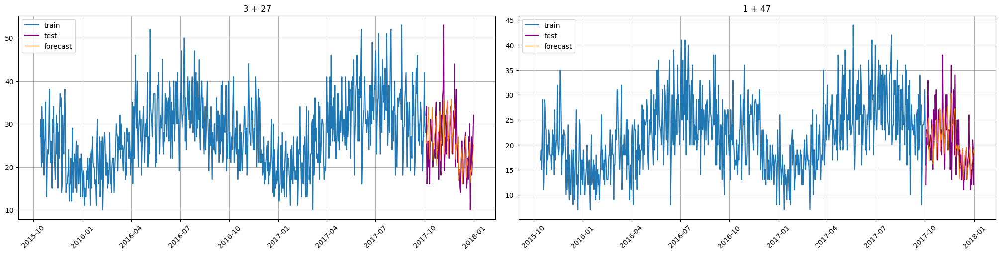

In [90]:
# Экзогены календаря + лог-стабилизация таргета
transforms_prophet_log = [
    AddConstTransform(in_column="target", value=1e-3, inplace=True),  # маленький сдвиг
    LogTransform(in_column="target", inplace=True),                   # логарифм
    DateFlagsTransform(
        day_number_in_week=True,
        week_number_in_year=True,
        month_number_in_year=True,
        is_weekend=True
    ),
]

# Сильная конфигурация Prophet на лог-шкале
prophet_log_strong = ProphetModel(
    growth="linear",
    seasonality_mode="additive",   # на лог-шкале = мультипликативности
    yearly_seasonality=20,         # богаче годовая сезонность
    weekly_seasonality=12,         # богаче недельная
    daily_seasonality=False,
    changepoint_prior_scale=0.5,   # гибче тренд
    seasonality_prior_scale=20,    # усиливаем сезонности
    n_changepoints=60,
    changepoint_range=0.95,
)

_ = train_and_evaluate_model(
    ts=ts,
    model=prophet_log_strong,
    transforms=transforms_prophet_log,
    horizon=HORIZON,
    metrics=smape,
    model_name="Prophet_log_strong",
    is_auto_regressive=False,
    print_metrics=True,
    do_backtest=True,
    n_folds_backtest=5
)

## ProphetModel_additive_max

14:22:18 - cmdstanpy - INFO - Chain [1] start processing
14:22:18 - cmdstanpy - INFO - Chain [1] done processing
14:22:19 - cmdstanpy - INFO - Chain [1] start processing
14:22:20 - cmdstanpy - INFO - Chain [1] done processing
14:22:20 - cmdstanpy - INFO - Chain [1] start processing
14:22:21 - cmdstanpy - INFO - Chain [1] done processing
14:22:22 - cmdstanpy - INFO - Chain [1] start processing
14:22:23 - cmdstanpy - INFO - Chain [1] done processing
14:22:24 - cmdstanpy - INFO - Chain [1] start processing
14:22:25 - cmdstanpy - INFO - Chain [1] done processing
14:22:26 - cmdstanpy - INFO - Chain [1] start processing
14:22:27 - cmdstanpy - INFO - Chain [1] done processing
14:22:27 - cmdstanpy - INFO - Chain [1] start processing
14:22:28 - cmdstanpy - INFO - Chain [1] done processing
14:22:29 - cmdstanpy - INFO - Chain [1] start processing
14:22:30 - cmdstanpy - INFO - Chain [1] done processing
14:22:30 - cmdstanpy - INFO - Chain [1] start processing
14:22:31 - cmdstanpy - INFO - Chain [1]

[Prophet_log_ultra] SMAPE avg: 12.9610 | fit+forecast: 780.5s


14:40:44 - cmdstanpy - INFO - Chain [1] start processing
14:40:45 - cmdstanpy - INFO - Chain [1] start processing
14:40:45 - cmdstanpy - INFO - Chain [1] done processing
14:40:45 - cmdstanpy - INFO - Chain [1] done processing
14:40:45 - cmdstanpy - INFO - Chain [1] start processing
14:40:46 - cmdstanpy - INFO - Chain [1] done processing
14:40:46 - cmdstanpy - INFO - Chain [1] start processing
14:40:47 - cmdstanpy - INFO - Chain [1] start processing
14:40:47 - cmdstanpy - INFO - Chain [1] start processing
14:40:47 - cmdstanpy - INFO - Chain [1] done processing
14:40:48 - cmdstanpy - INFO - Chain [1] done processing
14:40:48 - cmdstanpy - INFO - Chain [1] done processing
14:40:48 - cmdstanpy - INFO - Chain [1] start processing
14:40:49 - cmdstanpy - INFO - Chain [1] done processing
14:40:49 - cmdstanpy - INFO - Chain [1] start processing
14:40:49 - cmdstanpy - INFO - Chain [1] start processing
14:40:49 - cmdstanpy - INFO - Chain [1] done processing
14:40:50 - cmdstanpy - INFO - Chain [1]

[Prophet_log_ultra] SMAPE backtest avg: 12.7826


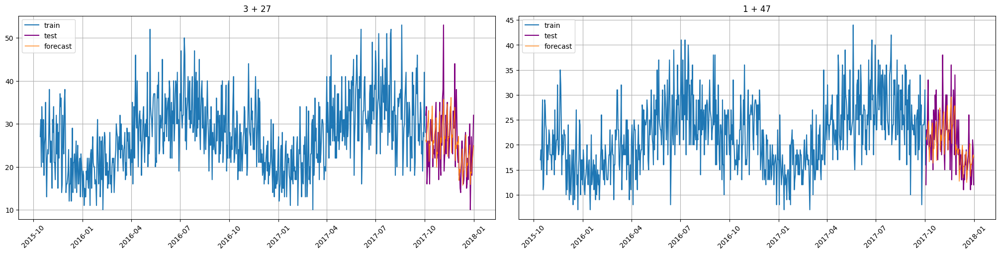

In [91]:
prophet_log_ultra = ProphetModel(
    growth="linear",
    seasonality_mode="additive",
    yearly_seasonality=25,
    weekly_seasonality=15,
    daily_seasonality=False,
    changepoint_prior_scale=0.4,
    seasonality_prior_scale=18,
    n_changepoints=80,
    changepoint_range=0.95,
)

_ = train_and_evaluate_model(
    ts=ts,
    model=prophet_log_ultra,
    transforms=transforms_prophet_log,
    horizon=HORIZON,
    metrics=smape,
    model_name="Prophet_log_ultra",
    is_auto_regressive=False,
    print_metrics=True,
    do_backtest=True,
    n_folds_backtest=5
)

## Prophet-tuned

16:11:50 - cmdstanpy - INFO - Chain [1] start processing
16:11:51 - cmdstanpy - INFO - Chain [1] done processing
16:11:52 - cmdstanpy - INFO - Chain [1] start processing
16:11:53 - cmdstanpy - INFO - Chain [1] done processing
16:11:53 - cmdstanpy - INFO - Chain [1] start processing
16:11:54 - cmdstanpy - INFO - Chain [1] done processing
16:11:55 - cmdstanpy - INFO - Chain [1] start processing
16:11:56 - cmdstanpy - INFO - Chain [1] done processing
16:11:57 - cmdstanpy - INFO - Chain [1] start processing
16:11:58 - cmdstanpy - INFO - Chain [1] done processing
16:11:59 - cmdstanpy - INFO - Chain [1] start processing
16:11:59 - cmdstanpy - INFO - Chain [1] done processing
16:12:00 - cmdstanpy - INFO - Chain [1] start processing
16:12:01 - cmdstanpy - INFO - Chain [1] done processing
16:12:02 - cmdstanpy - INFO - Chain [1] start processing
16:12:03 - cmdstanpy - INFO - Chain [1] done processing
16:12:03 - cmdstanpy - INFO - Chain [1] start processing
16:12:04 - cmdstanpy - INFO - Chain [1]

[Prophet_log_plus_final] SMAPE avg: 12.9444 | fit+forecast: 846.7s


16:30:40 - cmdstanpy - INFO - Chain [1] start processing
16:30:40 - cmdstanpy - INFO - Chain [1] start processing
16:30:40 - cmdstanpy - INFO - Chain [1] done processing
16:30:40 - cmdstanpy - INFO - Chain [1] done processing
16:30:41 - cmdstanpy - INFO - Chain [1] start processing
16:30:41 - cmdstanpy - INFO - Chain [1] done processing
16:30:42 - cmdstanpy - INFO - Chain [1] start processing
16:30:42 - cmdstanpy - INFO - Chain [1] done processing
16:30:42 - cmdstanpy - INFO - Chain [1] start processing
16:30:42 - cmdstanpy - INFO - Chain [1] start processing
16:30:43 - cmdstanpy - INFO - Chain [1] done processing
16:30:43 - cmdstanpy - INFO - Chain [1] start processing
16:30:43 - cmdstanpy - INFO - Chain [1] done processing
16:30:44 - cmdstanpy - INFO - Chain [1] start processing
16:30:44 - cmdstanpy - INFO - Chain [1] done processing
16:30:45 - cmdstanpy - INFO - Chain [1] start processing
16:30:45 - cmdstanpy - INFO - Chain [1] start processing
16:30:45 - cmdstanpy - INFO - Chain [1

[Prophet_log_plus_final] SMAPE backtest avg: 12.7799


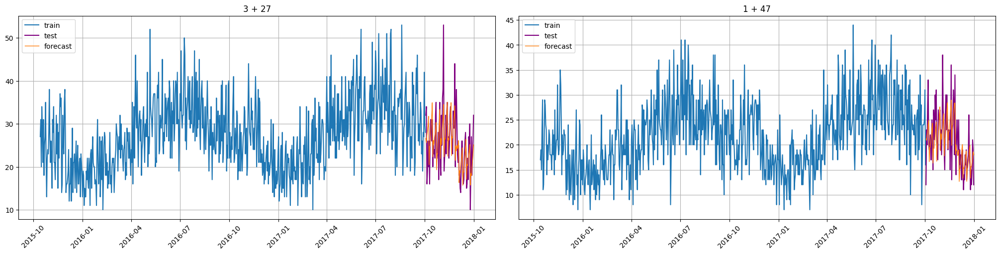

In [16]:
# Календарные фичи + лог-стабилизация таргета
transforms_prophet_final = [
    AddConstTransform(in_column="target", value=1e-3, inplace=True),
    LogTransform(in_column="target", inplace=True),
    DateFlagsTransform(
        day_number_in_week=True,
        week_number_in_year=True,
        month_number_in_year=True,
        day_number_in_month=True,
        is_weekend=True,
    ),
]

# Усиленная конфигурация Prophet:
# additive на лог-шкале ≈ мультипликативность на исходной
prophet_final = ProphetModel(
    growth="linear",
    seasonality_mode="additive",
    yearly_seasonality=30,    # богаче годовая сезонность
    weekly_seasonality=15,    # богаче недельная
    daily_seasonality=False,
    n_changepoints=120,       # больше точек смены тренда
    changepoint_range=0.95,   # позволяем изменения тренда почти на всей истории
    changepoint_prior_scale=0.3,  # гибче тренд (но не слишком)
    seasonality_prior_scale=20,   # усиливаем сезонности
)

# Запуск через вашу универсальную функцию: печать holdout и backtest + лог в results.csv
_ = train_and_evaluate_model(
    ts=ts,
    model=prophet_final,
    transforms=transforms_prophet_final,
    horizon=HORIZON,
    metrics=smape,
    model_name="Prophet_log_plus_final",
    is_auto_regressive=False,
    print_metrics=True,
    do_backtest=True,
    n_folds_backtest=5,
)

### Из-за ограничений по ресурсам тяжелые модели и ансамбли тестировались на сокращённой выборке данных; финальная валидация лучших моделей проводилась на полном наборе данных (holdout)

In [29]:
# Параметры "урезания" 
MONTHS = 24          # окно по времени
N_SEGMENTS = 20      # сколько сегментов оставить (топ по target)

full_df = ts.df  # wide-формат: index = timestamp, columns = (segment, feature)

# Срез по времени
last_ts = full_df.index.max()
cutoff  = last_ts - pd.DateOffset(months=MONTHS)
df_small_wide = full_df.loc[full_df.index >= cutoff].copy()

# Выбор топ-N сегментов по сумме target
# если вдруг нет feature 'target' — это ошибка структуры данных
if "target" not in df_small_wide.columns.get_level_values(1):
    raise ValueError("В wide-данных нет feature 'target' — проверь формирование ts.df")

tgt = df_small_wide.loc[:, (slice(None), "target")]
top_segments = (
    tgt.sum()
       .sort_values(ascending=False)
       .head(N_SEGMENTS)
       .index.get_level_values(0)
       .tolist()
)

# Оставляем только feature='target' и создаём полный продукт колонок
features   = ["target"]
full_cols  = pd.MultiIndex.from_product([top_segments, features], names=["segment", "feature"])

# оставляем только target
df_small_wide = df_small_wide.loc[:, (slice(None), "target")]

# переиндексация колонок под полный набор (отсутствующие столбцы станут NaN)
df_small_wide = df_small_wide.reindex(columns=full_cols)

# Приведение типов к float32 для экономии RAM
df_small_wide.loc[:, (slice(None), "target")] = (
    df_small_wide.loc[:, (slice(None), "target")].astype("float32")
)

# Экзогены 
exog_small = None
exog_full = getattr(ts, "df_exog", None)

if exog_full is not None:
    # экзогены начинаем с минимальной даты в урезанной эндогенке
    start_dt = df_small_wide.index.min()

    # своя маска по ИНДЕКСУ экзогенов 
    exog_small = exog_full.loc[exog_full.index >= start_dt].copy()

    # пересечение сегментов между экзогенами и выбранными top_segments
    exog_segments = exog_small.columns.get_level_values(0).unique().tolist()
    keep_segments = [s for s in top_segments if s in exog_segments]

    if len(keep_segments) == 0:
        # фолбэк: экзогены отсутствуют для выбранных сегментов — обучимся без них
        exog_small = None
    else:
        exog_small = exog_small.loc[:, (keep_segments, slice(None))]

        # float32 для численных экзогенов
        for feat in exog_small.columns.get_level_values(1).unique():
            block = exog_small.loc[:, (slice(None), feat)]
            # приводим только численные
            try:
                if block.dtypes.iloc[0].kind in "if":
                    exog_small.loc[:, (slice(None), feat)] = block.astype("float32")
            except Exception:
                # иногда столбцы гетерогенные — пропускаем
                pass

# Sanity-чеки перед сборкой TSDataset 
# одинаковый набор feature для всех сегментов?
assert set(df_small_wide.columns.get_level_values(1)) == {"target"}, "Должен остаться только feature 'target'"

# проверка длины окна относительно HORIZON (train_test_split дальше отрежет test на HORIZON)
min_train_len = df_small_wide.shape[0] - HORIZON
if min_train_len <= 0:
    raise ValueError(
        f"Слишком маленькое окно для выбранного HORIZON={HORIZON}. "
        f"Увеличь MONTHS или уменьши HORIZON (строк в окне: {df_small_wide.shape[0]})."
    )

# Сборка ts_small
ts_small = TSDataset(
    df=df_small_wide,
    freq=ts.freq,
    df_exog=exog_small,
    known_future="all" if exog_small is not None else None,
)

# Диагностика и доля данных
print("ts_small:", ts_small.df.shape, "segments:", len(ts_small.segments))
print("span:", ts_small.df.index.min(), "→", ts_small.df.index.max())

frac = ts_small.df.shape[0] / ts.df.shape[0]
print(f"≈ доля от полного датасета: {frac*100:.1f}%")

ts_small: (732, 120) segments: 20
span: 2015-12-31 00:00:00 → 2017-12-31 00:00:00
≈ доля от полного датасета: 40.1%


## SARIMAXModel

### Слегка изменяем фугкцию, чтобы видеть прогрессбар

In [35]:
@contextmanager
def tqdm_joblib(tqdm_object):
    """Показывает прогресс выполнения задач joblib внутри tqdm."""
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)
    old_cb = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_cb
        tqdm_object.close()

In [36]:
def train_and_evaluate_model(
        ts,
        model,
        transforms,
        horizon,
        metrics,
        model_name="model",
        is_auto_regressive=False,
        print_metrics=True,
        return_forecast=False,
        n_train_samples=360*2,
        segments_to_plot="auto",        
        do_backtest=True,
        n_folds_backtest=5,
        show_progress=True,
):
    """
    Обучает модель, делает holdout-прогноз на H шагов, считает метрику и опционально делает backtest.
    Результаты (средняя метрика) логируются в results.csv.
    """

    # Защита: metrics должен быть объектом метрики, а не списком
    if isinstance(metrics, (list, tuple)):
        raise ValueError("metrics должен быть одиночным объектом метрики, а не списком.")

    # Имя метрики
    mname = getattr(metrics, "__class__", type(metrics)).__name__

    # Разбивка
    train_ts, test_ts = ts.train_test_split(test_size=horizon)

    # Pipeline
    if not is_auto_regressive:
        pipe = Pipeline(model=model, transforms=transforms, horizon=horizon)
    else:
        pipe = AutoRegressivePipeline(model=model, transforms=transforms, horizon=horizon)

    # Holdout: fit + forecast
    t0 = time.time()
    pipe.fit(train_ts)
    forecast_ts = pipe.forecast()
    fit_forecast_sec = time.time() - t0

    # Метрики по сегментам (holdout)
    seg_scores = metrics(test_ts, forecast_ts)  # dict(segment -> score)
    seg_scores = pd.Series(seg_scores, name="score")
    avg_metric = float(seg_scores.mean())

    if print_metrics:
        print(f"[{model_name}] {mname} avg: {avg_metric:.4f} | fit+forecast: {fit_forecast_sec:.1f}s")

    # Плоты 
    # умный выбор сегментов для отрисовки
    to_plot = segments_to_plot
    try:
        if isinstance(to_plot, str) and to_plot.lower() == "auto":
            # берём топ-4 по суммарному target на трейне
            train_df = train_ts.to_pandas().xs("target", level="feature", axis=1)
            to_plot = list(train_df.sum().sort_values(ascending=False).head(4).index)
        elif to_plot is None:
            to_plot = []
        elif isinstance(to_plot, (list, tuple)):
            to_plot = list(to_plot)
        else:
            # если пришло что-то странное — не рисуем
            to_plot = []

        existing = [s for s in to_plot if s in test_ts.segments]
        # если после фильтра всё пусто — возьмём первые 4 доступных
        if not existing:
            existing = list(test_ts.segments)[:4]

        if existing:
            plot_forecast(
                forecast_ts, test_ts, train_ts,
                n_train_samples=n_train_samples,
                segments=existing
            )
    except Exception as e:
        # не валим обучение из-за проблем с графиками
        if print_metrics:
            print(f"[{model_name}] предупреждение: не удалось отрисовать графики ({e})")

    # Лог: holdout
    write_header = not results_file.exists()
    with open(results_file, mode="a", newline="") as f:
        writer = csv.writer(f)
        if write_header:
            writer.writerow(["model", "mode", "avg_metric"])
        writer.writerow([model_name, "holdout", avg_metric])

    # Backtest
    if do_backtest:
        total_tasks = n_folds_backtest  # прогресс по фолдам, чтобы не "залипал"

        try:
            if show_progress:
                with tqdm_joblib(tqdm(total=total_tasks, desc=f"Backtest [{model_name}]", leave=True)):
                    metrics_df, _, _ = pipe.backtest(
                        mode="expand",
                        n_folds=n_folds_backtest,
                        ts=ts,
                        metrics=[metrics],
                        aggregate_metrics=True,
                        joblib_params=dict(backend="threading"),  # бережнее по памяти
                        n_jobs=-1
                    )
            else:
                metrics_df, _, _ = pipe.backtest(
                    mode="expand",
                    n_folds=n_folds_backtest,
                    ts=ts,
                    metrics=[metrics],
                    aggregate_metrics=True,
                    joblib_params=dict(backend="threading"),
                    n_jobs=-1
                )
        except ValueError as e:
            # fallback при read-only или похожих глюках joblib/pandas
            if "read-only" in str(e).lower():
                print("backtest с threading упал, пробую n_jobs=1 (без параллелизма)...")
                if show_progress:
                    with tqdm_joblib(tqdm(total=total_tasks, desc=f"Backtest [{model_name}] (n_jobs=1)", leave=True)):
                        metrics_df, _, _ = pipe.backtest(
                            mode="expand",
                            n_folds=n_folds_backtest,
                            ts=ts,
                            metrics=[metrics],
                            aggregate_metrics=True,
                            joblib_params=dict(backend="threading"),
                            n_jobs=1
                        )
                else:
                    metrics_df, _, _ = pipe.backtest(
                        mode="expand",
                        n_folds=n_folds_backtest,
                        ts=ts,
                        metrics=[metrics],
                        aggregate_metrics=True,
                        joblib_params=dict(backend="threading"),
                        n_jobs=1
                    )
            else:
                raise

        backtest_metric = float(metrics_df[mname].mean())
        if print_metrics:
            print(f"[{model_name}] {mname} backtest avg: {backtest_metric:.4f}")

        with open(results_file, mode="a", newline="") as f:
            writer = csv.writer(f)
            writer.writerow([model_name, "backtest", backtest_metric])

    if return_forecast:
        seg_df = seg_scores.reset_index(drop=False).rename(columns={'index': 'segment'})
        return seg_df, avg_metric, forecast_ts

    return seg_scores, avg_metric

[SARIMAX_w7_Fourier365_o4_111_0117_light_small] SMAPE avg: 10.8346 | fit+forecast: 63.4s


Backtest [SARIMAX_w7_Fourier365_o4_111_0117_light_small]:   0%|          | 0/3 [00:00<?, ?it/s]

[SARIMAX_w7_Fourier365_o4_111_0117_light_small] SMAPE backtest avg: 8.8865


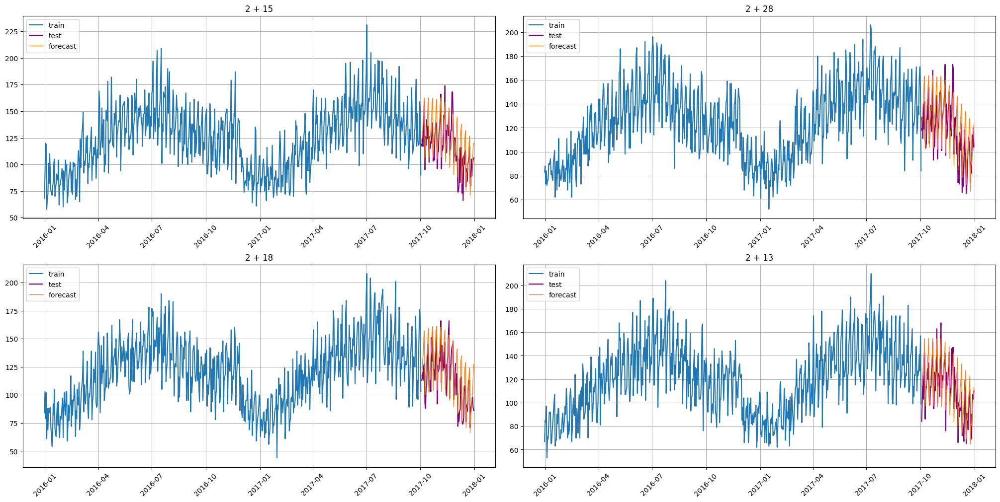

In [37]:
transforms_sarimax_light = [
    FourierTransform(period=365, order=4, out_column="fourier_yearly"),
    DateFlagsTransform(day_number_in_week=True, is_weekend=True),
]

sarimax_light = SARIMAXModel(
    order=(1, 1, 1),
    seasonal_order=(0, 1, 1, 7),
    trend="n",
    simple_differencing=False,
    enforce_stationarity=True,
    enforce_invertibility=True,
    fit_params={"method": "powell", "maxiter": 200, "disp": 0},  
)

_ = train_and_evaluate_model(
    ts=ts_small,  # <<< используем уменьшенный набор
    model=sarimax_light,
    transforms=transforms_sarimax_light,
    horizon=HORIZON,
    metrics=smape,
    model_name="SARIMAX_w7_Fourier365_o4_111_0117_light_small",
    is_auto_regressive=False,
    print_metrics=True,
    do_backtest=True,
    n_folds_backtest=3,  
)

In [38]:
try:
    # если остались временные объекты после прошлых запусков — удалим их
    del forecast_ts
except NameError:
    pass

# если хранишь где-то результаты/плоты — тоже можно подчистить
try:
    import matplotlib.pyplot as plt
    plt.close('all')
except Exception:
    pass

# подчистим лёгкую модель и любые предыдущие трансформы
for name in ['sarimax_light', 'transforms_sarimax_light', 'metrics_df', 'backtest_df']:
    if name in globals():
        del globals()[name]

gc.collect()

20640

## Усиленная SARIMAX

[SARIMAX_w7_Fourier365_o6_212_1117_strong_small] SMAPE avg: 12.5934 | fit+forecast: 324.7s


Backtest [SARIMAX_w7_Fourier365_o6_212_1117_strong_small]:   0%|          | 0/3 [00:00<?, ?it/s]

[SARIMAX_w7_Fourier365_o6_212_1117_strong_small] SMAPE backtest avg: 15.0552


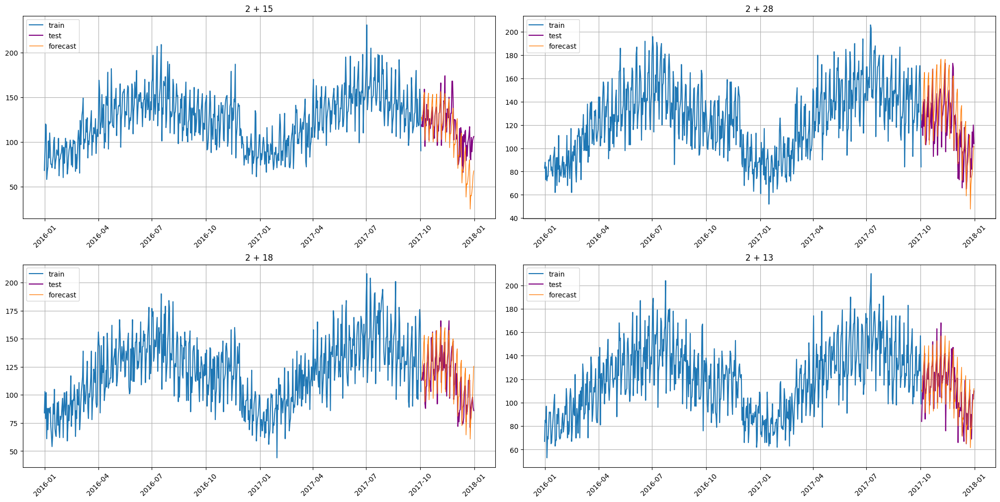

In [40]:
transforms_sarimax_strong = [
    FourierTransform(period=365, order=6, out_column="fourier_yearly"),
    DateFlagsTransform(day_number_in_week=True, month_number_in_year=True, is_weekend=True),
]

sarimax_strong = SARIMAXModel(
    order=(2, 1, 2),
    seasonal_order=(1, 1, 1, 7),
    trend="n",
    simple_differencing=False,
    enforce_stationarity=True,
    enforce_invertibility=True,
    fit_params={"method": "lbfgs", "maxiter": 150, "disp": 0},
)

_ = train_and_evaluate_model(
    ts=ts_small,
    model=sarimax_strong,
    transforms=transforms_sarimax_strong,
    horizon=HORIZON,
    metrics=smape,
    model_name="SARIMAX_w7_Fourier365_o6_212_1117_strong_small",
    is_auto_regressive=False,
    print_metrics=True,
    do_backtest=True,
    n_folds_backtest=3,
)

In [45]:
del sarimax_strong  # и другие тяжёлые объекты, forecasts, старые модели
import gc; gc.collect()

20354

## Holt–Winters

[HW_mul_w7_Fourier365_o4_small] SMAPE avg: 15.8566 | fit+forecast: 8.0s


Backtest [HW_mul_w7_Fourier365_o4_small]:   0%|          | 0/3 [00:00<?, ?it/s]

[HW_mul_w7_Fourier365_o4_small] SMAPE backtest avg: 14.7131


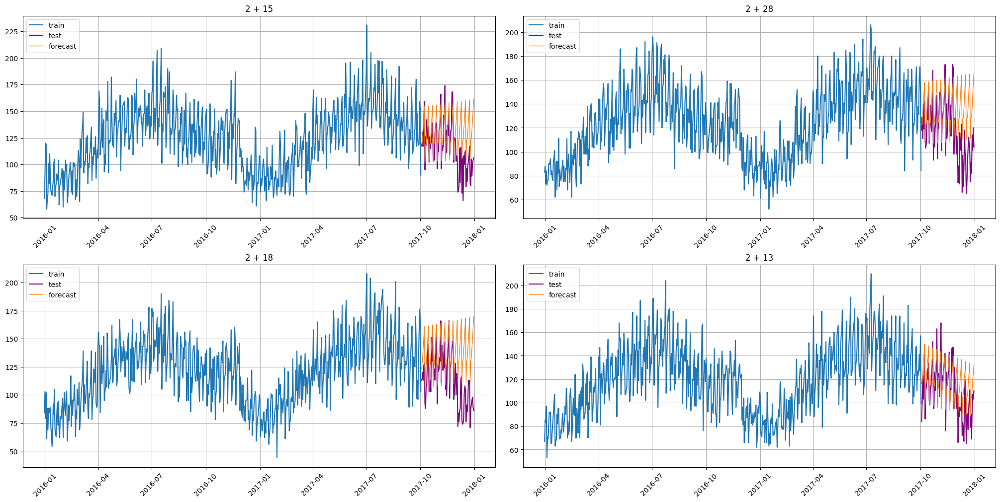

In [47]:
transforms_hw = [
    FourierTransform(period=365, order=4, out_column="fourier_yearly"),
]

hw = HoltWintersModel(
    seasonal_periods=7,  
    trend="add",
    seasonal="mul",
)

_ = train_and_evaluate_model(
    ts=ts_small,
    model=hw,
    transforms=transforms_hw,
    horizon=HORIZON,
    metrics=smape,
    model_name="HW_mul_w7_Fourier365_o4_small",
    is_auto_regressive=False,
    print_metrics=True,
    do_backtest=True,
    n_folds_backtest=3,
)

## VotingEnsemble

16:22:17 - cmdstanpy - INFO - Chain [1] start processing
16:22:18 - cmdstanpy - INFO - Chain [1] done processing
16:22:18 - cmdstanpy - INFO - Chain [1] start processing
16:22:18 - cmdstanpy - INFO - Chain [1] done processing
16:22:18 - cmdstanpy - INFO - Chain [1] start processing
16:22:19 - cmdstanpy - INFO - Chain [1] done processing
16:22:19 - cmdstanpy - INFO - Chain [1] start processing
16:22:19 - cmdstanpy - INFO - Chain [1] done processing
16:22:19 - cmdstanpy - INFO - Chain [1] start processing
16:22:19 - cmdstanpy - INFO - Chain [1] done processing
16:22:20 - cmdstanpy - INFO - Chain [1] start processing
16:22:20 - cmdstanpy - INFO - Chain [1] done processing
16:22:20 - cmdstanpy - INFO - Chain [1] start processing
16:22:20 - cmdstanpy - INFO - Chain [1] done processing
16:22:20 - cmdstanpy - INFO - Chain [1] start processing
16:22:21 - cmdstanpy - INFO - Chain [1] done processing
16:22:21 - cmdstanpy - INFO - Chain [1] start processing
16:22:21 - cmdstanpy - INFO - Chain [1]

Prophet_log_ultra_small SMAPE (3-fold backtest): 9.5963
SARIMAX_light_small SMAPE (3-fold backtest): 8.8865
HW_small SMAPE (3-fold backtest): 14.7131
Ансамблевые веса: {'Prophet_log_ultra_small': 0.366, 'SARIMAX_light_small': 0.3953, 'HW_small': 0.2387}

=== Holdout ===


16:26:22 - cmdstanpy - INFO - Chain [1] start processing
16:26:22 - cmdstanpy - INFO - Chain [1] done processing
16:26:22 - cmdstanpy - INFO - Chain [1] start processing
16:26:23 - cmdstanpy - INFO - Chain [1] done processing
16:26:23 - cmdstanpy - INFO - Chain [1] start processing
16:26:23 - cmdstanpy - INFO - Chain [1] done processing
16:26:24 - cmdstanpy - INFO - Chain [1] start processing
16:26:24 - cmdstanpy - INFO - Chain [1] done processing
16:26:24 - cmdstanpy - INFO - Chain [1] start processing
16:26:24 - cmdstanpy - INFO - Chain [1] done processing
16:26:25 - cmdstanpy - INFO - Chain [1] start processing
16:26:25 - cmdstanpy - INFO - Chain [1] done processing
16:26:25 - cmdstanpy - INFO - Chain [1] start processing
16:26:26 - cmdstanpy - INFO - Chain [1] done processing
16:26:26 - cmdstanpy - INFO - Chain [1] start processing
16:26:26 - cmdstanpy - INFO - Chain [1] done processing
16:26:26 - cmdstanpy - INFO - Chain [1] start processing
16:26:27 - cmdstanpy - INFO - Chain [1]

SMAPE holdout: 10.2914 | fit+forecast: 85.8s

=== Backtest ===


16:27:50 - cmdstanpy - INFO - Chain [1] start processing
16:27:51 - cmdstanpy - INFO - Chain [1] done processing
16:27:51 - cmdstanpy - INFO - Chain [1] start processing
16:27:51 - cmdstanpy - INFO - Chain [1] done processing
16:27:51 - cmdstanpy - INFO - Chain [1] start processing
16:27:52 - cmdstanpy - INFO - Chain [1] done processing
16:27:52 - cmdstanpy - INFO - Chain [1] start processing
16:27:52 - cmdstanpy - INFO - Chain [1] done processing
16:27:52 - cmdstanpy - INFO - Chain [1] start processing
16:27:53 - cmdstanpy - INFO - Chain [1] done processing
16:27:53 - cmdstanpy - INFO - Chain [1] start processing
16:27:53 - cmdstanpy - INFO - Chain [1] done processing
16:27:53 - cmdstanpy - INFO - Chain [1] start processing
16:27:53 - cmdstanpy - INFO - Chain [1] done processing
16:27:54 - cmdstanpy - INFO - Chain [1] start processing
16:27:54 - cmdstanpy - INFO - Chain [1] done processing
16:27:54 - cmdstanpy - INFO - Chain [1] start processing
16:27:54 - cmdstanpy - INFO - Chain [1]

SMAPE backtest: 8.8740


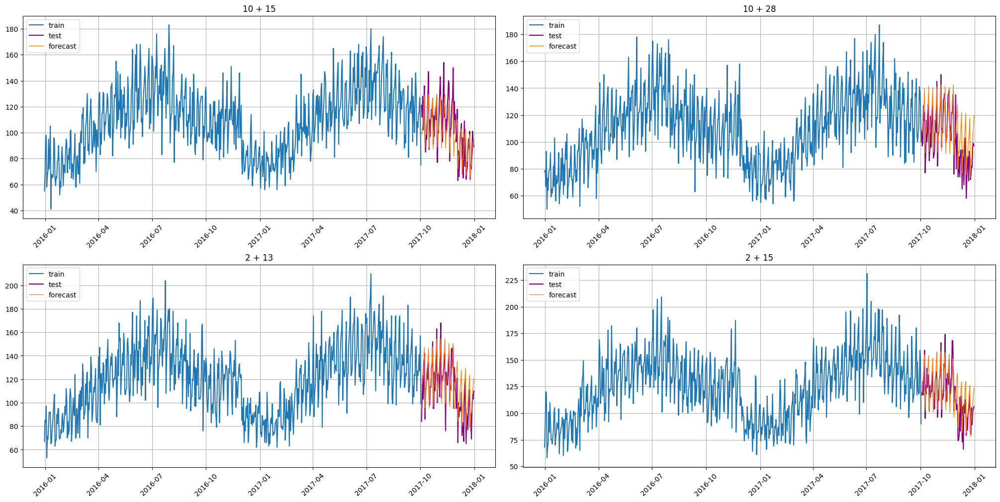

In [52]:
# База 1: Prophet (лог-шкала + календарь)
transforms_prophet_log = [
    AddConstTransform(in_column="target", value=1e-3, inplace=True),
    LogTransform(in_column="target", inplace=True),
    DateFlagsTransform(day_number_in_week=True, week_number_in_year=True,
                       month_number_in_year=True, is_weekend=True),
]
prophet_log_ultra = ProphetModel(
    growth="linear",
    seasonality_mode="additive",
    yearly_seasonality=25,
    weekly_seasonality=15,
    daily_seasonality=False,
    changepoint_prior_scale=0.4,
    seasonality_prior_scale=18,
    n_changepoints=80,
    changepoint_range=0.95,
)

# База 2: SARIMAX (лайт)
transforms_sarimax_light = [
    FourierTransform(period=365, order=4, out_column="fourier_yearly"),
    DateFlagsTransform(day_number_in_week=True, is_weekend=True),
]
sarimax_light = SARIMAXModel(
    order=(1, 1, 1),
    seasonal_order=(0, 1, 1, 7),
    trend="n",
    simple_differencing=False,
    enforce_stationarity=True,
    enforce_invertibility=True,
    fit_params={"method": "powell", "maxiter": 200, "disp": 0},
)

# База 3: Holt–Winters
transforms_hw = [
    FourierTransform(period=365, order=4, out_column="fourier_yearly"),
]
hw = HoltWintersModel(
    seasonal_periods=7,
    trend="add",
    seasonal="mul",
)

# Пайплайны (на ts_small)
pipes = [
    Pipeline(model=prophet_log_ultra, transforms=transforms_prophet_log,   horizon=HORIZON),
    Pipeline(model=sarimax_light,     transforms=transforms_sarimax_light, horizon=HORIZON),
    Pipeline(model=hw,                transforms=transforms_hw,            horizon=HORIZON),
]
pipe_names = ["Prophet_log_ultra_small", "SARIMAX_light_small", "HW_small"]

# Веса по 1/SMAPE (3 фолда на ts_small)
smapes = []
for name, p in zip(pipe_names, pipes):
    dfm, _, _ = p.backtest(
        ts=ts_small,
        n_folds=3,
        metrics=[smape],                 
        aggregate_metrics=True,
        mode="expand",
        n_jobs=1,
        joblib_params=dict(backend="threading"),
    )
    val = float(dfm["SMAPE"].mean())
    print(f"{name} SMAPE (3-fold backtest): {val:.4f}")
    smapes.append(val)

eps = 1e-6
inv = [1.0 / max(eps, v) for v in smapes]
norm = sum(inv) or 1.0
weights = [v / norm for v in inv]
print("Ансамблевые веса:", dict(zip(pipe_names, [round(w, 4) for w in weights])))

# VotingEnsemble + Holdout + Backtest
vot_ens = VotingEnsemble(pipelines=pipes, weights=weights, n_jobs=1)

# Holdout
print("\n=== Holdout ===")
train_ts, test_ts = ts_small.train_test_split(test_size=HORIZON)
t0 = time.time()
vot_ens.fit(train_ts)
forecast_ts = vot_ens.forecast()
holdout_sec = time.time() - t0

# smape() вернёт dict{segment: score}; берём среднее
seg_scores = smape(test_ts, forecast_ts)
smape_holdout = float(pd.Series(seg_scores).mean())
print(f"SMAPE holdout: {smape_holdout:.4f} | fit+forecast: {holdout_sec:.1f}s")

# График holdout (как раньше)
segments_to_plot = list(test_ts.segments)[:4]
plot_forecast(forecast_ts, test_ts, train_ts, n_train_samples=360*2, segments=segments_to_plot)

# Запись holdout в CSV
write_header = not results_file.exists()
with open(results_file, mode="a", newline="") as f:
    wr = csv.writer(f)
    if write_header:
        wr.writerow(["model", "mode", "avg_metric"])
    wr.writerow(["VotingEnsemble_small", "holdout", smape_holdout])

# Backtest
print("\n=== Backtest ===")
metrics_df, backtest_fcst, _ = vot_ens.backtest(
    ts=ts_small,
    metrics=[smape],
    n_folds=3,
    aggregate_metrics=True,
    n_jobs=1,
    mode="expand",
    joblib_params=dict(backend="threading"),
)
smape_backtest = float(metrics_df["SMAPE"].mean())
print(f"SMAPE backtest: {smape_backtest:.4f}")

with open(results_file, mode="a", newline="") as f:
    wr = csv.writer(f)
    wr.writerow(["VotingEnsemble_small", "backtest", smape_backtest])

## Stacking Ensemble (meta: LinearPerSegmentModel)

16:59:35 - cmdstanpy - INFO - Chain [1] start processing
16:59:36 - cmdstanpy - INFO - Chain [1] done processing
16:59:36 - cmdstanpy - INFO - Chain [1] start processing
16:59:36 - cmdstanpy - INFO - Chain [1] done processing
16:59:36 - cmdstanpy - INFO - Chain [1] start processing
16:59:36 - cmdstanpy - INFO - Chain [1] done processing
16:59:36 - cmdstanpy - INFO - Chain [1] start processing
16:59:37 - cmdstanpy - INFO - Chain [1] done processing
16:59:37 - cmdstanpy - INFO - Chain [1] start processing
16:59:37 - cmdstanpy - INFO - Chain [1] done processing
16:59:37 - cmdstanpy - INFO - Chain [1] start processing
16:59:37 - cmdstanpy - INFO - Chain [1] done processing
16:59:37 - cmdstanpy - INFO - Chain [1] start processing
16:59:38 - cmdstanpy - INFO - Chain [1] done processing
16:59:38 - cmdstanpy - INFO - Chain [1] start processing
16:59:38 - cmdstanpy - INFO - Chain [1] done processing
16:59:38 - cmdstanpy - INFO - Chain [1] start processing
16:59:39 - cmdstanpy - INFO - Chain [1]

[StackingEnsemble_small] SMAPE holdout: 10.1941 | fit+forecast: 304.2s


17:04:45 - cmdstanpy - INFO - Chain [1] start processing
17:04:45 - cmdstanpy - INFO - Chain [1] done processing
17:04:46 - cmdstanpy - INFO - Chain [1] start processing
17:04:46 - cmdstanpy - INFO - Chain [1] done processing
17:04:46 - cmdstanpy - INFO - Chain [1] start processing
17:04:46 - cmdstanpy - INFO - Chain [1] done processing
17:04:46 - cmdstanpy - INFO - Chain [1] start processing
17:04:46 - cmdstanpy - INFO - Chain [1] done processing
17:04:46 - cmdstanpy - INFO - Chain [1] start processing
17:04:47 - cmdstanpy - INFO - Chain [1] done processing
17:04:47 - cmdstanpy - INFO - Chain [1] start processing
17:04:47 - cmdstanpy - INFO - Chain [1] done processing
17:04:47 - cmdstanpy - INFO - Chain [1] start processing
17:04:47 - cmdstanpy - INFO - Chain [1] done processing
17:04:47 - cmdstanpy - INFO - Chain [1] start processing
17:04:47 - cmdstanpy - INFO - Chain [1] done processing
17:04:47 - cmdstanpy - INFO - Chain [1] start processing
17:04:48 - cmdstanpy - INFO - Chain [1]

[StackingEnsemble_small] SMAPE backtest: 13.7612


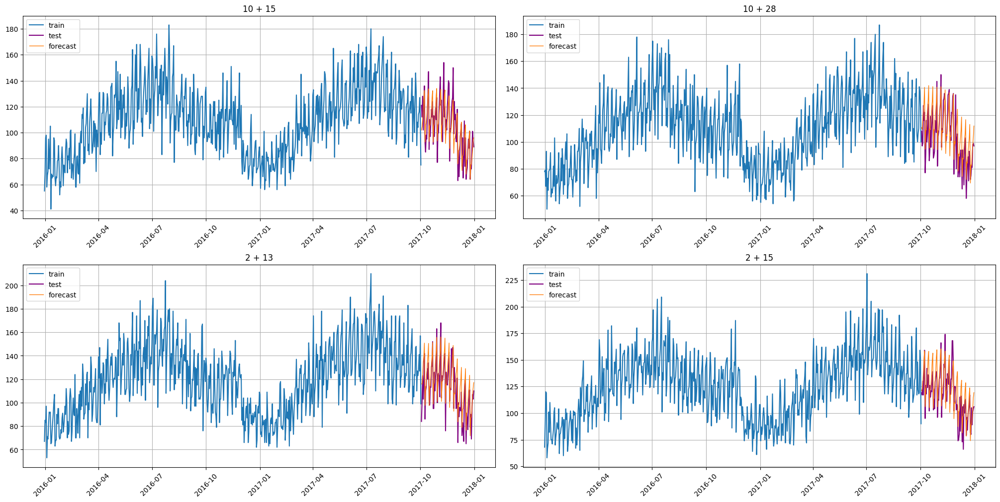

In [57]:
# StackingEnsemble (Prophet_log_ultra + SARIMAX_light + Holt-Winters)
# файл для логов метрик
results_file = Path("results.csv")

# безопасная запись метрик (на случай PermissionError в Windows)
def safe_append_result(csv_path: Path, row: list, header=("model","mode","avg_metric")):
    try:
        write_header = not csv_path.exists()
        with open(csv_path, "a", newline="") as f:
            wr = csv.writer(f)
            if write_header:
                wr.writerow(list(header))
            wr.writerow(row)
    except PermissionError:
        fb = csv_path.with_name(csv_path.stem + "_fallback.csv")
        print(f"[warn] {csv_path} занят, пишу в {fb.name}")
        write_header = not fb.exists()
        with open(fb, "a", newline="") as f:
            wr = csv.writer(f)
            if write_header:
                wr.writerow(list(header))
            wr.writerow(row)

# БАЗОВЫЕ ПАЙПЛАЙНЫ (как в voting)
# Prophet (лог+календарь)
transforms_prophet_log = [
    AddConstTransform(in_column="target", value=1e-3, inplace=True),
    LogTransform(in_column="target", inplace=True),
    DateFlagsTransform(day_number_in_week=True, week_number_in_year=True,
                       month_number_in_year=True, is_weekend=True),
]
prophet_log_ultra = ProphetModel(
    growth="linear", seasonality_mode="additive",
    yearly_seasonality=25, weekly_seasonality=15, daily_seasonality=False,
    changepoint_prior_scale=0.4, seasonality_prior_scale=18,
    n_changepoints=80, changepoint_range=0.95,
)

# SARIMAX (лайт)
transforms_sarimax_light = [
    FourierTransform(period=365, order=4, out_column="fourier_yearly"),
    DateFlagsTransform(day_number_in_week=True, is_weekend=True),
]
sarimax_light = SARIMAXModel(
    order=(1,1,1), seasonal_order=(0,1,1,7), trend="n",
    simple_differencing=False, enforce_stationarity=True, enforce_invertibility=True,
    fit_params={"method":"powell","maxiter":200,"disp":0},
)

# Holt–Winters
transforms_hw = [
    FourierTransform(period=365, order=4, out_column="fourier_yearly"),
]
hw = HoltWintersModel(seasonal_periods=7, trend="add", seasonal="mul")

base_pipes = [
    Pipeline(model=prophet_log_ultra, transforms=transforms_prophet_log,   horizon=HORIZON),
    Pipeline(model=sarimax_light,     transforms=transforms_sarimax_light, horizon=HORIZON),
    Pipeline(model=hw,                transforms=transforms_hw,            horizon=HORIZON),
]

# ===== МЕТАМОДЕЛЬ (sklearn) =====
final_model = make_pipeline(
    StandardScaler(with_mean=False),
    RidgeCV(alphas=[0.1, 0.3, 1.0, 3.0, 10.0])
)

stack_ens = StackingEnsemble(
    pipelines=base_pipes,
    final_model=final_model,   # <- sklearn API (fit(X,y), predict(X))
    n_jobs=1
)

# ===== HOLDOUT =====
train_ts, test_ts = ts_small.train_test_split(test_size=HORIZON)
t0 = time.time()
stack_ens.fit(train_ts)
stack_forecast = stack_ens.forecast()
sec = time.time() - t0

seg_scores = smape(test_ts, stack_forecast)             # dict per segment
smape_holdout = float(pd.Series(seg_scores).mean())
print(f"[StackingEnsemble_small] SMAPE holdout: {smape_holdout:.4f} | fit+forecast: {sec:.1f}s")

# график holdout
plot_forecast(stack_forecast, test_ts, train_ts,
              n_train_samples=360*2,
              segments=list(test_ts.segments)[:4])

# лог holdout
safe_append_result(results_file, ["StackingEnsemble_small", "holdout", smape_holdout])

# ===== BACKTEST (3 фолда) =====
metrics_df, _, _ = stack_ens.backtest(
    ts=ts_small,
    n_folds=3,
    metrics=[smape],               
    aggregate_metrics=True,
    mode="expand",
    n_jobs=1,
    joblib_params=dict(backend="threading"),
)
smape_backtest = float(metrics_df["SMAPE"].mean())
print(f"[StackingEnsemble_small] SMAPE backtest: {smape_backtest:.4f}")

# лог backtest
safe_append_result(results_file, ["StackingEnsemble_small", "backtest", smape_backtest])

## Сохранение данных для работы в других окружениях с другими моделями

In [118]:
import re

save_dir = Path(root_path)
save_dir.mkdir(parents=True, exist_ok=True)

def parse_segment(s: str):
    # пытаемся извлечь shop_id и item_id из формата "shop + item"
    m = re.match(r"\s*(\d+)\s*\+\s*(\d+)\s*$", str(s))
    if m:
        return int(m.group(1)), int(m.group(2))
    return None, None

def ts_save_bundle(ts, prefix: str):
    """Сохраняем:
    - wide target (для быстрой ETNA-восстановки)
    - panel target (для Darts/NeuralForecast)
    - exog (как есть), known_future, freq
    - static по сегментам (shop_id, item_id) — если можно распарсить
    """
    # target wide (MultiIndex колонки (segment, "target"))
    df_wide = ts.to_pandas()
    df_wide.to_parquet(save_dir / f"{prefix}_target_wide.parquet")

    # panel target (long: unique_id, ds, y)
    panel = (df_wide.stack(0)["target"]
             .rename("y")
             .reset_index()
             .rename(columns={"timestamp": "ds", "segment": "unique_id"}))
    panel.to_parquet(save_dir / f"{prefix}_panel.parquet")

    # exog + known_future
    if getattr(ts, "df_exog", None) is not None:
        ts.df_exog.to_parquet(save_dir / f"{prefix}_exog.parquet")
    known_future = ts.known_future if getattr(ts, "known_future", None) is not None else []
    (save_dir / f"{prefix}_known_future.json").write_text(json.dumps(list(known_future)))

    # freq
    (save_dir / f"{prefix}_freq.txt").write_text(str(ts.freq))

    # static по сегментам (shop_id, item_id) — для TFT
    static_rows = []
    for s in ts.segments:
        shop_id, item_id = parse_segment(s)
        static_rows.append({"unique_id": str(s), "shop_id": shop_id, "item_id": item_id})
    pd.DataFrame(static_rows).to_csv(save_dir / f"{prefix}_static.csv", index=False)

    print(f"[saved] {prefix}: target_wide, panel, exog, known_future, freq, static")

# Сохраняем обе версии:
ts_save_bundle(ts, "full")
ts_save_bundle(ts_small, "small")

[saved] full: target_wide, panel, exog, known_future, freq, static
[saved] small: target_wide, panel, exog, known_future, freq, static


In [1]:
import torch
print("CUDA:", torch.cuda.is_available(), "| torch", torch.__version__)

CUDA: True | torch 2.5.1+cu121


In [2]:
# Загрузка сохранённого бандла (без ETNA)
import json
import pandas as pd
from pathlib import Path

HORIZON = 90
CONSIDER_SHOP = [1, 2, 3]
SEGMENTS_TO_SHOW = ['3 + 27', '1 + 47']
root_path = r'D:\ML\LS\MLA\Time_series\Time_series2\practice'
results_file = Path(root_path) / "results.csv"

PREFIX = "small"  

panel = pd.read_parquet(Path(root_path) / f"{PREFIX}_panel.parquet")      # unique_id, ds, y
freq  = (Path(root_path) / f"{PREFIX}_freq.txt").read_text().strip()
static = pd.read_csv(Path(root_path) / f"{PREFIX}_static.csv")

exog_path = Path(root_path) / f"{PREFIX}_exog.parquet"
exog = pd.read_parquet(exog_path) if exog_path.exists() else None

kf_path = Path(root_path) / f"{PREFIX}_known_future.json"
known_future = json.loads(kf_path.read_text()) if kf_path.exists() else []

# Фильтрация по магазинам
if CONSIDER_SHOP:
    allowed = set(static.loc[static["shop_id"].isin(CONSIDER_SHOP), "unique_id"].astype(str))
    sub = panel["unique_id"].astype(str).isin(allowed)
    panel = panel.loc[sub].copy() if sub.any() else panel

print(panel.head())
print("freq:", freq, "| exog:", exog is not None, "| known_future:", known_future)

          ds unique_id     y
2 2015-12-31    2 + 13  67.0
3 2015-12-31    2 + 15  68.0
4 2015-12-31    2 + 18  84.0
5 2015-12-31    2 + 22  84.0
6 2015-12-31    2 + 25  78.0
freq: D | exog: True | known_future: ['item', 'quarter', 'quarter_end', 'quarter_start', 'store']


## Модели из библиотеки Darts

In [3]:
# Вспомогательные функции: собираем TimeSeries и ковариаты 
from typing import List, Tuple, Optional
from darts import TimeSeries
import pandas as pd

def panel_to_darts_targets(panel_df: pd.DataFrame, freq: str) -> Tuple[List[TimeSeries], List[str]]:
    series_list, names = [], []
    for uid, g in panel_df.groupby("unique_id", sort=False):
        s = g.set_index("ds")["y"].astype("float64").copy()
        s = s.ffill().bfill()  
        ser = TimeSeries.from_series(s, fill_missing_dates=True, freq=freq)
        if len(ser) >= HORIZON + 5:
            series_list.append(ser); names.append(str(uid))
    return series_list, names

def build_covariates_lists(exog_df: Optional[pd.DataFrame], freq: str, target_names: List[str]):
    """
    Возвращает (past_cov_list, future_cov_list) длиной = len(target_names).
    Если exog имеет MultiIndex (segment, feature) — берём ковариаты ПО СЕГМЕНТАМ.
    Если обычные колонки — считаем их глобальными и дублируем на все сегменты.
    Деление на past/future — по known_future.
    """
    if exog_df is None or exog_df.empty:
        return None, None

    exog_df = exog_df.sort_index()

    # MultiIndex (segment, feature) -> пер-сегментные ковариаты
    if isinstance(exog_df.columns, pd.MultiIndex) and exog_df.columns.nlevels == 2:
        all_feats = list(exog_df.columns.get_level_values(1).unique())
        kf = set(known_future)
        future_feats = [f for f in all_feats if f in kf]
        past_feats   = [f for f in all_feats if f not in kf]

        past_list, fut_list = [], []
        seg_level = exog_df.columns.names[0] if exog_df.columns.names and exog_df.columns.names[0] else 0

        for uid in target_names:
            # если для сегмента нет экзогенов — None
            if uid in exog_df.columns.get_level_values(0):
                seg_df = exog_df.xs(uid, level=0, axis=1)
                pcols = [c for c in past_feats if c in seg_df.columns]
                fcols = [c for c in future_feats if c in seg_df.columns]
                past_ts = TimeSeries.from_dataframe(seg_df[pcols], fill_missing_dates=True, freq=freq) if pcols else None
                fut_ts  = TimeSeries.from_dataframe(seg_df[fcols],  fill_missing_dates=True, freq=freq) if fcols else None
            else:
                past_ts = None; fut_ts = None
            past_list.append(past_ts)
            fut_list.append(fut_ts)

        # если вообще ни у кого ковариат нет — возвращаем None
        if not any(p is not None for p in past_list):
            past_list = None
        if not any(f is not None for f in fut_list):
            fut_list = None

        return past_list, fut_list

    # Плоские колонки -> глобальные ковариаты (одни и те же для всех сегментов)
    cols = list(exog_df.columns)
    kf = set(known_future)
    future_cols = [c for c in cols if c in kf]
    past_cols   = [c for c in cols if c not in kf]

    past_cov = TimeSeries.from_dataframe(exog_df[past_cols], fill_missing_dates=True, freq=freq) if past_cols else None
    fut_cov  = TimeSeries.from_dataframe(exog_df[future_cols],  fill_missing_dates=True, freq=freq) if future_cols else None

    past_list = [past_cov]*len(target_names) if past_cov is not None else None
    fut_list  = [fut_cov]*len(target_names)  if fut_cov  is not None else None
    return past_list, fut_list

# собираем таргеты и ковариаты
target_series, target_names = panel_to_darts_targets(panel, freq=freq)
past_cov_list, future_cov_list = build_covariates_lists(exog, freq=freq, target_names=target_names)

print(f"готово рядов: {len(target_series)}; пример сегментов: {target_names[:5]}")
print(f"past_cov (per-series): {past_cov_list is not None}, future_cov (per-series): {future_cov_list is not None}")

готово рядов: 11; пример сегментов: ['2 + 13', '2 + 15', '2 + 18', '2 + 22', '2 + 25']
past_cov (per-series): False, future_cov (per-series): True


In [4]:
PREFIX = "full"  #грузим полный фрейм

# файлы
panel = pd.read_parquet(Path(root_path) / f"{PREFIX}_panel.parquet")      # cols: unique_id, ds, y
freq  = (Path(root_path) / f"{PREFIX}_freq.txt").read_text().strip()
static = pd.read_csv(Path(root_path) / f"{PREFIX}_static.csv")

exog_path = Path(root_path) / f"{PREFIX}_exog.parquet"
exog = pd.read_parquet(exog_path) if exog_path.exists() else None

kf_path = Path(root_path) / f"{PREFIX}_known_future.json"
known_future = json.loads(kf_path.read_text()) if kf_path.exists() else []

# фильтрация по магазинам
if CONSIDER_SHOP:
    allowed = set(static.loc[static["shop_id"].isin(CONSIDER_SHOP), "unique_id"].astype(str))
    mask = panel["unique_id"].astype(str).isin(allowed)
    if mask.any():
        panel = panel.loc[mask].copy()

print(panel.head())
print("freq:", freq, "| exog:", exog is not None, "| known_future:", known_future)

# сборка рядов и ковариат
target_series, target_names = panel_to_darts_targets(panel, freq=freq)
past_cov_list, future_cov_list = build_covariates_lists(exog, freq=freq, target_names=target_names)

print(f"[FULL] готово рядов: {len(target_series)}; пример сегментов: {target_names[:5]}")
print(f"[FULL] past_cov (per-series): {past_cov_list is not None}, future_cov (per-series): {future_cov_list is not None}")

          ds unique_id     y
0 2013-01-01     1 + 1  13.0
1 2013-01-01    1 + 10  37.0
2 2013-01-01    1 + 11  37.0
3 2013-01-01    1 + 12  33.0
4 2013-01-01    1 + 13  37.0
freq: D | exog: True | known_future: ['item', 'quarter', 'quarter_end', 'quarter_start', 'store']
[FULL] готово рядов: 150; пример сегментов: ['1 + 1', '1 + 10', '1 + 11', '1 + 12', '1 + 13']
[FULL] past_cov (per-series): False, future_cov (per-series): True


In [5]:
HORIZON = 90
CONSIDER_SHOP = [1, 2, 3]
SEGMENTS_TO_SHOW = ['3 + 27' , '1 + 47'] # сегменты для построения графика прогноза
root_path = r'D:\ML\LS\MLA\Time_series\Time_series2\practice'
results_file = Path(root_path) / "results.csv"

In [6]:
# Универсальный запуск моделей Darts (helpers + runner + фабрики)
import warnings, math, gc, random, time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
from typing import List, Optional, Tuple
warnings.filterwarnings("ignore")

from darts import TimeSeries
from darts.metrics import smape as darts_smape
from darts.dataprocessing.transformers import Scaler
import torch

# tqdm
try:
    from tqdm.auto import tqdm
except Exception:
    def tqdm(x, **k): return x

# сиды + выбор ускорителя
def set_seed(seed=42):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed_all(seed)
set_seed(42)

def accel_kwargs():
    return {"accelerator": "gpu", "devices": 1} if torch.cuda.is_available() else {"accelerator": "cpu", "devices": 1}
trainer = accel_kwargs()

# утилита: привести списки рядов к float32
def to_float32_list(lst: Optional[List[TimeSeries]]) -> Optional[List[TimeSeries]]:
    if lst is None:
        return None
    return [s.astype(np.float32) for s in lst]

# фильтрация сегментов по магазину (names в формате "shop + item")
def filter_by_shop(series_list: List[TimeSeries], names_list: List[str], consider) -> Tuple[List[TimeSeries], List[str]]:
    if not consider:
        return series_list, names_list
    wanted = set(map(int, consider))
    idx = []
    for i, name in enumerate(names_list):
        try:
            store_id = int(str(name).split(" + ")[0])
            if store_id in wanted:
                idx.append(i)
        except Exception:
            idx.append(i)
    series_f = [series_list[i] for i in idx]
    names_f  = [names_list[i]  for i in idx]
    return series_f, names_f

# вспомогательные функции
def split_holdout(series_list: List[TimeSeries], horizon: int):
    train, test = [], []
    for ser in series_list:
        train.append(ser[:-horizon]); test.append(ser[-horizon:])
    return train, test

def scale_fit_transform(train_list, test_list):
    scalers, train_s, test_s = [], [], []
    print("Scaling:")
    for tr, te in tqdm(list(zip(train_list, test_list)), total=len(train_list)):
        sc = Scaler()
        tr_s = sc.fit_transform(tr); te_s = sc.transform(te)
        scalers.append(sc); train_s.append(tr_s); test_s.append(te_s)
    return train_s, test_s, scalers

def inverse_transform_list(pred_list, scalers):
    return [sc.inverse_transform(p) for p, sc in zip(pred_list, scalers)]

def mean_smape(true_list, pred_list) -> float:
    vals = [darts_smape(y, yhat) for y, yhat in zip(true_list, pred_list)]
    return float(np.mean(vals)) if vals else np.nan

def plot_holdout_examples(true_list, pred_list, names, max_plots=2):
    try:
        want = [s for s in SEGMENTS_TO_SHOW if s in names] or names[:max_plots]
    except NameError:
        want = names[:max_plots]
    for seg in want:
        i = names.index(seg)
        y, yhat = true_list[i], pred_list[i]
        plt.figure(figsize=(10,4))
        y.plot(label=f"{seg} | true"); yhat.plot(label=f"{seg} | pred")
        plt.title(f"{seg} — holdout"); plt.legend(); plt.tight_layout(); plt.show()

# РАННЕР (универсальный)
def run_darts_global_from_lists(
    model_name: str,
    build_model,                               
    series_all: List[TimeSeries],
    horizon: int,
    results_path: Path,
    future_cov_list: Optional[List[TimeSeries]] = None,
    past_cov_list: Optional[List[TimeSeries]] = None,
    names: Optional[List[str]] = None,
    n_folds: int = 3,                          
):
    if not series_all:
        raise RuntimeError("Нет пригодных рядов.")

    # привести dtype к float32
    series_all      = to_float32_list(series_all)
    future_cov_list = to_float32_list(future_cov_list)
    past_cov_list   = to_float32_list(past_cov_list)

    print(f"================= {model_name}: START =================")
    print("Split holdout...")
    tr_hold, te_hold = split_holdout(series_all, horizon=horizon)

    print("Scale (fit/transform)...")
    tr_hold_s, te_hold_s, scalers = scale_fit_transform(tr_hold, te_hold)

    model = build_model()
    supp_pc = bool(getattr(model, "supports_past_covariates", False))
    supp_fc = bool(getattr(model, "supports_future_covariates", False))
    pc_list_fit = past_cov_list if (supp_pc and past_cov_list is not None) else None
    fc_list_fit = future_cov_list if (supp_fc and future_cov_list is not None) else None

    # вывод числа эпох
    epochs_safe = getattr(model, "n_epochs", None)
    if epochs_safe is None:
        mp = getattr(model, "model_params", {}) or getattr(model, "_model_params", {}) or {}
        epochs_safe = mp.get("n_epochs", "NA")

    print(f"Fit: supports(pc={supp_pc}, fc={supp_fc}) | epochs={epochs_safe}")
    t0 = time.time()
    model.fit(tr_hold_s, past_covariates=pc_list_fit, future_covariates=fc_list_fit, verbose=False)
    print(f"Fit done in {time.time()-t0:.1f}s.")

    print("Predict (holdout)...")
    preds_hold_s = model.predict(
        horizon,
        series=tr_hold_s,
        past_covariates=pc_list_fit,
        future_covariates=fc_list_fit,
    )
    preds_hold = inverse_transform_list(preds_hold_s, scalers)
    smape_hold = mean_smape(te_hold, preds_hold)
    print(f"[Darts_{model_name}] SMAPE holdout: {smape_hold:.4f}")

    # графики
    try:
        names_plot = names or [f"seg_{i}" for i in range(len(te_hold))]
        plot_holdout_examples(te_hold, preds_hold, names_plot, max_plots=2)
    except Exception as e:
        print(f"[plot skipped] {e}")

    # лог holdout
    results_path.parent.mkdir(parents=True, exist_ok=True)
    write_header = not results_path.exists()
    with open(results_path, "a", newline="") as f:
        import csv; wr = csv.writer(f)
        if write_header: wr.writerow(["model","mode","avg_metric"])
        wr.writerow([f"Darts_{model_name}", "holdout", smape_hold])

    # backtest
    fold_scores = []
    if n_folds > 0:
        print("\nBacktest (expand)...")
    for i in range(n_folds, 0, -1):
        cut = (i-1)*horizon
        print(f"  ├─ Fold {n_folds - i + 1}/{n_folds} | cut={cut}")
        tr_fold, te_fold = [], []
        for s in series_all:
            tr = s[: - (cut + horizon)] if (cut + horizon) > 0 else s[:-horizon]
            te = s[- (cut + horizon): -cut or None]
            if len(tr) >= horizon and len(te) == horizon:
                tr_fold.append(tr); te_fold.append(te)
        if not tr_fold:
            print("  │  skip (слишком короткие ряды)")
            continue

        tr_s, te_s, scs = scale_fit_transform(tr_fold, te_fold)
        m = build_model()
        pc_list_bt = past_cov_list if bool(getattr(m, "supports_past_covariates", False)) else None
        fc_list_bt = future_cov_list if bool(getattr(m, "supports_future_covariates", False)) else None

        t0 = time.time()
        m.fit(tr_s, past_covariates=pc_list_bt, future_covariates=fc_list_bt, verbose=False)
        preds_s = m.predict(horizon, series=tr_s, past_covariates=pc_list_bt, future_covariates=fc_list_bt)
        preds = inverse_transform_list(preds_s, scs)
        fold_smape = mean_smape(te_fold, preds)
        fold_scores.append(fold_smape)
        print(f"  │  fit {time.time()-t0:.1f}s | fold SMAPE: {fold_smape:.4f}")
        del m, tr_s, te_s, scs, preds_s, preds; gc.collect()

    smape_bt = float(np.mean(fold_scores)) if fold_scores else math.nan
    if n_folds > 0:
        with open(results_path, "a", newline="") as f:
            import csv; csv.writer(f).writerow([f"Darts_{model_name}", "backtest", smape_bt])
        print(f"[Darts_{model_name}] SMAPE backtest: {smape_bt:.4f}")
    print("================= DONE =================\n")
    return smape_hold, smape_bt

# ФАБРИКИ МОДЕЛЕЙ (precision фиксируем в "32-true") 
from darts.models import (
    BlockRNNModel, TFTModel, NBEATSModel, TransformerModel, RNNModel
)
from darts.utils.likelihood_models import GaussianLikelihood

def _pl_kwargs():
    return dict(
        enable_progress_bar=False,
        enable_model_summary=False,
        logger=False,
        precision="32-true",
        **trainer,
    )

# DeepAR-like (BlockRNN + Gaussian)
def make_deepar_like(
    n_epochs: int,
    batch_size: int,
    input_chunk_length: int,
    output_chunk_length: int,
    hidden_dim: int = 128,
    n_rnn_layers: int = 3,
    dropout: float = 0.20,
    lr: float = 5e-4,
    **kwargs,   
):
    return BlockRNNModel(
        model="LSTM",
        input_chunk_length=input_chunk_length,
        output_chunk_length=output_chunk_length,
        n_rnn_layers=n_rnn_layers,
        hidden_dim=hidden_dim,
        dropout=dropout,
        batch_size=batch_size,
        n_epochs=n_epochs,
        random_state=42,
        likelihood=GaussianLikelihood(),
        optimizer_kwargs={"lr": lr},
        pl_trainer_kwargs=dict(
            enable_progress_bar=True,
            enable_model_summary=False,
            logger=False,
            precision="32-true",
            **trainer,
        ),
    )

# TFT
def make_tft(n_epochs: int, batch_size: int, input_chunk_length: int, output_chunk_length: int):
    return TFTModel(
        input_chunk_length=input_chunk_length,
        output_chunk_length=output_chunk_length,
        hidden_size=32,
        dropout=0.1,
        batch_size=batch_size,
        n_epochs=n_epochs,
        add_relative_index=True,
        random_state=42,
        optimizer_kwargs={"lr": 1e-3},
        pl_trainer_kwargs=_pl_kwargs(),
    )

# N-BEATS
def make_nbeats(n_epochs: int, batch_size: int, input_chunk_length: int, output_chunk_length: int):
    return NBEATSModel(
        input_chunk_length=input_chunk_length,
        output_chunk_length=output_chunk_length,
        num_stacks=16,
        num_blocks=1,
        layer_widths=256,
        batch_size=batch_size,
        n_epochs=n_epochs,
        random_state=42,
        pl_trainer_kwargs=_pl_kwargs(),
    )

# Простой RNN/LSTM/GRU (без likelihood)
def make_rnn(kind: str, n_epochs: int, batch_size: int, input_chunk_length: int, output_chunk_length: int):
    return BlockRNNModel(
        model=kind,  # "RNN" | "LSTM" | "GRU"
        input_chunk_length=input_chunk_length,
        output_chunk_length=output_chunk_length,
        hidden_dim=64,
        dropout=0.1,
        batch_size=batch_size,
        n_epochs=n_epochs,
        random_state=42,
        pl_trainer_kwargs=_pl_kwargs(),
    )

# Transformer
def make_transformer(n_epochs: int, batch_size: int, input_chunk_length: int, output_chunk_length: int):
    return TransformerModel(
        input_chunk_length=input_chunk_length,
        output_chunk_length=output_chunk_length,
        d_model=64,
        nhead=4,
        num_encoder_layers=2,
        num_decoder_layers=2,
        dim_feedforward=128,
        dropout=0.1,
        batch_size=batch_size,
        n_epochs=n_epochs,
        random_state=42,
        optimizer_kwargs={"lr": 1e-3},
        pl_trainer_kwargs=_pl_kwargs(),
    )

## DeepAR

Используем рядов: 150; примеры: ['1 + 1', '1 + 10', '1 + 11', '1 + 12', '1 + 13']
================= DeepAR_like: START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit: supports(pc=True, fc=False) | epochs=50


`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 1726.3s.
Predict (holdout)...


Predicting: |          | 0/? [00:00<?, ?it/s]

[Darts_DeepAR_like] SMAPE holdout: 17.0958


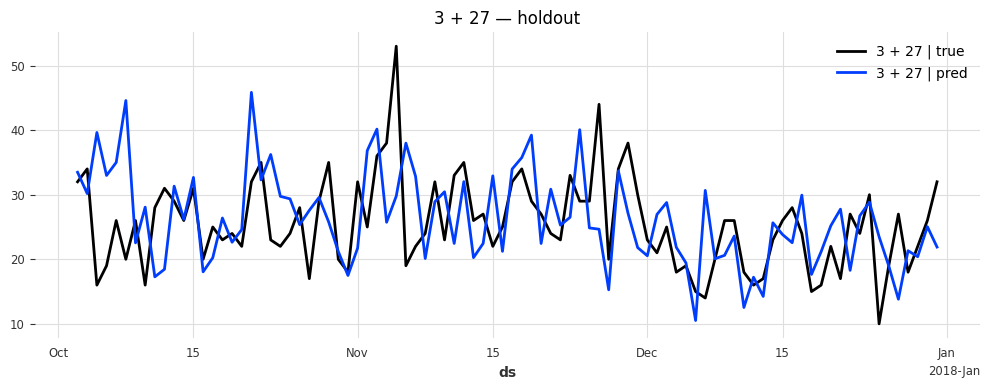

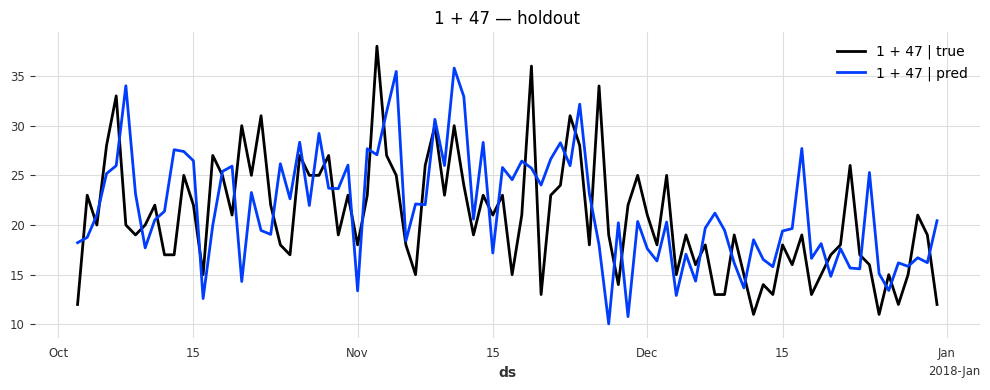


Backtest (expand)...
  ├─ Fold 1/3 | cut=180
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

  │  fit 1458.8s | fold SMAPE: 18.0176
  ├─ Fold 2/3 | cut=90
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

  │  fit 1539.7s | fold SMAPE: 15.2605
  ├─ Fold 3/3 | cut=0
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=50` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

  │  fit 1651.2s | fold SMAPE: 17.0958
[Darts_DeepAR_like] SMAPE backtest: 16.7913
================= DONE =================

DONE: 17.09579086303711 16.791283925374348


In [32]:
series_use, names_use = target_series, target_names
print(f"Используем рядов: {len(series_use)}; примеры: {names_use[:5]}")

# конфиг
N_EPOCHS   = 50         
BATCH_SIZE = 256        
INP_CHUNK  = 180        
N_FOLDS    = 3

sm_hold, sm_bt = run_darts_global_from_lists(
    model_name="DeepAR_like",
    build_model=lambda: make_deepar_like(
        n_epochs=N_EPOCHS,
        batch_size=BATCH_SIZE,
        input_chunk_length=INP_CHUNK,
        output_chunk_length=HORIZON,
        hidden_dim=128,
        n_rnn_layers=3,
        dropout=0.20,
        lr=5e-4,
    ),
    series_all=series_use,
    horizon=HORIZON,
    results_path=results_file,
    past_cov_list=past_cov_list,    
    future_cov_list=None,             
    names=names_use,
    n_folds=N_FOLDS,
)
print("DONE:", sm_hold, sm_bt)

## Уменьшаем данные и отключаем бэктест для нейросетей

Цель этого ноутбука — показать грамотный процесс, сравнение подходов и получить **репрезентативные** метрики без избыточных вычислительных затрат. 
С учётом ограничений по железу:

- используем **уменьшенный датасет** (`small_*`) вместо полного;
- для нейросетевых моделей отключаем **бэктест** (`N_FOLDS=0`), а качество оцениваем на **выделенном holdout** (HORIZON=90);
- ограничиваем **эпохи** (20–30) и подбираем **batch_size** так, чтобы обучение укладывалось в 1–2 часа на модель;
- фиксируем **одинаковый протокол**: одинаковый horizon, одно и то же масштабирование/сплит, единая метрика (SMAPE), и при наличии — одинаковые ковариаты.

Это честный ко ноутбука важнее воспроизводимый процесс и прозрачные выводы, чем «геройский» суточный прогон на домашнем ПК. При желании полноразмерный режим можно воспроизвести, увеличив размер данных, эпохи и включив бэктест — но это вне текущего ресурcног бюджета.


## TFT

[SMALL] рядов: 150; пример имён: ['1 + 1', '1 + 10', '1 + 11', '1 + 12', '1 + 13']
================= Darts_TFT (small): START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

Fit: supports(pc=True, fc=True) | epochs=25


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=25` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 6317.7s.
Predict (holdout)...
[Darts_Darts_TFT (small)] SMAPE holdout: 16.9794


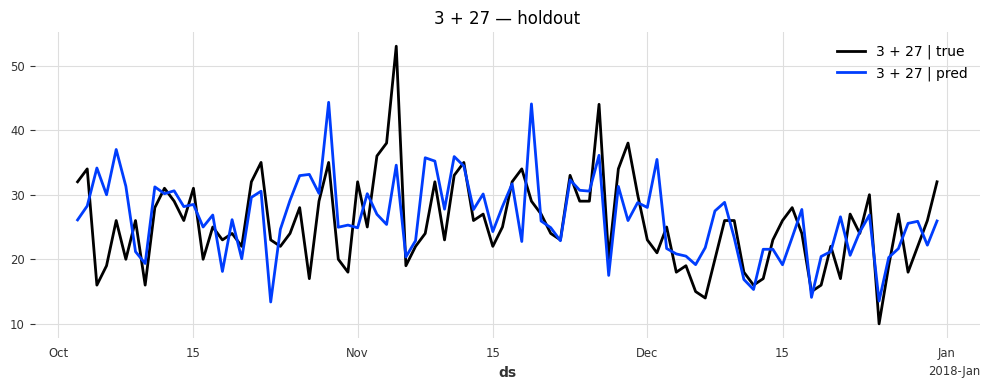

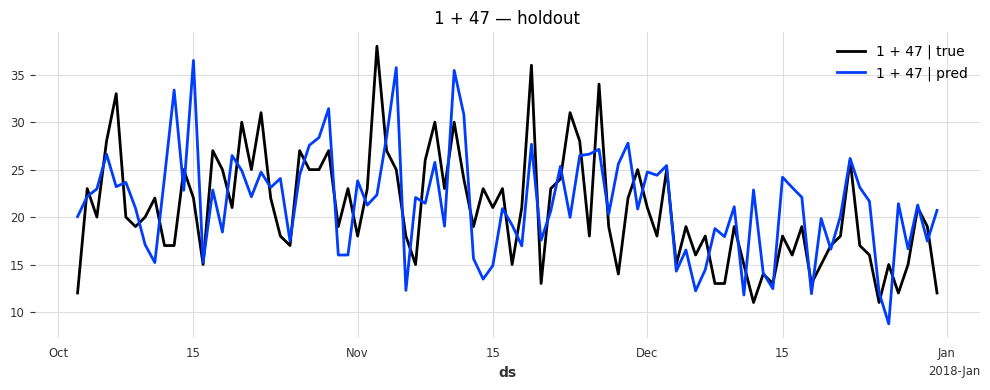

================= DONE =================

DONE: 16.979381561279297 nan


In [9]:
# выбираем small-фрейм
series_use, names_use = target_series, target_names
print(f"[SMALL] рядов: {len(series_use)}; пример имён: {names_use[:5]}")

# конфиг
N_EPOCHS   = 25        
BATCH_SIZE = 256      
INP_CHUNK  = 120       
N_FOLDS    = 0        

sm_hold, sm_bt = run_darts_global_from_lists(
    model_name="Darts_TFT (small)",    
    build_model=lambda: make_tft(
        n_epochs=N_EPOCHS,
        batch_size=BATCH_SIZE,
        input_chunk_length=INP_CHUNK,
        output_chunk_length=HORIZON,
    ),
    series_all=series_use,
    horizon=HORIZON,
    results_path=results_file,
    past_cov_list=past_cov_list,       
    future_cov_list=future_cov_list,    
    names=names_use,
    n_folds=N_FOLDS,
)
print("DONE:", sm_hold, sm_bt)

## N-BEATS

[SMALL] рядов: 150; пример имён: ['1 + 1', '1 + 10', '1 + 11', '1 + 12', '1 + 13']
================= Darts_NBEATS (small): START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit: supports(pc=True, fc=False) | epochs=25


`Trainer.fit` stopped: `max_epochs=25` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 839.3s.
Predict (holdout)...
[Darts_Darts_NBEATS (small)] SMAPE holdout: 12.2359


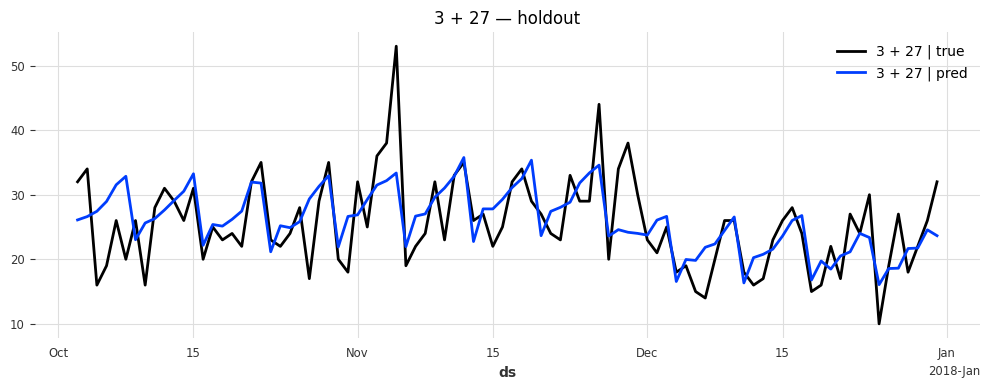

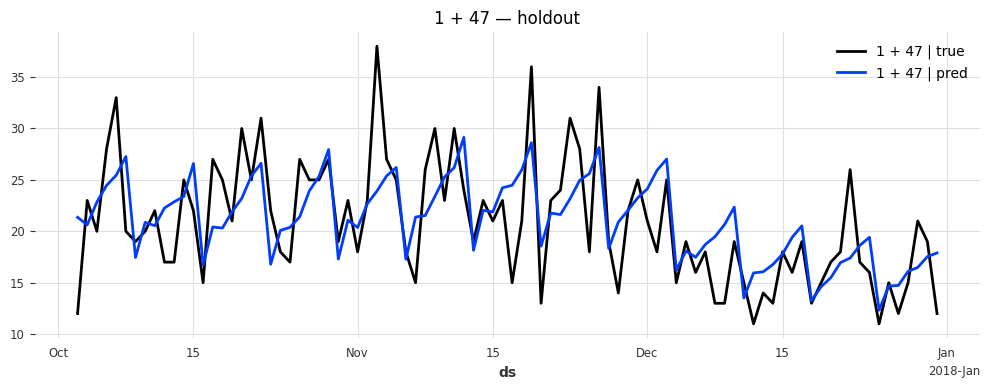

================= DONE =================

DONE NBEATS: 12.235880851745605 nan


In [10]:
# N-BEATS (small)
series_use, names_use = target_series, target_names
print(f"[SMALL] рядов: {len(series_use)}; пример имён: {names_use[:5]}")

N_EPOCHS   = 25
BATCH_SIZE = 256
INP_CHUNK  = 120
N_FOLDS    = 0   

sm_hold, sm_bt = run_darts_global_from_lists(
    model_name="Darts_NBEATS (small)",
    build_model=lambda: make_nbeats(
        n_epochs=N_EPOCHS,
        batch_size=BATCH_SIZE,
        input_chunk_length=INP_CHUNK,
        output_chunk_length=HORIZON,
    ),
    series_all=series_use,
    horizon=HORIZON,
    results_path=results_file,
    past_cov_list=past_cov_list,
    future_cov_list=future_cov_list,
    names=names_use,
    n_folds=N_FOLDS,
)
print("DONE NBEATS:", sm_hold, sm_bt)

## Transformer

[SMALL] рядов: 150; пример имён: ['1 + 1', '1 + 10', '1 + 11', '1 + 12', '1 + 13']
================= Darts_Transformer (small): START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

Fit: supports(pc=True, fc=False) | epochs=25


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=25` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 679.0s.
Predict (holdout)...
[Darts_Darts_Transformer (small)] SMAPE holdout: 12.5098


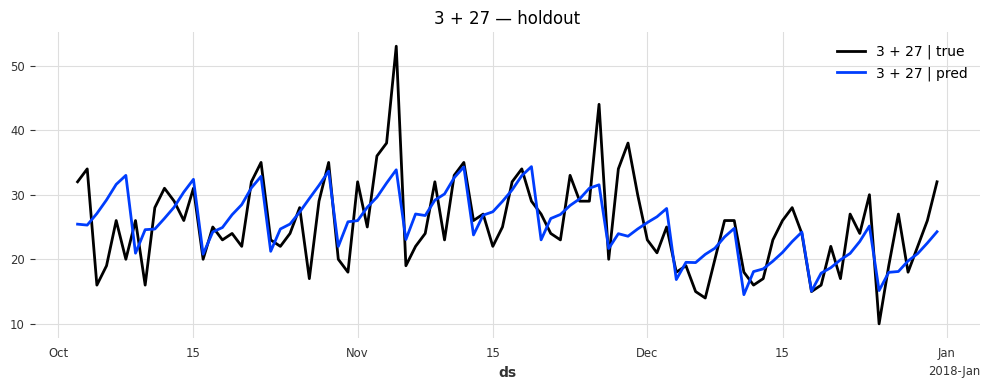

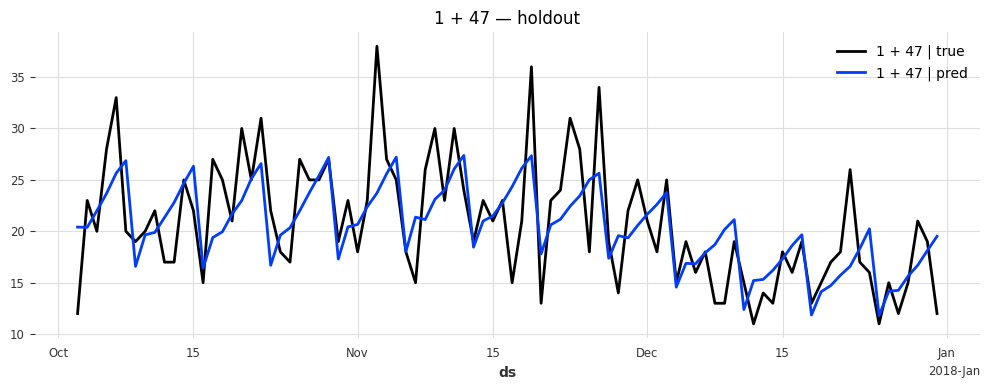

================= DONE =================

DONE Transformer: 12.509841918945312 nan


In [11]:
# Transformer (small)
series_use, names_use = target_series, target_names
print(f"[SMALL] рядов: {len(series_use)}; пример имён: {names_use[:5]}")

N_EPOCHS   = 25
BATCH_SIZE = 256
INP_CHUNK  = 120
N_FOLDS    = 0   # без backtest

sm_hold, sm_bt = run_darts_global_from_lists(
    model_name="Darts_Transformer (small)",
    build_model=lambda: make_transformer(
        n_epochs=N_EPOCHS,
        batch_size=BATCH_SIZE,
        input_chunk_length=INP_CHUNK,
        output_chunk_length=HORIZON,
    ),
    series_all=series_use,
    horizon=HORIZON,
    results_path=results_file,
    past_cov_list=past_cov_list,
    future_cov_list=future_cov_list,
    names=names_use,
    n_folds=N_FOLDS,
)
print("DONE Transformer:", sm_hold, sm_bt)

## BlockRNN (RNN, LSTM, GRU)

[SMALL] рядов: 150; пример имён: ['1 + 1', '1 + 10', '1 + 11', '1 + 12', '1 + 13']
================= Darts_RNN (small): START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit: supports(pc=True, fc=False) | epochs=25


`Trainer.fit` stopped: `max_epochs=25` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 190.6s.
Predict (holdout)...
[Darts_Darts_RNN (small)] SMAPE holdout: 15.0859


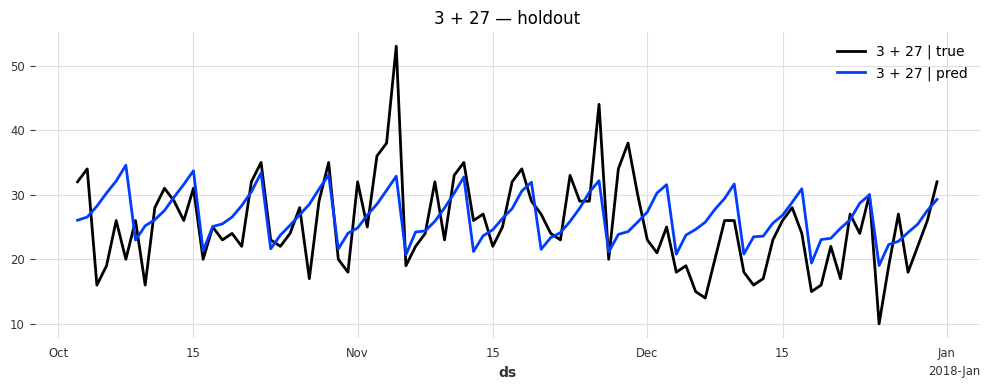

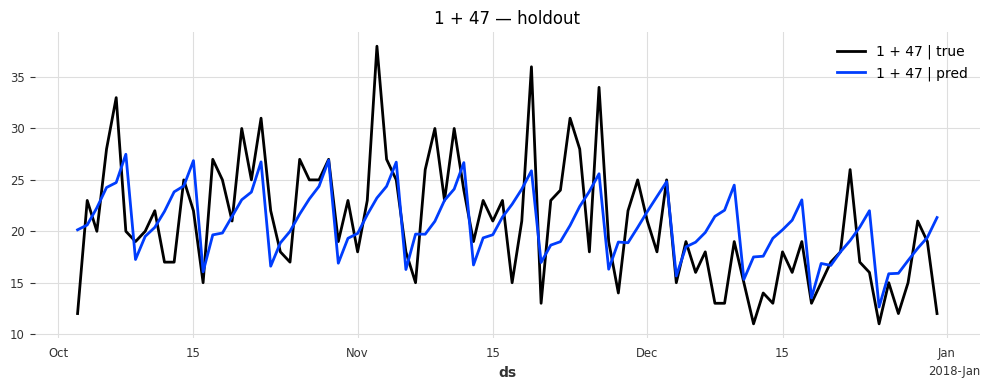

================= DONE =================

DONE RNN: 15.085851669311523 nan
================= Darts_LSTM (small): START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit: supports(pc=True, fc=False) | epochs=25


`Trainer.fit` stopped: `max_epochs=25` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 199.9s.
Predict (holdout)...
[Darts_Darts_LSTM (small)] SMAPE holdout: 12.6954


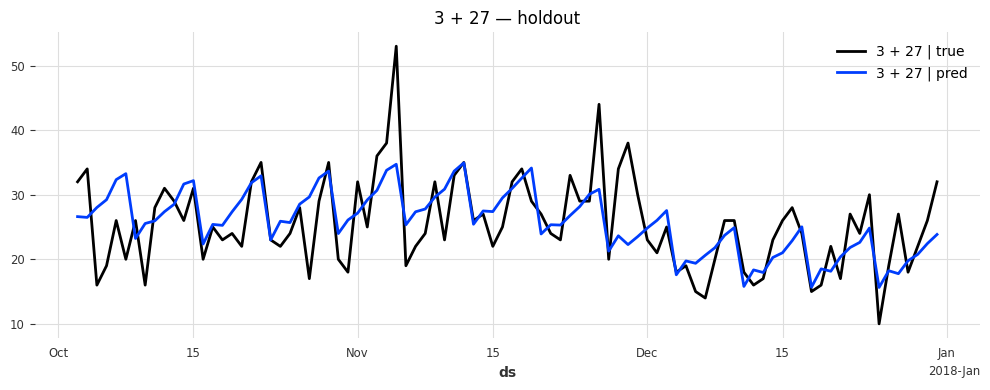

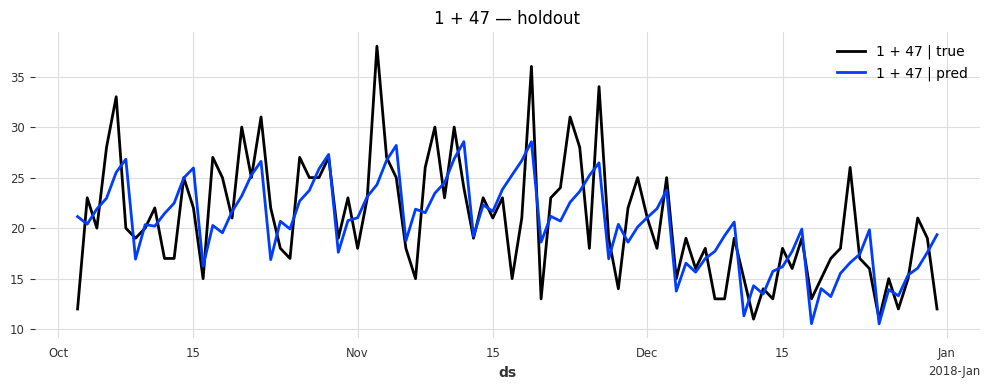

================= DONE =================

DONE LSTM: 12.69536304473877 nan
================= Darts_GRU (small): START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit: supports(pc=True, fc=False) | epochs=25


`Trainer.fit` stopped: `max_epochs=25` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 199.5s.
Predict (holdout)...
[Darts_Darts_GRU (small)] SMAPE holdout: 12.6467


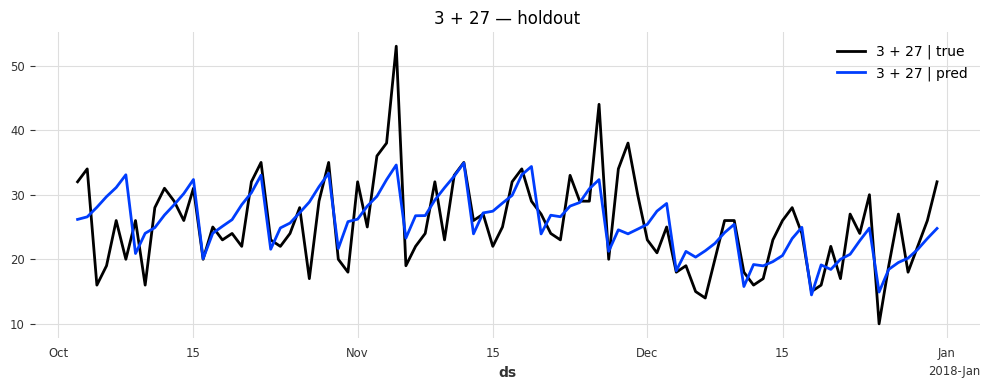

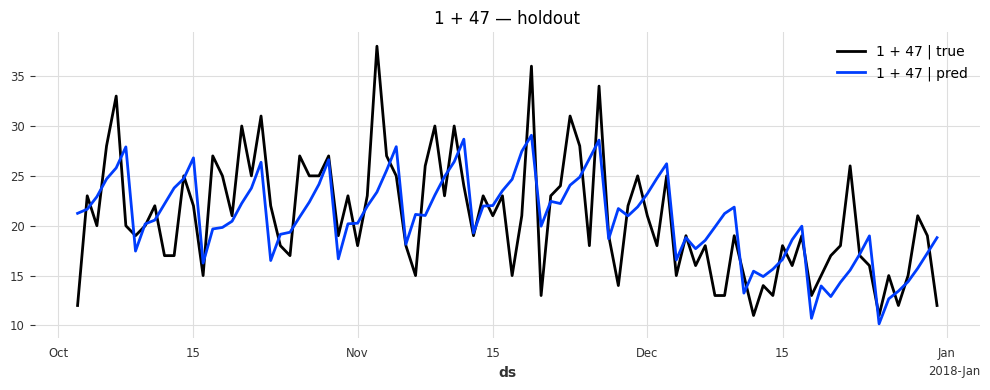

================= DONE =================

DONE GRU: 12.646734237670898 nan


In [12]:
# === BlockRNN trio (small) ===
series_use, names_use = target_series, target_names
print(f"[SMALL] рядов: {len(series_use)}; пример имён: {names_use[:5]}")

N_EPOCHS   = 25
BATCH_SIZE = 256
INP_CHUNK  = 120
N_FOLDS    = 0   

for kind in ["RNN", "LSTM", "GRU"]:
    sm_hold, sm_bt = run_darts_global_from_lists(
        model_name=f"Darts_{kind} (small)",
        build_model=lambda k=kind: make_rnn(
            kind=k,
            n_epochs=N_EPOCHS,
            batch_size=BATCH_SIZE,
            input_chunk_length=INP_CHUNK,
            output_chunk_length=HORIZON,
        ),
        series_all=series_use,
        horizon=HORIZON,
        results_path=results_file,
        past_cov_list=past_cov_list,       
        future_cov_list=future_cov_list,    
        names=names_use,
        n_folds=N_FOLDS,
    )
    print(f"DONE {kind}:", sm_hold, sm_bt)

## N-BEATS-tuned

================= Darts_NBEATS (small, tuned): START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit: supports(pc=True, fc=False) | epochs=40


`Trainer.fit` stopped: `max_epochs=40` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 1324.8s.
Predict (holdout)...
[Darts_Darts_NBEATS (small, tuned)] SMAPE holdout: 12.4536


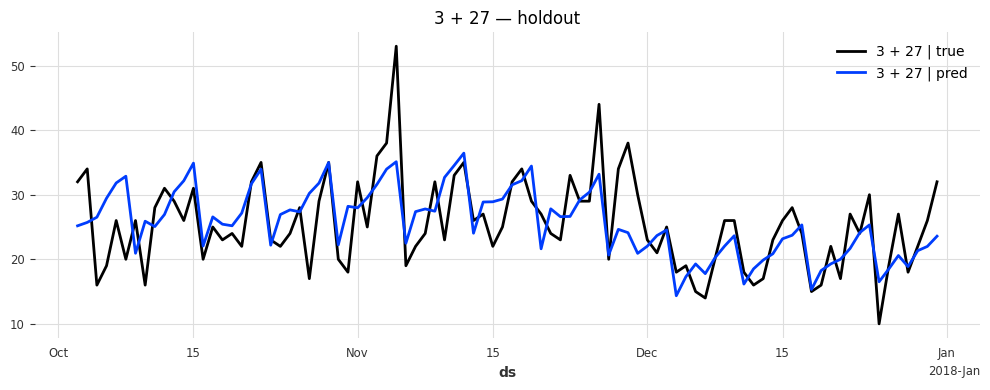

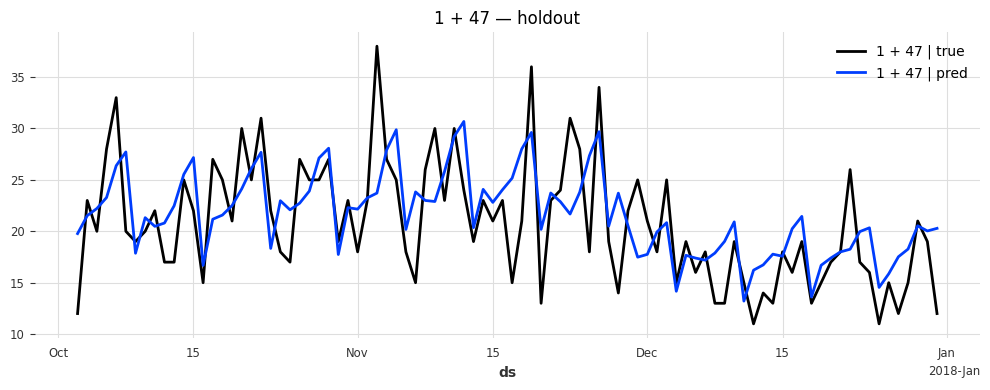

================= DONE =================

DONE NBEATS tuned: 12.453615188598633 nan


In [22]:
# N-BEATS (small)
series_use, names_use = target_series, target_names
N_EPOCHS   = 40         
BATCH_SIZE = 256
INP_CHUNK  = 180        
N_FOLDS    = 0

sm_hold, sm_bt = run_darts_global_from_lists(
    model_name="Darts_NBEATS (small, tuned)",
    build_model=lambda: make_nbeats(
        n_epochs=N_EPOCHS,
        batch_size=BATCH_SIZE,
        input_chunk_length=INP_CHUNK,
        output_chunk_length=HORIZON,
    ),
    series_all=series_use,
    horizon=HORIZON,
    results_path=results_file,
    past_cov_list=past_cov_list,
    future_cov_list=future_cov_list,
    names=names_use,
    n_folds=N_FOLDS,
)
print("DONE NBEATS tuned:", sm_hold, sm_bt)

## GRU-tuned

================= Darts_GRU128 (small): START =================
Split holdout...
Scale (fit/transform)...
Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit: supports(pc=True, fc=False) | epochs=30


`Trainer.fit` stopped: `max_epochs=30` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Fit done in 292.5s.
Predict (holdout)...


Predicting: |          | 0/? [00:00<?, ?it/s]

[Darts_Darts_GRU128 (small)] SMAPE holdout: 12.1640


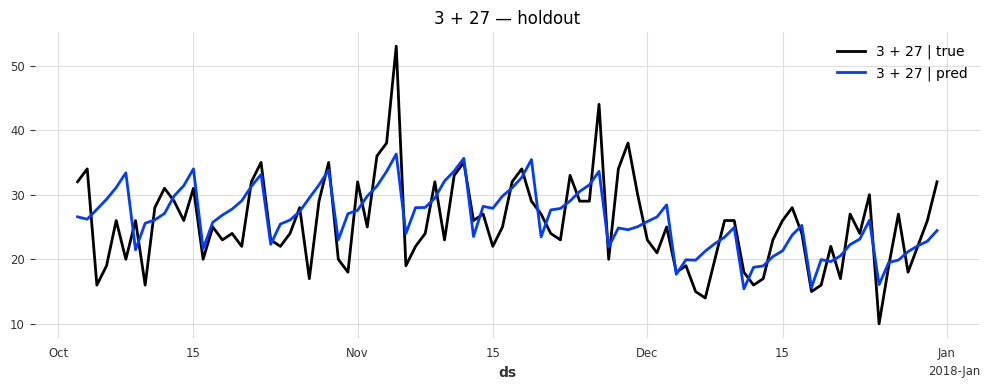

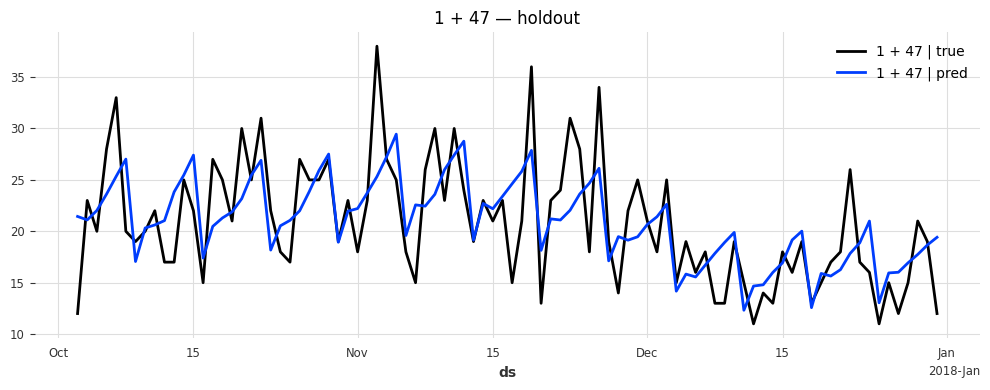

================= DONE =================

DONE GRU128: 12.163954734802246 nan


In [23]:
# GRU с hidden_dim=128 и длиннее окно
N_EPOCHS   = 30
BATCH_SIZE = 256
INP_CHUNK  = 180
N_FOLDS    = 0

def make_gru128():
    return BlockRNNModel(
        model="GRU",
        input_chunk_length=INP_CHUNK,
        output_chunk_length=HORIZON,
        hidden_dim=128,
        dropout=0.1,
        batch_size=BATCH_SIZE,
        n_epochs=N_EPOCHS,
        random_state=42,
        pl_trainer_kwargs=dict(precision="32-true", **trainer),
    )

sm_hold, sm_bt = run_darts_global_from_lists(
    model_name="Darts_GRU128 (small)",
    build_model=make_gru128,
    series_all=series_use,
    horizon=HORIZON,
    results_path=results_file,
    past_cov_list=past_cov_list,
    future_cov_list=future_cov_list,  
    names=names_use,
    n_folds=N_FOLDS,
)
print("DONE GRU128:", sm_hold, sm_bt)

## АНСАМБЛЬ Darts: NBEATS + GRU + LSTM (mean & median)

Scaling:


  0%|          | 0/150 [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
`Trainer.fit` stopped: `max_epochs=30` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


[NBEATS] holdout SMAPE: 12.3278


`Trainer.fit` stopped: `max_epochs=25` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


[GRU128] holdout SMAPE: 12.3516


`Trainer.fit` stopped: `max_epochs=25` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[LSTM128] holdout SMAPE: 12.8114
[Ensemble mean]   SMAPE: 12.2365
[Ensemble median] SMAPE: 12.3034


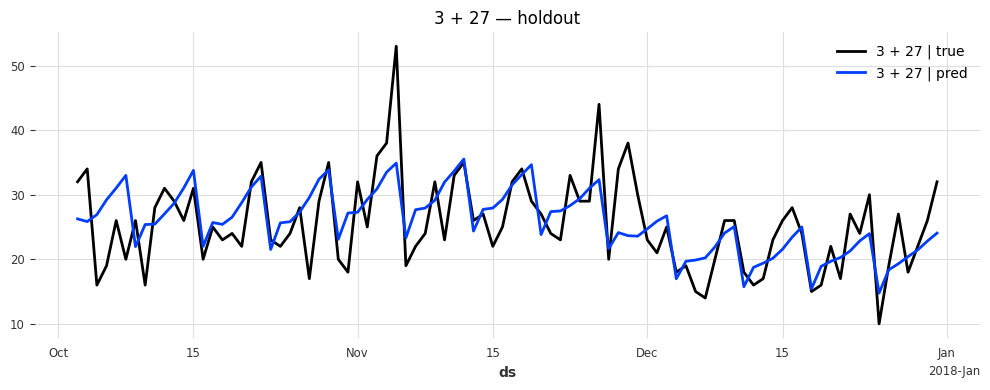

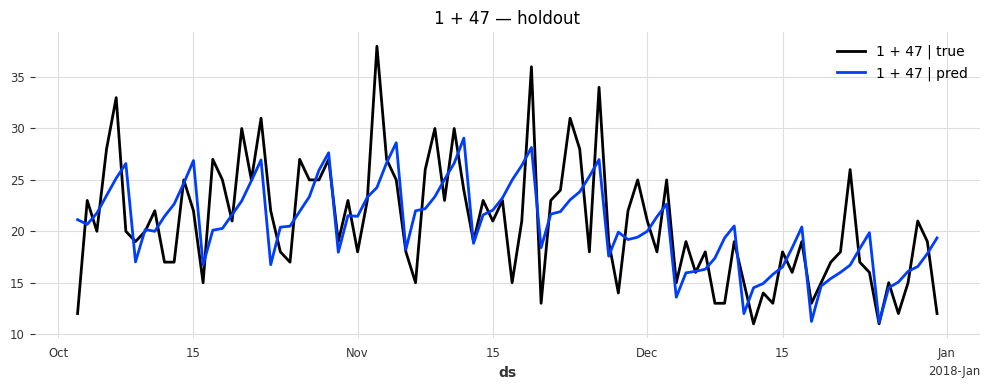

In [24]:
INP_CHUNK = 180

# сплит + скейл 
tr_hold, te_hold = split_holdout(series_use, horizon=HORIZON)
tr_s, te_s, scs  = scale_fit_transform(tr_hold, te_hold)

# для precision="32-true"
tr_s = [s.astype(np.float32) for s in tr_s]
te_s = [s.astype(np.float32) for s in te_s]

# билдеры моделей
def _nbeats():
    return make_nbeats(n_epochs=30, batch_size=256,
                       input_chunk_length=INP_CHUNK, output_chunk_length=HORIZON)

def _gru():
    return BlockRNNModel(model="GRU",
                         input_chunk_length=INP_CHUNK, output_chunk_length=HORIZON,
                         hidden_dim=128, dropout=0.1,
                         batch_size=256, n_epochs=25, random_state=42,
                         pl_trainer_kwargs=dict(precision="32-true", **trainer))

def _lstm():
    return BlockRNNModel(model="LSTM",
                         input_chunk_length=INP_CHUNK, output_chunk_length=HORIZON,
                         hidden_dim=128, dropout=0.1,
                         batch_size=256, n_epochs=25, random_state=42,
                         pl_trainer_kwargs=dict(precision="32-true", **trainer))

builders = [("NBEATS", _nbeats), ("GRU128", _gru), ("LSTM128", _lstm)]

# треним и собираем предсказания
all_preds = []       # список [список предсказаний по сегментам] для каждой модели
ind_scores = []      # [(name, smape)]
for name, build in builders:
    m = build()
    m.fit(tr_s, verbose=False)
    p_s = m.predict(HORIZON, series=tr_s)
    p   = inverse_transform_list(p_s, scs)
    all_preds.append(p)
    ind_sm = mean_smape(te_hold, p)
    ind_scores.append((name, ind_sm))
    print(f"[{name}] holdout SMAPE: {ind_sm:.4f}")
    del m

# усреднения: mean и median
avg_preds, med_preds = [], []
for i in range(len(tr_s)):
    preds_i = [plist[i] for plist in all_preds]  # TimeSeries этого сегмента от каждой модели

    # mean
    acc = preds_i[0]
    for ts in preds_i[1:]:
        acc = acc + ts
    avg_preds.append(acc / len(preds_i))

    # median
    vals = np.stack([ts.univariate_values() for ts in preds_i], axis=0)  # [n_models, H]
    med  = np.median(vals, axis=0)
    med_preds.append(preds_i[0].with_values(med))

sm_mean = mean_smape(te_hold, avg_preds)
sm_medi = mean_smape(te_hold, med_preds)
print(f"[Ensemble mean]   SMAPE: {sm_mean:.4f}")
print(f"[Ensemble median] SMAPE: {sm_medi:.4f}")

# лог в results.csv
results_file.parent.mkdir(parents=True, exist_ok=True)
write_header = not results_file.exists()
import csv
with open(results_file, "a", newline="") as f:
    wr = csv.writer(f)
    if write_header: wr.writerow(["model","mode","avg_metric"])
    for name, sc in ind_scores:
        wr.writerow([f"Darts_{name} (small, ens part)", "holdout", sc])
    wr.writerow(["Darts_Ensemble (mean)", "holdout", sm_mean])
    wr.writerow(["Darts_Ensemble (median)", "holdout", sm_medi])

# быстрый график по нескольким сегментам для mean
try:
    plot_holdout_examples(te_hold, avg_preds, names_use, max_plots=2)
except Exception as e:
    print(f"[plot skipped] {e}")

## TimesNet (neuralforecast)

In [21]:
# TimesNet (neuralforecast) on SMALL panel
import warnings, math, gc, time
import numpy as np
import pandas as pd
import torch
warnings.filterwarnings("ignore")

from neuralforecast import NeuralForecast
from neuralforecast.models import TimesNet

# helpers 
def make_panel_with_exog(panel: pd.DataFrame,
                         exog_df: pd.DataFrame | None,
                         known_future: list[str]):
    """Вернёт (panel_ext[unique_id, ds, y, ...exog...], futr_cols, hist_cols)."""
    # safety
    if not np.issubdtype(panel["ds"].dtype, np.datetime64):
        panel = panel.copy()
        panel["ds"] = pd.to_datetime(panel["ds"])
    panel["unique_id"] = panel["unique_id"].astype(str)

    if exog_df is None or exog_df.empty:
        return panel, [], []

    exog_df = exog_df.copy()
    if not isinstance(exog_df.index, pd.DatetimeIndex):
        exog_df.index = pd.to_datetime(exog_df.index, errors="coerce")
    exog_df = exog_df.sort_index()
    exog_df.index.name = "ds"

    # MultiIndex -> long по сегментам
    if isinstance(exog_df.columns, pd.MultiIndex) and exog_df.columns.nlevels == 2:
        parts = []
        for uid in exog_df.columns.get_level_values(0).unique():
            seg_df = exog_df.xs(uid, level=0, axis=1)
            tmp = seg_df.reset_index()       # 'ds'
            tmp.insert(0, "unique_id", str(uid))
            parts.append(tmp)
        if not parts:
            return panel, [], []
        exog_long = pd.concat(parts, ignore_index=True)
        panel_ext = panel.merge(exog_long, on=["unique_id", "ds"], how="left")
    else:
        # глобальные экзогены
        tmp = exog_df.reset_index()  # 'ds'
        panel_ext = panel.merge(tmp, on="ds", how="left")

    # ffill/bfill внутри каждого сегмента
    feat_cols = [c for c in panel_ext.columns if c not in ("unique_id", "ds", "y")]
    panel_ext = panel_ext.sort_values(["unique_id", "ds"])
    if feat_cols:
        panel_ext[feat_cols] = (panel_ext
            .groupby("unique_id", group_keys=False)[feat_cols]
            .apply(lambda g: g.ffill().bfill()))

    kf = set(known_future)
    futr_cols = [c for c in feat_cols if c in kf]
    hist_cols = [c for c in feat_cols if c not in kf]
    return panel_ext, futr_cols, hist_cols


def split_holdout_panel(panel: pd.DataFrame, horizon: int, shift: int = 0):
    """На каждый uid: train =[:- (shift+h)], test =[-(shift+h): -shift]."""
    trains, tests = [], []
    for uid, g in panel.groupby("unique_id", sort=False):
        g = g.sort_values("ds")
        n = len(g)
        cut = n - (shift + horizon)
        if cut <= 0:
            continue
        tr = g.iloc[:cut].copy()
        te = g.iloc[cut:cut + horizon].copy()
        if len(te) == horizon:
            trains.append(tr); tests.append(te)
    cols = panel.columns
    tr_df = pd.concat(trains, ignore_index=True) if trains else pd.DataFrame(columns=cols)
    te_df = pd.concat(tests, ignore_index=True) if tests else pd.DataFrame(columns=cols)
    return tr_df, te_df


def smape_np(y, yhat, eps=1e-8):
    y = np.asarray(y, dtype=float)
    yhat = np.asarray(yhat, dtype=float)
    denom = np.abs(y) + np.abs(yhat) + eps
    return float(np.mean(2.0 * np.abs(y - yhat) / denom) * 100.0)

def smape_panel(y_true: pd.DataFrame, y_pred: pd.DataFrame, col_pred: str) -> float:
    vals = []
    for uid, g in y_true.groupby("unique_id", sort=False):
        gt = g[["ds", "y"]]
        pr = y_pred[y_pred["unique_id"] == uid][["ds", col_pred]]
        m = gt.merge(pr, on="ds", how="inner")
        if not m.empty:
            vals.append(smape_np(m["y"].values, m[col_pred].values))
    return float(np.mean(vals)) if vals else math.nan

#  build NF inputs 
print(f"[SMALL] рядов: {panel['unique_id'].nunique()} сегментов; пример: {panel['unique_id'].astype(str).unique()[:5]}")
panel_nf, futr_cols, hist_cols = make_panel_with_exog(panel, exog, known_future)
print("exog присутствует:", bool(exog is not None), "| futr:", futr_cols, "| hist:", hist_cols)

tr_hold, te_hold = split_holdout_panel(panel_nf, horizon=HORIZON, shift=0)
print(f"train rows: {len(tr_hold)} | test rows: {len(te_hold)}")
print("CUDA available:", torch.cuda.is_available())

# model
model = TimesNet(
    h=HORIZON,
    input_size=min(2 * HORIZON, 256),
    max_steps=120,                 
    learning_rate=1e-3,
    batch_size=128,
    scaler_type="robust",
    random_seed=42,
    futr_exog_list=futr_cols,
    hist_exog_list=hist_cols,
)

nf = NeuralForecast(models=[model], freq=freq)

t0 = time.time()
nf.fit(df=tr_hold)  # PL сам выберет GPU, если доступен

# predict
if futr_cols:
    futr_df = te_hold[["unique_id", "ds"] + futr_cols].copy()
    futr_df["ds"] = pd.to_datetime(futr_df["ds"])
    futr_df.sort_values(["unique_id", "ds"], inplace=True)
    fc = nf.predict(futr_df=futr_df)
else:
    fc = nf.predict()

fit_time = time.time() - t0

pred_col = next(c for c in fc.columns if c not in ("unique_id", "ds"))
smape_hold = smape_panel(te_hold, fc, pred_col)
print(f"[NF_TimesNet] SMAPE holdout: {smape_hold:.4f} | fit {fit_time:.1f}s")

# лог в results.csv
results_file.parent.mkdir(parents=True, exist_ok=True)
write_header = not results_file.exists()
with open(results_file, "a", newline="") as f:
    import csv
    wr = csv.writer(f)
    if write_header: wr.writerow(["model","mode","avg_metric"])
    wr.writerow(["NF_TimesNet (small)", "holdout", smape_hold])

[SMALL] рядов: 150 сегментов; пример: ['1 + 1' '1 + 10' '1 + 11' '1 + 12' '1 + 13']


Seed set to 42


exog присутствует: True | futr: ['item', 'quarter', 'quarter_end', 'quarter_start', 'store'] | hist: []
train rows: 260400 | test rows: 13500
CUDA available: True


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 48.9 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.948    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[NF_TimesNet] SMAPE holdout: 13.6709 | fit 228.0s


## TimesNet (neuralforecast)-tuned

In [25]:
import time, math, gc
import numpy as np
import pandas as pd
import torch
from neuralforecast import NeuralForecast
from neuralforecast.models import TimesNet

# подготовка panel+exog
panel_nf, futr_cols, hist_cols = make_panel_with_exog(panel, exog, known_future)
tr_hold, te_hold = split_holdout_panel(panel_nf, horizon=HORIZON, shift=0)

def run_timesnet_cfg(name, input_size, max_steps, lr, bs, use_exog=True):
    m = TimesNet(
        h=HORIZON,
        input_size=input_size,
        max_steps=max_steps,
        learning_rate=lr,
        batch_size=bs,
        scaler_type="robust",
        random_seed=42,
        futr_exog_list=(futr_cols if use_exog else []),
        hist_exog_list=(hist_cols if use_exog else []),
    )
    nf = NeuralForecast(models=[m], freq=freq)

    t0 = time.time()
    nf.fit(df=tr_hold)  # GPU подхватится сам, если доступен
    if use_exog and futr_cols:
        futr_df = te_hold[["unique_id", "ds"] + futr_cols].copy()
        futr_df["ds"] = pd.to_datetime(futr_df["ds"])
        futr_df.sort_values(["unique_id","ds"], inplace=True)
        fc = nf.predict(futr_df=futr_df)
    else:
        fc = nf.predict()
    fit_time = time.time() - t0

    pred_col = next(c for c in fc.columns if c not in ("unique_id","ds"))
    sm = smape_panel(te_hold, fc, pred_col)
    print(f"[{name}] SMAPE={sm:.4f} | fit={fit_time:.1f}s")
    return sm, fit_time, fc, pred_col

# небольшой сет конфигов 
cfgs = [
    ("TN_is120_bs128_lr1e-3_exog", 120, 120, 1e-3, 128, True),
    ("TN_is180_bs128_lr1e-3_exog", 180, 120, 1e-3, 128, True),
    ("TN_is240_bs128_lr1e-3_exog", 240, 120, 1e-3, 128, True),
    ("TN_is180_bs256_lr1e-3_exog", 180, 120, 1e-3, 256, True),
    ("TN_is180_bs128_lr5e-4_exog", 180, 120, 5e-4, 128, True),
    ("TN_is180_bs128_lr1e-3_noex", 180, 120, 1e-3, 128, False),
]

results = []
for name, isz, steps, lr, bs, use_exog in cfgs:
    try:
        sm, t, _, _ = run_timesnet_cfg(name, isz, steps, lr, bs, use_exog)
        results.append((name, sm, t, isz, steps, lr, bs, use_exog))
    except Exception as e:
        print(f"[{name}] FAIL: {e}")

# выбираем лучший по SMAPE
if results:
    results.sort(key=lambda x: x[1])
    best = results[0]
    print("\nBEST:", best[:3], "| cfg:", best[3:])
    best_name, _, _, isz, steps, lr, bs, use_exog = best

    # лог в results.csv
    results_file.parent.mkdir(parents=True, exist_ok=True)
    write_header = not results_file.exists()
    with open(results_file, "a", newline="") as f:
        import csv
        wr = csv.writer(f)
        if write_header: wr.writerow(["model","mode","avg_metric"])
        wr.writerow([f"NF_TimesNet small tuned ({best_name})", "holdout", best[1]])

    # лёгкий seed-ансамбль на лучшем конфиге (3 сида)
    print("\n[Seed-ensemble] training 3 seeds on best cfg...")
    models = []
    for seed in (41, 42, 43):
        models.append(
            TimesNet(
                h=HORIZON,
                input_size=isz,
                max_steps=steps,
                learning_rate=lr,
                batch_size=bs,
                scaler_type="robust",
                random_seed=seed,
                futr_exog_list=(futr_cols if use_exog else []),
                hist_exog_list=(hist_cols if use_exog else []),
                alias=f"TN_s{seed}",
            )
        )
    nf_ens = NeuralForecast(models=models, freq=freq)
    nf_ens.fit(df=tr_hold)
    if use_exog and futr_cols:
        futr_df = te_hold[["unique_id", "ds"] + futr_cols].copy()
        futr_df["ds"] = pd.to_datetime(futr_df["ds"]); futr_df.sort_values(["unique_id","ds"], inplace=True)
        fc_ens = nf_ens.predict(futr_df=futr_df)
    else:
        fc_ens = nf_ens.predict()

    model_cols = [c for c in fc_ens.columns if c not in ("unique_id","ds")]
    fc_ens["ens"] = fc_ens[model_cols].mean(axis=1)
    sm_ens = smape_panel(te_hold, fc_ens, "ens")
    print(f"[TimesNet seed-ensemble x3] SMAPE={sm_ens:.4f}")

    # лог ансамбля
    with open(results_file, "a", newline="") as f:
        import csv; csv.writer(f).writerow([f"NF_TimesNet seed-ens(3) small [{best_name}]", "holdout", sm_ens])

Seed set to 42
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 25.4 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.854    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

Seed set to 42


[TN_is120_bs128_lr1e-3_exog] SMAPE=13.2247 | fit=99.0s


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 48.9 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.948    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

Seed set to 42


[TN_is180_bs128_lr1e-3_exog] SMAPE=14.0343 | fit=225.2s


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 79.5 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.8 M     Trainable params
0         Non-trainable params
4.8 M     Total params
19.070    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

Seed set to 42


[TN_is240_bs128_lr1e-3_exog] SMAPE=13.0288 | fit=1578.8s


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 48.9 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.948    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

Seed set to 42


[TN_is180_bs256_lr1e-3_exog] SMAPE=12.9726 | fit=412.6s


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 48.9 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.948    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

Seed set to 42


[TN_is180_bs128_lr5e-4_exog] SMAPE=13.8574 | fit=262.2s


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 192    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 48.9 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.946    Total estimated model params size (MB)
50        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

Seed set to 41
Seed set to 42
Seed set to 43


[TN_is180_bs128_lr1e-3_noex] SMAPE=14.0889 | fit=287.5s

BEST: ('TN_is180_bs256_lr1e-3_exog', 12.972645205408696, 412.56287813186646) | cfg: (180, 120, 0.001, 256, True)

[Seed-ensemble] training 3 seeds on best cfg...


GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 48.9 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.948    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 48.9 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.948    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name           | Type          | Params | Mode 
---------------------------------------------------------
0 | loss           | MAE           | 0      | train
1 | padder_train   | ConstantPad1d | 0      | train
2 | scaler         | TemporalNorm  | 0      | train
3 | model          | ModuleList    | 4.7 M  | train
4 | enc_embedding  | DataEmbedding | 512    | train
5 | layer_norm     | LayerNorm     | 128    | train
6 | predict_linear | Linear        | 48.9 K | train
7 | projection     | Linear        | 65     | train
---------------------------------------------------------
4.7 M     Trainable params
0         Non-trainable params
4.7 M     Total params
18.948    Total estimated model params size (MB)
52        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_steps=120` reached.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: |          | 0/? [00:00<?, ?it/s]

[TimesNet seed-ensemble x3] SMAPE=13.1691


## NeuralProphet

In [1]:
# constants & paths
from pathlib import Path
import pandas as pd
import json

HORIZON = 90
CONSIDER_SHOP = [1, 2, 3]
SEGMENTS_TO_SHOW = ['3 + 27', '1 + 47']

root_path = r'D:\ML\LS\MLA\Time_series\Time_series2\practice'
results_file = Path(root_path) / 'results.csv'

# small = быстрые прогоны; full = большой фрейм
PREFIX = 'small'  

# logger
def log_result(model_name: str, mode: str, metric: float, results_path: Path = results_file):
    results_path.parent.mkdir(parents=True, exist_ok=True)
    write_header = not results_path.exists()
    with open(results_path, 'a', newline='') as f:
        import csv
        wr = csv.writer(f)
        if write_header:
            wr.writerow(['model', 'mode', 'avg_metric'])
        wr.writerow([model_name, mode, float(metric)])


def show_top(n=10, path: Path = results_file):
    df = pd.read_csv(path)
    display(df.sort_values('avg_metric').head(n))

# Быстрая чистка по паттерну названия модели

def drop_results_by_pattern(pattern: str, path: Path = results_file):
    df = pd.read_csv(path)
    df = df[~df['model'].astype(str).str.contains(pattern, na=False)]
    df.to_csv(path, index=False)
    print(f"Очистили записи с паттерном: {pattern}")

In [2]:
# load bundle saved (panel/exog/static/freq/known_future) 
from typing import Tuple
import pandas as pd

def load_bundle(root_path: str, prefix: str):
    rp = Path(root_path)
    panel = pd.read_parquet(rp / f'{prefix}_panel.parquet')      # cols: unique_id, ds, y
    freq  = (rp / f'{prefix}_freq.txt').read_text().strip()
    static = pd.read_csv(rp / f'{prefix}_static.csv')

    exog_path = rp / f'{prefix}_exog.parquet'
    exog = pd.read_parquet(exog_path) if exog_path.exists() else None

    kf_path = rp / f'{prefix}_known_future.json'
    known_future = json.loads(kf_path.read_text()) if kf_path.exists() else []
    return panel, freq, static, exog, known_future

panel, freq, static, exog, known_future = load_bundle(root_path, PREFIX)

# фильтрация по магазинам
if CONSIDER_SHOP:
    allowed = set(static.loc[static['shop_id'].isin(CONSIDER_SHOP), 'unique_id'].astype(str))
    mask = panel['unique_id'].astype(str).isin(allowed)
    panel = panel.loc[mask].copy() if mask.any() else panel

print(panel.head())
print('freq:', freq, '| exog:', exog is not None, '| known_future:', known_future)

          ds unique_id     y
2 2015-12-31    2 + 13  67.0
3 2015-12-31    2 + 15  68.0
4 2015-12-31    2 + 18  84.0
5 2015-12-31    2 + 22  84.0
6 2015-12-31    2 + 25  78.0
freq: D | exog: True | known_future: ['item', 'quarter', 'quarter_end', 'quarter_start', 'store']


In [7]:
import pandas as pd
import numpy as np
from neuralprophet import NeuralProphet

# --- страховка по типам/порядку ---
panel['ds'] = pd.to_datetime(panel['ds'])
panel['y']  = pd.to_numeric(panel['y'], errors='coerce')
panel = panel.sort_values(['unique_id', 'ds']).reset_index(drop=True)
known_future = set(known_future or [])

def split_holdout_panel(panel: pd.DataFrame, horizon: int):
    trains, tests = [], []
    for uid, g in panel.groupby('unique_id', sort=False):
        g = g.sort_values('ds')
        cut = len(g) - horizon
        if cut <= 0:
            continue
        trains.append(g.iloc[:cut].copy())
        tests.append(g.iloc[cut:].copy())
    if not trains or not tests:
        return None, None
    return (pd.concat(trains).reset_index(drop=True),
            pd.concat(tests).reset_index(drop=True))

def smape_np(y, yhat, eps=1e-8):
    y = np.asarray(y, dtype=float); yhat = np.asarray(yhat, dtype=float)
    return float(np.mean(2*np.abs(y - yhat) / (np.abs(y) + np.abs(yhat) + eps)) * 100)

def ensure_ds_column(df: pd.DataFrame) -> pd.DataFrame:
    df = df.reset_index()
    if df.columns[0] != 'ds':
        df = df.rename(columns={df.columns[0]: 'ds'})
    df['ds'] = pd.to_datetime(df['ds'])
    return df

def coerce_regressors_numeric(df: pd.DataFrame, reg_cols: list[str]) -> list[str]:
    """Привести регрессоры к числам: bool→int8, category→codes, object (если похоже на числа)→float.
       Выкинуть полностью NaN и константные."""
    keep = []
    for c in reg_cols:
        if c not in df.columns:
            continue
        s = df[c]
        # bool → int8
        if s.dtype == bool or s.dtype.kind == 'b':
            df[c] = s.astype('int8')
        # category → codes
        elif str(s.dtype) == 'category':
            df[c] = s.cat.codes.replace(-1, np.nan).astype('float32')
        # object → попытка в число
        elif s.dtype == object:
            df[c] = pd.to_numeric(s, errors='coerce')
        # остальные оставляем как есть

        # дроп полностью NaN
        if df[c].notna().sum() == 0:
            continue
        # дроп константные
        if df[c].nunique(dropna=True) < 2:
            continue
        keep.append(c)
    return keep

# подготовка сегмента: таргет + future регрессоры 
def prepare_np_segment(uid: str) -> tuple[pd.DataFrame, list[str]]:
    g = panel[panel['unique_id'] == uid].sort_values('ds')[['ds', 'y']].copy()
    reg_names: list[str] = []
    if exog is None or exog.empty or len(known_future) == 0:
        return g, reg_names

    if isinstance(exog.columns, pd.MultiIndex) and exog.columns.nlevels == 2:
        if uid in exog.columns.get_level_values(0):
            seg_df = exog.xs(uid, level=0, axis=1).copy()
            reg_cols = [c for c in seg_df.columns if c in known_future]
            if reg_cols:
                seg_df = ensure_ds_column(seg_df[reg_cols])
                # привести регрессоры к числам + очистить
                reg_cols = coerce_regressors_numeric(seg_df, reg_cols)
                if reg_cols:
                    reg_names = reg_cols
                    g = g.merge(seg_df[['ds'] + reg_cols], on='ds', how='left')
    else:
        reg_cols = [c for c in exog.columns if c in known_future]
        if reg_cols:
            flat_df = ensure_ds_column(exog[reg_cols].copy())
            reg_cols = coerce_regressors_numeric(flat_df, reg_cols)
            if reg_cols:
                reg_names = reg_cols
                g = g.merge(flat_df[['ds'] + reg_cols], on='ds', how='left')

    if reg_names:
        g[reg_names] = g[reg_names].ffill().bfill()
    return g, reg_names

# holdout split
tr, te = split_holdout_panel(panel, HORIZON)
assert tr is not None and te is not None, 'Недостаточно данных для holdout.'

# обучение и оценка per-segment
scores = []
for uid, gtr in tr.groupby('unique_id', sort=False):
    gte = te[te['unique_id'] == uid]
    if gte.empty:
        continue

    df_np, regs = prepare_np_segment(uid)
    train_df = df_np[df_np['ds'].isin(gtr['ds'])].copy()

    # без лагов NP сам меняет n_forecasts на 1 
    m = NeuralProphet(
        yearly_seasonality=True,
        weekly_seasonality=True,
        daily_seasonality=False,
        n_lags=0,
        n_forecasts=1,
        epochs=40,
        learning_rate=0.01,
    )
    for r in regs:
        m = m.add_future_regressor(name=r, mode='additive')

    m.fit(train_df[['ds', 'y'] + regs], freq=freq, progress='bar')

    # будущие даты = даты теста; регрессоры берём из df_np 
    future_df = gte[['ds']].copy()
    if regs:
        regs_df = df_np[['ds'] + regs].copy()
        future_df = future_df.merge(regs_df, on='ds', how='left')
        future_df[regs] = future_df[regs].ffill().bfill()

    # даём истории + будущее, чтобы NP корректно интерпретировал вход
    pred_input = pd.concat([train_df[['ds', 'y'] + regs], future_df], ignore_index=True)
    fcst = m.predict(pred_input).tail(HORIZON)

    # при n_forecasts=1 будет колонка yhat1
    yhat_cols = [c for c in fcst.columns if c.startswith('yhat')]
    yhat = fcst[yhat_cols].values.ravel()[:HORIZON]

    score = smape_np(gte['y'].values, yhat)
    scores.append(score)

np_smape = float(np.mean(scores)) if scores else float('nan')
print(f"[NeuralProphet+pandas] SMAPE holdout: {np_smape:.4f}")
log_result('NeuralProphet (small, pandas-only + regs)', 'holdout', np_smape, results_file)

WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

WARNING - (py.warnings._showwarnmsg) - D:\Anaconda\envs\etna_env_dl\lib\site-packages\pytorch_lightning\utilities\data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 32. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.

WARNING - (py.warnings._showwarnmsg) - D:\Anaconda\envs\etna_env_dl\lib\site-packages\pytorch_lightning\utilities\data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 2. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_

Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column
WARNING - (NP.forecaster.fit) - When Global modeling with local normalization, metrics are displayed in normalized scale.
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.844% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32


Training: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.df_utils._infer_frequency) - Major frequency D corresponds to 99.863% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - D
INFO - (NP.data.processing._handle_missing_data) - Dropped 90 rows at the end with NaNs in 'y' column.


Predicting: |          | 0/? [00:00<?, ?it/s]

INFO - (NP.df_utils.return_df_in_original_format) - Returning df with no ID column


[NeuralProphet+pandas] SMAPE holdout: 12.6152


## AutoML
### подготовка данных для autots

In [6]:
from pathlib import Path
import pandas as pd
import numpy as np
import json

root_path = r'D:\ML\LS\MLA\Time_series\Time_series2\practice'
PREFIX = 'small'          # 'small' или 'full'
HORIZON = 90
results_file = Path(root_path) / 'results.csv'


CONSIDER_SHOP = []       

# загрузка ранее сохранённого бандла
from pathlib import Path

def load_bundle(root_path: str, prefix: str):
    rp = Path(root_path)
    panel = pd.read_parquet(rp / f'{prefix}_panel.parquet', engine='pyarrow')  # cols: unique_id, ds, y
    freq  = (rp / f'{prefix}_freq.txt').read_text(encoding='utf-8').strip()
    static = pd.read_csv(rp / f'{prefix}_static.csv', encoding='utf-8')

    exog_path = rp / f'{prefix}_exog.parquet'
    exog = pd.read_parquet(exog_path, engine='pyarrow') if exog_path.exists() else None

    kf_path = rp / f'{prefix}_known_future.json'
    known_future = json.loads(kf_path.read_text(encoding='utf-8')) if kf_path.exists() else []
    return panel, freq, static, exog, known_future

panel, freq, static, exog, known_future = load_bundle(root_path, PREFIX)

# базовая чистка/приведение типов
panel['ds'] = pd.to_datetime(panel['ds'])
panel['y'] = pd.to_numeric(panel['y'], errors='coerce')
panel = panel.sort_values(['unique_id','ds']).reset_index(drop=True)

# опциональная фильтрация по магазинам
if CONSIDER_SHOP:
    allowed = set(static.loc[static['shop_id'].isin(CONSIDER_SHOP), 'unique_id'].astype(str))
    panel = panel[panel['unique_id'].astype(str).isin(allowed)].reset_index(drop=True)

print(panel.head())
print('freq:', freq)

# смягчённые метрики/служебки
def smape_np(y, yhat, eps=1e-8):
    y = np.asarray(y, dtype=float)
    yhat = np.asarray(yhat, dtype=float)
    return float(np.mean(2*np.abs(y - yhat) / (np.abs(y) + np.abs(yhat) + eps)) * 100)

# перекодируем существующий results.csv в UTF-8 с BOM 
def recode_results_to_utf8_sig(path: Path = results_file):
    if not path.exists():
        return
    raw = path.read_bytes()
    try:
        txt = raw.decode('utf-8-sig')  
    except UnicodeDecodeError:
        txt = raw.decode('cp1251', errors='ignore')
    path.write_text(txt, encoding='utf-8-sig', newline='')

recode_results_to_utf8_sig(results_file)

# утилиты логирования/просмотра результатов (UTF-8 с BOM)
def log_result(model_name: str, mode: str, metric: float, results_path: Path = results_file):
    results_path.parent.mkdir(parents=True, exist_ok=True)
    write_header = not results_path.exists()
    with open(results_path, 'a', newline='', encoding='utf-8-sig') as f:
        import csv
        wr = csv.writer(f)
        if write_header:
            wr.writerow(['model', 'mode', 'avg_metric'])
        wr.writerow([model_name, mode, float(metric)])

def show_top(n=10, path: Path = results_file):
    df = pd.read_csv(path, encoding='utf-8-sig')
    display(df.sort_values('avg_metric').head(n))

def drop_results_by_pattern(pattern: str, path: Path = results_file):
    df = pd.read_csv(path, encoding='utf-8-sig')
    df = df[~df['model'].astype(str).str.contains(pattern, na=False)]
    df.to_csv(path, index=False, encoding='utf-8-sig')
    print(f"Очистили записи с паттерном: {pattern}")

          ds unique_id     y
0 2015-12-31   10 + 15  55.0
1 2016-01-01   10 + 15  68.0
2 2016-01-02   10 + 15  96.0
3 2016-01-03   10 + 15  98.0
4 2016-01-04   10 + 15  58.0
freq: D


In [8]:
# AutoTS, 15 сегментов
import numpy as np
import pandas as pd
import time
from autots import AutoTS

# страховка на типы/порядок
panel['ds'] = pd.to_datetime(panel['ds'])
panel['y']  = pd.to_numeric(panel['y'], errors='coerce')
panel = panel.sort_values(['unique_id', 'ds']).reset_index(drop=True)

def smape_np(y, yhat, eps=1e-8):
    y = np.asarray(y, float); yhat = np.asarray(yhat, float)
    return float(np.mean(2*np.abs(y - yhat) / (np.abs(y) + np.abs(yhat) + eps)) * 100)

def run_autots_holdout_general(panel: pd.DataFrame,
                               freq: str,
                               horizon: int,
                               sample_segments: int = 15,
                               min_train: int = None,
                               random_seed: int = 42):
    uids = panel['unique_id'].astype(str).unique()[:sample_segments]
    scores, used, skipped = [], 0, 0
    t0 = time.time()

    for uid in uids:
        g = (panel.loc[panel['unique_id'] == uid, ['ds', 'y']]
                  .sort_values('ds').dropna())
        if g.empty:
            skipped += 1
            continue

        # привести к нужной частоте и заполнить пропуски
        g = g.set_index('ds').asfreq(freq)
        g['y'] = g['y'].ffill().bfill()
        g = g.reset_index().rename(columns={'ds': 'date', 'y': 'value'})

        cut = len(g) - horizon
        if cut <= 0 or (min_train is not None and cut < min_train):
            skipped += 1
            continue

        train = g.iloc[:cut].copy()
        test  = g.iloc[cut:].copy()
        train_w = train.set_index('date')[['value']]

        try:
            model = AutoTS(
                forecast_length=horizon,
                frequency='infer',
                model_list='default',       
                transformer_list='fast',
                ensemble='simple',
                max_generations=5,
                num_validations=2,
                validation_method='backwards',
                verbose=0,
                random_seed=random_seed,
                n_jobs='auto',
            ).fit(train_w)

            fcst = model.predict().forecast
            pred = fcst['value'].values
            y    = test['value'].values
            if len(pred) != len(y):
                m = min(len(pred), len(y))
                pred, y = pred[:m], y[:m]

            scores.append(smape_np(y, pred))
            used += 1
        except Exception as e:
            print(f"[skip {uid}] {type(e).__name__}: {e}")
            skipped += 1
            continue

    avg_smape = float(np.mean(scores)) if scores else float('nan')
    elapsed_min = (time.time() - t0) / 60
    return avg_smape, used, skipped, elapsed_min

# запуск
sm_autots, used, skipped, mins = run_autots_holdout_general(
    panel, freq, HORIZON, sample_segments=15, min_train=HORIZON*2
)

print(f"[AutoTS default (15 seg)] SMAPE holdout: {sm_autots:.2f} | used={used}, skipped={skipped} | {mins:.1f} min")
log_result("AutoTS default (15 seg, small)", "holdout", sm_autots, results_file)

Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 8 in generation 0: DatepartRegression
Template Eval Error: ValueError('Only gave one variable to VAR') in model 25 in generation 0: VAR
Template Eval Error: ValueError('Only gave one variable to VAR') in model 26 in generation 0: VAR
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27 in generation 0: VECM
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28 in generation 0: VECM
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 31 in generation 0: FBProphet
Template Eval Error: AssertionError('Implementation function returned by `@overload` has an unexpected type.  Got <function nanmedian at 0x000001D7E4C35CF0>') in model 32 in generation 0: MultivariateRegression
Template Eval Error: ValueError("regression_type='User' but not future_regressor supplied.") in model 33 in generation 0: MultivariateRe

In [17]:
def run_autots_backtest(panel, freq, horizon, n_folds=3, sample_segments=15, random_seed=42):
    uids = panel['unique_id'].astype(str).unique()[:sample_segments]
    smapes = []; used=0
    for uid in uids:
        g = panel[panel['unique_id']==uid].sort_values('ds')[['ds','y']].dropna()
        if g.empty: continue
        s = g.set_index('ds')['y'].asfreq(freq).ffill().bfill()
        if len(s) <= (n_folds+1)*horizon:
            continue
        fold_scores=[]
        for f in range(n_folds,0,-1):
            cut = len(s) - f*horizon
            train = s.iloc[:cut].to_frame('value')
            test  = s.iloc[cut:cut+horizon]
            model = AutoTS(
                forecast_length=horizon,
                frequency='infer',
                model_list='default',
                transformer_list='fast',
                ensemble='simple',
                max_generations=5,
                num_validations=1,
                validation_method='backwards',
                verbose=0,
                random_seed=random_seed,
            ).fit(train)
            pred = model.predict().forecast['value'].values
            m = min(len(pred), len(test))
            fold_scores.append(smape_np(test.values[:m], pred[:m]))
        if fold_scores:
            smapes.append(np.mean(fold_scores)); used += 1
    return (float(np.mean(smapes)) if smapes else float('nan'), used)

bt_autots, used = run_autots_backtest(panel, freq, HORIZON, n_folds=3, sample_segments=15)
print(f"[AutoTS default (15 seg, small)] SMAPE backtest: {bt_autots:.3f} | used={used}")
log_result("AutoTS default (15 seg, small)", "backtest", bt_autots, results_file)

Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 8 in generation 0: DatepartRegression
Template Eval Error: ValueError('Only gave one variable to VAR') in model 25 in generation 0: VAR
Template Eval Error: ValueError('Only gave one variable to VAR') in model 26 in generation 0: VAR
Template Eval Error: ValueError('Only gave one variable to VECM') in model 27 in generation 0: VECM
Template Eval Error: ValueError('Only gave one variable to VECM') in model 28 in generation 0: VECM
Template Eval Error: ModuleNotFoundError("No module named 'fbprophet'") in model 31 in generation 0: FBProphet
Template Eval Error: AssertionError('Implementation function returned by `@overload` has an unexpected type.  Got <function nanmedian at 0x000001D7E4C35CF0>') in model 32 in generation 0: MultivariateRegression
Template Eval Error: ValueError("regression_type='User' but not future_regressor supplied.") in model 33 in generation 0: MultivariateRe

## PyCaret TS

In [10]:
import time, warnings
warnings.filterwarnings("ignore")

try:
    from pycaret.time_series import TSForecastingExperiment as TSX  # PyCaret 3.x
except ImportError:
    from pycaret.time_series import TimeSeriesExperiment as TSX      # PyCaret 2.x

def _sp_from_freq(freq: str) -> int:
    f = str(freq).upper()
    if f.startswith(('D','B')):   return 7      # дневные/рабочие дни -> недельная сезонность
    if f.startswith('W'):         return 52     # недельные -> годовая
    if f.startswith('M'):         return 12     # месячные -> годовая
    if f.startswith('Q'):         return 4      # квартальные
    if f.startswith('H'):         return 24     # почасовые -> суточная
    if f.startswith('T') or 'MIN' in f: return 60   # поминутные -> час
    if f.startswith('S'):         return 60     # посекундные -> минута
    return 7  # дефолт на всякий случай

def run_pycaret_holdout_heavy_fixed(panel, freq, horizon, sample_segments=15, seed=42):
    uids = panel['unique_id'].astype(str).unique()[:sample_segments]
    scores = []; used = skipped = 0
    t0 = time.time()
    sp = _sp_from_freq(freq)

    for uid in uids:
        try:
            g = (panel[panel['unique_id'] == uid]
                 .sort_values('ds')[['ds','y']]
                 .dropna())
            if g.empty:
                skipped += 1; continue

            # гарантируем DatetimeIndex с freq и без пропусков внутри ряда
            s = g.set_index('ds')['y'].asfreq(freq).ffill().bfill()
            cut = len(s) - horizon
            if cut <= 0:
                skipped += 1; continue
            train, test = s.iloc[:cut], s.iloc[cut:]

            exp = TSX()
            exp.setup(
                data=train,
                fh=horizon,
                fold=2,                    
                session_id=seed,
                seasonal_period=sp,        
                n_jobs=-1,
                verbose=False
            )

            # широкий поиск (без turbo), берём топ-3
            top_models = exp.compare_models(n_select=3, sort='smape', turbo=False)

            if not isinstance(top_models, list):
                top_models = [top_models]

            # тюним лучший
            tuned = exp.tune_model(top_models[0], optimize='smape', n_iter=25, choose_better=True)

            # пробуем ансамбль из tuned + остальных
            try:
                to_blend = [tuned] + [m for m in top_models[1:] if m is not None]
                blended = exp.blend_models(to_blend)
                final_model = blended
            except Exception:
                final_model = tuned

            final = exp.finalize_model(final_model)

            pred = exp.predict_model(final, fh=horizon).y_pred.values
            y    = test.values
            if len(pred) != len(y):
                m = min(len(pred), len(y)); pred, y = pred[:m], y[:m]

            # smape_np из ранних блоков
            scores.append(smape_np(y, pred))
            used += 1

        except Exception as e:
            print(f"[PyCaret heavy] skip {uid}: {e}")
            skipped += 1

    elapsed_min = (time.time() - t0)/60
    avg = float(np.mean(scores)) if scores else float('nan')
    return avg, used, skipped, elapsed_min

# запуск
sm_pc_h, used_h, skipped_h, mins_h = run_pycaret_holdout_heavy_fixed(
    panel, freq, HORIZON, sample_segments=15
)
print(f"[PyCaret TS heavy (≤15 seg, sp={_sp_from_freq(freq)})] SMAPE holdout: {sm_pc_h:.2f} | used={used_h}, skipped={skipped_h} | {mins_h:.1f} min")

# лог без юникода, чтобы консоль не падала
log_result("PyCaret TS heavy (<=15 seg, small, sp_num)", "holdout", sm_pc_h, results_file)

,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,0.8940,0.8677,11.3378,14.2802,0.1122,0.1100,0.4249,1.2250
stlf,STLF,1.0611,1.0361,13.4608,17.0604,0.1264,0.1339,0.1643,0.0450
ets,ETS,1.1281,1.0779,14.2967,17.7287,0.1293,0.1394,0.1248,0.1150
exp_smooth,Exponential Smoothing,1.1299,1.0794,14.3193,17.7538,0.1295,0.1396,0.1223,0.0800
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.1830,1.0885,14.9641,17.8588,0.1376,0.1399,0.0810,1.2550
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.1830,1.0885,14.9642,17.8589,0.1376,0.1399,0.0810,1.0500
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.1907,1.0952,15.0623,17.9696,0.1387,0.1408,0.0706,1.0400
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.1973,1.1006,15.1450,18.0585,0.1397,0.1416,0.0623,1.0800
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.1974,1.1007,15.1465,18.0600,0.1397,0.1417,0.0622,1.0350
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.2128,1.1138,15.3425,18.2767,0.1420,0.1436,0.0427,1.0500


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.9745,0.9473,12.4395,15.7223,0.1387,0.1409,0.2713
1,2017-04-05,1.2323,1.1787,15.5058,19.2092,0.1161,0.1260,0.0355
Mean,NaT,1.1034,1.0630,13.9727,17.4657,0.1274,0.1334,0.1534
SD,NaT,0.1289,0.1157,1.5332,1.7435,0.0113,0.0074,0.1179


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   15.1s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   26.5s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.0229,0.9853,13.0573,16.3541,0.1423,0.1472,0.2116
1,2017-04-05,0.8970,0.8907,11.2864,14.5166,0.0857,0.0902,0.4492
Mean,NaT,0.9600,0.9380,12.1718,15.4354,0.1140,0.1187,0.3304
SD,NaT,0.0630,0.0473,0.8855,0.9188,0.0283,0.0285,0.1188


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.0540,0.9626,13.2339,15.6655,0.1200,0.1229,0.2985,0.9350
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.0540,0.9626,13.2339,15.6656,0.1200,0.1229,0.2985,0.9450
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.0598,0.9683,13.3071,15.7600,0.1208,0.1236,0.2906,0.8900
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.0617,0.9719,13.3384,15.8302,0.1228,0.1241,0.2955,0.8800
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.0642,0.9727,13.3634,15.8319,0.1215,0.1241,0.2847,0.9350
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.0644,0.9728,13.3650,15.8338,0.1215,0.1242,0.2845,0.9250
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.0775,0.9852,13.5319,16.0382,0.1235,0.1258,0.2684,0.9100
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.0014,0.9746,12.6467,15.9813,0.1173,0.1262,0.2851,1.2100
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.0913,0.9993,13.7225,16.2970,0.1230,0.1294,0.2658,0.9650
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.0980,1.0252,13.8313,16.7579,0.1250,0.1337,0.2341,1.1700


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.6757,0.6509,8.6559,10.8740,0.1043,0.0981,0.6484
1,2017-04-05,1.5944,1.4307,19.8198,22.9665,0.1518,0.1669,-0.3285
Mean,NaT,1.1350,1.0408,14.2379,16.9202,0.1280,0.1325,0.1600
SD,NaT,0.4594,0.3899,5.5819,6.0462,0.0238,0.0344,0.4885


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.6s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.6980,0.6570,8.9426,10.9757,0.1064,0.1008,0.6418
1,2017-04-05,1.4137,1.2719,17.5740,20.4171,0.1341,0.1455,-0.0499
Mean,NaT,1.0559,0.9645,13.2583,15.6964,0.1203,0.1231,0.2959
SD,NaT,0.3579,0.3074,4.3157,4.7207,0.0139,0.0223,0.3459


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.1515,1.1031,16.2464,19.6366,0.1385,0.1407,0.2126,1.1750
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.2341,1.1724,17.3571,20.8200,0.1406,0.1474,0.0734,1.2000
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.2649,1.2190,17.8005,21.6619,0.1511,0.1518,0.0156,0.9100
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.2649,1.2190,17.8004,21.6618,0.1511,0.1518,0.0156,0.9000
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.2474,1.1809,17.5848,21.0076,0.1467,0.1520,0.0932,0.9850
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.2726,1.2251,17.9090,21.7704,0.1522,0.1528,0.0065,0.9000
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.2791,1.2301,18.0013,21.8604,0.1532,0.1537,-0.0010,0.8950
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.2789,1.2300,17.9992,21.8583,0.1532,0.1537,-0.0008,0.8950
stlf,STLF,1.2320,1.2151,17.3829,21.6350,0.1443,0.1547,0.0448,0.0400
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,1.2721,1.1937,17.9290,21.2321,0.1495,0.1550,0.0719,2.2350


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.0440,0.9919,14.9475,17.9020,0.1570,0.1523,0.3034
1,2017-04-05,1.1980,1.1545,16.6923,20.3201,0.1141,0.1223,0.2060
Mean,NaT,1.1210,1.0732,15.8199,19.1110,0.1356,0.1373,0.2547
SD,NaT,0.0770,0.0813,0.8724,1.2090,0.0215,0.0150,0.0487


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   14.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.6s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8661,0.8607,12.4003,15.5338,0.1344,0.1266,0.4755
1,2017-04-05,1.4522,1.3836,20.2349,24.3520,0.1376,0.1512,-0.1403
Mean,NaT,1.1591,1.1222,16.3176,19.9429,0.1360,0.1389,0.1676
SD,NaT,0.2931,0.2615,3.9173,4.4091,0.0016,0.0123,0.3079


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,0.9425,0.9616,12.2082,16.4281,0.1006,0.1020,0.4663,1.2250
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.0427,1.0383,13.5374,17.7565,0.1083,0.1108,0.3786,0.9750
stlf,STLF,1.2192,1.1569,15.8038,19.7608,0.1290,0.1339,0.2258,0.0450
exp_smooth,Exponential Smoothing,1.2403,1.2019,16.0738,20.5304,0.1256,0.1357,0.1649,0.0800
ets,ETS,1.2443,1.2053,16.1261,20.5892,0.1259,0.1361,0.1604,0.0950
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.3458,1.2619,17.5008,21.6018,0.1407,0.1433,0.0594,0.9000
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.3458,1.2620,17.5009,21.6019,0.1407,0.1433,0.0594,0.9300
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.3548,1.2683,17.6167,21.7093,0.1419,0.1443,0.0509,0.9500
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.3625,1.2738,17.7158,21.8044,0.1429,0.1452,0.0432,0.8950
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.3623,1.2737,17.7136,21.8023,0.1429,0.1452,0.0434,0.9350


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.1722,1.1084,14.9683,18.7674,0.1442,0.1527,0.2173
1,2017-04-05,1.2199,1.2305,16.0276,21.1972,0.1032,0.1115,0.2078
Mean,NaT,1.1960,1.1695,15.4980,19.9823,0.1237,0.1321,0.2125
SD,NaT,0.0239,0.0611,0.5296,1.2149,0.0205,0.0206,0.0047


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   24.9s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.9623,0.9497,12.2887,16.0801,0.1212,0.1217,0.4254
1,2017-04-05,1.0424,1.0491,13.6958,18.0724,0.0902,0.0949,0.4242
Mean,NaT,1.0024,0.9994,12.9923,17.0763,0.1057,0.1083,0.4248
SD,NaT,0.0400,0.0497,0.7035,0.9961,0.0155,0.0134,0.0006


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.1229,1.0867,14.0689,17.3694,0.1156,0.1197,0.3834,0.8850
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.1244,1.0928,14.0876,17.4678,0.1155,0.1202,0.3800,0.9100
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.1244,1.0928,14.0877,17.4675,0.1155,0.1202,0.3800,0.9200
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.1243,1.0944,14.0875,17.4946,0.1155,0.1203,0.3795,0.8900
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.1248,1.0971,14.0944,17.5385,0.1155,0.1205,0.3781,0.9400
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.1248,1.0971,14.0944,17.5385,0.1155,0.1205,0.3781,0.8950
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,1.1074,1.1159,13.8944,17.8887,0.1224,0.1290,0.3082,2.2450
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.2106,1.1923,15.1710,19.0680,0.1234,0.1312,0.2735,0.9000
dt_cds_dt,Decision Tree w/ Cond. Deseasonalize & Detrending,1.1858,1.1671,14.8747,18.7008,0.1306,0.1368,0.2673,0.9450
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.1910,1.1943,14.9425,19.1426,0.1295,0.1387,0.2177,1.1750


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,4.3833,4.1207,55.1334,66.4034,0.5153,0.7999,-8.9278
1,2017-04-05,4.0439,3.7952,50.5532,60.3842,0.3513,0.4623,-5.4818
Mean,NaT,4.2136,3.9579,52.8433,63.3938,0.4333,0.6311,-7.2048
SD,NaT,0.1697,0.1628,2.2901,3.0096,0.0820,0.1688,1.7230


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    9.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.8s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8235,0.7853,10.3586,12.6554,0.1066,0.1069,0.6394
1,2017-04-05,1.4231,1.3955,17.7908,22.2028,0.1244,0.1330,0.1237
Mean,NaT,1.1233,1.0904,14.0747,17.4291,0.1155,0.1200,0.3815
SD,NaT,0.2998,0.3051,3.7161,4.7737,0.0089,0.0131,0.2579


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.1025,1.0568,13.9390,17.1890,0.1250,0.1265,0.2673,0.9350
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.1025,1.0568,13.9391,17.1890,0.1250,0.1265,0.2673,0.8950
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.1081,1.0617,14.0095,17.2681,0.1258,0.1272,0.2607,0.9550
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.1127,1.0658,14.0676,17.3351,0.1265,0.1277,0.2552,0.8800
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.1126,1.0657,14.0665,17.3339,0.1265,0.1277,0.2553,0.8900
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.1251,1.0783,14.2241,17.5388,0.1284,0.1291,0.2392,0.8850
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.1886,1.1291,15.0311,18.3665,0.1338,0.1364,0.1516,0.9050
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.2134,1.1602,15.3249,18.8664,0.1372,0.1441,0.1426,1.2300
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.2954,1.2200,16.3640,19.8398,0.1450,0.1538,0.0502,1.0000
stlf,STLF,1.2657,1.2143,15.9653,19.7391,0.1452,0.1573,0.0279,0.0350


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8068,0.7822,10.1263,12.6989,0.1216,0.1129,0.5863
1,2017-04-05,1.6270,1.5121,20.6611,24.6232,0.1518,0.1677,-0.3763
Mean,NaT,1.2169,1.1472,15.3937,18.6611,0.1367,0.1403,0.1050
SD,NaT,0.4101,0.3649,5.2674,5.9621,0.0151,0.0274,0.4813


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    9.4s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.7s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8351,0.8138,10.4809,13.2115,0.1235,0.1152,0.5522
1,2017-04-05,1.3737,1.3030,17.4442,21.2177,0.1271,0.1383,-0.0219
Mean,NaT,1.1044,1.0584,13.9625,17.2146,0.1253,0.1267,0.2651
SD,NaT,0.2693,0.2446,3.4817,4.0031,0.0018,0.0115,0.2871


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.0278,0.9780,13.1057,15.8305,0.1211,0.1225,0.4186,2.1400
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.0879,1.0302,13.8311,16.6243,0.1250,0.1248,0.3343,0.9350
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.0678,1.0384,13.6203,16.8185,0.1231,0.1278,0.3424,1.2100
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.0635,1.0388,13.5805,16.8408,0.1270,0.1298,0.3346,1.1800
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,1.1031,1.0677,14.0518,17.2714,0.1268,0.1304,0.3070,2.2600
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.1131,1.0812,14.1819,17.4946,0.1262,0.1315,0.2898,2.2500
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.1282,1.1248,14.3862,18.2217,0.1271,0.1330,0.2273,1.0100
stlf,STLF,1.0722,1.0852,13.7123,17.6332,0.1283,0.1346,0.2327,0.0400
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.2454,1.1672,15.8330,18.8353,0.1458,0.1440,0.1471,0.9300
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.2453,1.1671,15.8330,18.8352,0.1458,0.1440,0.1471,0.9150


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8529,0.8140,11.0171,13.3846,0.1299,0.1218,0.5803
1,2017-04-05,0.9789,0.9656,12.3170,15.3929,0.0896,0.0930,0.4557
Mean,NaT,0.9159,0.8898,11.6671,14.3888,0.1097,0.1074,0.5180
SD,NaT,0.0630,0.0758,0.6499,1.0041,0.0202,0.0144,0.0623


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   17.3s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.4s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8216,0.7706,10.6127,12.6706,0.1227,0.1178,0.6239
1,2017-04-05,1.0906,1.0621,13.7223,16.9317,0.0989,0.1041,0.3414
Mean,NaT,0.9561,0.9164,12.1675,14.8011,0.1108,0.1109,0.4826
SD,NaT,0.1345,0.1458,1.5548,2.1306,0.0119,0.0068,0.1413


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
stlf,STLF,1.0767,1.0463,14.3205,17.9767,0.1206,0.1252,0.3161,0.0450
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.2323,1.1439,16.3938,19.6595,0.1390,0.1370,0.1943,0.9300
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,1.2589,1.1814,16.7462,20.3027,0.1347,0.1414,0.1443,2.2300
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.3008,1.2003,17.3051,20.6288,0.1429,0.1449,0.1122,2.1400
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.2890,1.2235,17.1463,21.0249,0.1370,0.1475,0.0862,1.2100
theta,Theta Forecaster,1.3440,1.2626,17.8801,21.6991,0.1408,0.1504,0.0192,0.0350
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.3654,1.2559,18.1654,21.5870,0.1517,0.1514,0.0147,0.9200
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.3654,1.2559,18.1654,21.5870,0.1517,0.1514,0.0147,0.9150
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.3746,1.2631,18.2869,21.7105,0.1529,0.1525,0.0040,0.9050
bats,BATS,1.3587,1.2784,18.0743,21.9707,0.1425,0.1529,-0.0024,5.0650


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.0830,1.0578,14.3940,18.1518,0.1422,0.1450,0.2793
1,2017-04-05,0.9163,0.8659,12.1978,14.8985,0.0836,0.0861,0.5653
Mean,NaT,0.9997,0.9618,13.2959,16.5252,0.1129,0.1156,0.4223
SD,NaT,0.0834,0.0960,1.0981,1.6267,0.0293,0.0295,0.1430


Fitting 2 folds for each of 16 candidates, totalling 32 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  32 out of  32 | elapsed:    0.4s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.9487,0.9032,12.6093,15.4989,0.1310,0.1273,0.4746
1,2017-04-05,1.2235,1.1403,16.2877,19.6207,0.1075,0.1151,0.2460
Mean,NaT,1.0861,1.0218,14.4485,17.5598,0.1192,0.1212,0.3603
SD,NaT,0.1374,0.1186,1.8392,2.0609,0.0118,0.0061,0.1143


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.0167,0.9904,12.8546,16.0021,0.1188,0.1227,0.4011,1.1950
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.2292,1.1412,15.4728,18.3845,0.1357,0.1386,0.1711,0.9200
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.2292,1.1412,15.4728,18.3845,0.1357,0.1386,0.1711,0.8950
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.2341,1.1462,15.5335,18.4647,0.1364,0.1392,0.1638,0.9000
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.2385,1.1504,15.5894,18.5334,0.1371,0.1397,0.1576,0.9000
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.2384,1.1503,15.5880,18.5317,0.1371,0.1397,0.1577,0.9250
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.2470,1.1587,15.6963,18.6665,0.1384,0.1408,0.1461,0.9250
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.3221,1.2276,16.6448,19.7790,0.1491,0.1501,0.0496,0.9400
theta,Theta Forecaster,1.4371,1.3430,18.1272,21.6711,0.1546,0.1688,-0.0798,0.0400
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.4831,1.3627,18.6788,21.9624,0.1597,0.1704,-0.1553,2.2500


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.1875,1.1242,15.1377,18.2824,0.1573,0.1656,0.2256
1,2017-04-05,2.1139,1.8570,26.4307,29.7551,0.1926,0.2173,-1.0144
Mean,NaT,1.6507,1.4906,20.7842,24.0188,0.1750,0.1915,-0.3944
SD,NaT,0.4632,0.3664,5.6465,5.7363,0.0176,0.0259,0.6200


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   14.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   25.2s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8999,0.8628,11.4724,14.0311,0.1277,0.1241,0.5439
1,2017-04-05,1.3097,1.2126,16.3757,19.4290,0.1196,0.1274,0.1411
Mean,NaT,1.1048,1.0377,13.9240,16.7300,0.1236,0.1258,0.3425
SD,NaT,0.2049,0.1749,2.4516,2.6990,0.0041,0.0017,0.2014


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.0795,1.0889,13.6839,17.6407,0.1168,0.1213,0.3604,1.1850
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.1390,1.1067,14.4384,17.9397,0.1217,0.1257,0.3129,0.8950
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.1390,1.1067,14.4385,17.9398,0.1217,0.1257,0.3129,0.9300
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.1474,1.1113,14.5447,18.0150,0.1229,0.1268,0.3072,0.8950
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.1542,1.1154,14.6307,18.0814,0.1239,0.1276,0.3023,0.9350
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.1541,1.1153,14.6291,18.0800,0.1239,0.1276,0.3024,0.9300
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.1691,1.1247,14.8187,18.2316,0.1263,0.1295,0.2920,0.9100
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.1847,1.1587,15.0171,18.7848,0.1232,0.1303,0.2419,0.8850
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.1548,1.1582,14.6372,18.7639,0.1230,0.1306,0.2763,1.0400
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,1.2337,1.2323,15.6380,19.9620,0.1308,0.1415,0.1804,2.2500


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.9788,0.9766,12.4054,15.7674,0.1313,0.1314,0.4239
1,2017-04-05,1.2931,1.2873,16.3926,20.9129,0.1149,0.1240,0.1924
Mean,NaT,1.1360,1.1320,14.3990,18.3402,0.1231,0.1277,0.3081
SD,NaT,0.1572,0.1554,1.9936,2.5728,0.0082,0.0037,0.1157


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   14.8s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   26.7s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8232,0.8056,10.4330,13.0077,0.1130,0.1106,0.6079
1,2017-04-05,1.3802,1.3610,17.4969,22.1099,0.1226,0.1331,0.0973
Mean,NaT,1.1017,1.0833,13.9650,17.5588,0.1178,0.1218,0.3526
SD,NaT,0.2785,0.2777,3.5320,4.5511,0.0048,0.0112,0.2553


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.1061,1.0655,13.9898,16.9290,0.1273,0.1301,0.1723,0.9150
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.1842,1.1295,14.9949,17.9656,0.1392,0.1437,0.0926,2.1650
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.2424,1.1806,15.7050,18.7476,0.1409,0.1462,-0.0393,0.9550
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.2424,1.1806,15.7049,18.7475,0.1409,0.1462,-0.0393,0.8950
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.2484,1.1878,15.7807,18.8614,0.1418,0.1469,-0.0503,0.8850
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.2537,1.1939,15.8473,18.9599,0.1425,0.1474,-0.0599,0.9500
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.2535,1.1938,15.8455,18.9573,0.1425,0.1474,-0.0596,0.9550
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.2590,1.1999,15.9144,19.0558,0.1433,0.1480,-0.0691,1.0200
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.2599,1.1908,15.9462,18.9315,0.1456,0.1521,-0.0154,1.0000
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.2776,1.2037,16.1689,19.1346,0.1481,0.1537,-0.0400,2.2450


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.7257,0.7405,9.2811,11.9031,0.1128,0.1057,0.5629
1,2017-04-05,1.6841,1.5596,21.1713,24.6115,0.1591,0.1773,-0.5555
Mean,NaT,1.2049,1.1500,15.2262,18.2573,0.1360,0.1415,0.0037
SD,NaT,0.4792,0.4095,5.9451,6.3542,0.0231,0.0358,0.5592


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.7s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.8206,0.7969,10.4951,12.8099,0.1255,0.1192,0.4938
1,2017-04-05,1.5011,1.4044,18.8709,22.1631,0.1414,0.1557,-0.2614
Mean,NaT,1.1609,1.1006,14.6830,17.4865,0.1335,0.1374,0.1162
SD,NaT,0.3402,0.3038,4.1879,4.6766,0.0079,0.0183,0.3776


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.0437,1.0167,12.8060,15.8951,0.1167,0.1236,0.2507,2.1400
lightgbm_cds_dt,Light Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.0994,1.0785,13.4799,16.8573,0.1204,0.1288,0.1711,1.2700
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.2601,1.1827,15.4260,18.4814,0.1339,0.1436,-0.0212,2.2550
stlf,STLF,1.3344,1.2522,16.3399,19.5683,0.1442,0.1529,-0.1351,0.0400
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,1.3375,1.2431,16.3797,19.4278,0.1434,0.1552,-0.1137,2.2350
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.4088,1.2685,17.2310,19.8190,0.1544,0.1572,-0.2401,0.9600
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.4088,1.2685,17.2310,19.8190,0.1544,0.1572,-0.2401,0.9200
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.4131,1.2727,17.2842,19.8849,0.1550,0.1577,-0.2466,0.9950
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.4159,1.2755,17.3190,19.9284,0.1555,0.1581,-0.2509,0.9400
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.3622,1.2687,16.6822,19.8268,0.1450,0.1581,-0.1591,0.9900


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.9859,0.9791,12.1733,15.3247,0.1304,0.1366,0.3152
1,2017-04-05,1.0385,0.9655,12.6418,15.0706,0.0938,0.0988,0.3384
Mean,NaT,1.0122,0.9723,12.4076,15.1976,0.1121,0.1177,0.3268
SD,NaT,0.0263,0.0068,0.2343,0.1270,0.0183,0.0189,0.0116


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   17.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   27.5s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.0074,1.0090,12.4398,15.7936,0.1319,0.1394,0.2727
1,2017-04-05,1.2059,1.1115,14.6796,17.3496,0.1080,0.1155,0.1231
Mean,NaT,1.1066,1.0603,13.5597,16.5716,0.1200,0.1275,0.1979
SD,NaT,0.0992,0.0513,1.1199,0.7780,0.0119,0.0120,0.0748


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
rf_cds_dt,Random Forest w/ Cond. Deseasonalize & Detrending,1.0146,0.9977,12.9778,16.1501,0.1215,0.1225,0.3264,2.2450
et_cds_dt,Extra Trees w/ Cond. Deseasonalize & Detrending,1.0255,1.0107,13.1168,16.3596,0.1224,0.1230,0.3088,2.2350
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.0074,0.9996,12.8874,16.1854,0.1194,0.1233,0.3191,0.9600
theta,Theta Forecaster,1.1230,1.1158,14.3636,18.0619,0.1279,0.1363,0.1574,0.0300
stlf,STLF,1.0708,1.1043,13.7051,17.8912,0.1274,0.1366,0.1186,0.0400
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.1813,1.1221,15.1041,18.1556,0.1426,0.1410,0.1341,0.9300
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.1813,1.1221,15.1041,18.1557,0.1426,0.1410,0.1341,0.9800
tbats,TBATS,1.1609,1.1469,14.8480,18.5674,0.1325,0.1421,0.1084,21.6200
bats,BATS,1.1673,1.1500,14.9304,18.6166,0.1325,0.1423,0.1045,6.3550
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.1927,1.1315,15.2504,18.3068,0.1442,0.1424,0.1205,0.9350


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.0048,0.9749,12.8830,15.8368,0.1441,0.1405,0.3340
1,2017-04-05,0.9662,0.9673,12.3287,15.6053,0.0951,0.0978,0.3882
Mean,NaT,0.9855,0.9711,12.6059,15.7210,0.1196,0.1191,0.3611
SD,NaT,0.0193,0.0038,0.2772,0.1158,0.0245,0.0214,0.0271


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:   20.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   38.4s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.0031,0.9807,12.8619,15.9298,0.1413,0.1403,0.3262
1,2017-04-05,0.9858,0.9857,12.5790,15.9020,0.0963,0.0998,0.3647
Mean,NaT,0.9944,0.9832,12.7204,15.9159,0.1188,0.1201,0.3454
SD,NaT,0.0087,0.0025,0.1414,0.0139,0.0225,0.0203,0.0192


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
huber_cds_dt,Huber w/ Cond. Deseasonalize & Detrending,1.0417,1.0327,13.4522,16.9112,0.1131,0.1181,0.3452,0.9500
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.0497,1.0087,13.5553,16.5159,0.1170,0.1193,0.3690,0.9800
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.0497,1.0087,13.5554,16.5160,0.1170,0.1193,0.3690,0.9550
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.0584,1.0143,13.6680,16.6074,0.1182,0.1203,0.3615,0.9750
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.0657,1.0193,13.7625,16.6899,0.1192,0.1212,0.3548,0.9050
lasso_cds_dt,Lasso w/ Cond. Deseasonalize & Detrending,1.0655,1.0192,13.7600,16.6876,0.1192,0.1212,0.3550,0.9250
br_cds_dt,Bayesian Ridge w/ Cond. Deseasonalize & Detrending,1.0748,1.0259,13.8798,16.7985,0.1206,0.1224,0.3466,0.9450
ada_cds_dt,AdaBoost w/ Cond. Deseasonalize & Detrending,1.0685,1.0680,13.8138,17.5030,0.1191,0.1251,0.3177,1.2550
knn_cds_dt,K Neighbors w/ Cond. Deseasonalize & Detrending,1.0641,1.0834,13.7687,17.7647,0.1202,0.1286,0.2776,2.1700
ets,ETS,1.0780,1.0961,13.9593,17.9820,0.1222,0.1336,0.2213,0.0800


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.7646,0.7803,9.9446,12.8389,0.1082,0.1056,0.6312
1,2017-04-05,1.2896,1.1919,16.5804,19.4539,0.1212,0.1283,0.1617
Mean,NaT,1.0271,0.9861,13.2625,16.1464,0.1147,0.1169,0.3965
SD,NaT,0.2625,0.2058,3.3179,3.3075,0.0065,0.0113,0.2347


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   15.6s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,0.7894,0.7897,10.2659,12.9931,0.1114,0.1083,0.6223
1,2017-04-05,1.2930,1.2072,16.6238,19.7034,0.1209,0.1285,0.1401
Mean,NaT,1.0412,0.9984,13.4448,16.3482,0.1162,0.1184,0.3812
SD,NaT,0.2518,0.2087,3.1789,3.3551,0.0048,0.0101,0.2411


,Model,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2,TT (Sec)
arima,ARIMA,1.1476,1.1619,15.4591,19.4258,0.1280,0.1350,0.2401,0.0750
theta,Theta Forecaster,1.2511,1.2516,16.8481,20.9171,0.1343,0.1437,0.1112,0.0400
stlf,STLF,1.2175,1.2329,16.3999,20.6105,0.1355,0.1443,0.1437,0.0500
tbats,TBATS,1.2718,1.2744,17.1280,21.3008,0.1364,0.1467,0.0817,21.3750
bats,BATS,1.2793,1.2915,17.2285,21.5855,0.1366,0.1474,0.0564,6.2100
lr_cds_dt,Linear w/ Cond. Deseasonalize & Detrending,1.3352,1.2825,17.9812,21.4307,0.1546,0.1536,0.0583,0.9050
ridge_cds_dt,Ridge w/ Cond. Deseasonalize & Detrending,1.3352,1.2825,17.9813,21.4308,0.1546,0.1536,0.0583,0.9100
en_cds_dt,Elastic Net w/ Cond. Deseasonalize & Detrending,1.3447,1.2909,18.1101,21.5707,0.1560,0.1547,0.0469,0.9000
llar_cds_dt,Lasso Least Angular Regressor w/ Cond. Deseasonalize & Detrending,1.3526,1.2976,18.2160,21.6836,0.1571,0.1557,0.0376,0.8950
gbr_cds_dt,Gradient Boosting w/ Cond. Deseasonalize & Detrending,1.3640,1.3220,18.3645,22.0856,0.1455,0.1557,-0.0182,0.9650


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.2047,1.2920,16.2718,21.6944,0.1560,0.1641,-0.0013
1,2017-04-05,1.1284,1.1221,15.1650,18.6876,0.1127,0.1088,0.3326
Mean,NaT,1.1665,1.2070,15.7184,20.1910,0.1343,0.1364,0.1657
SD,NaT,0.0382,0.0850,0.5534,1.5034,0.0216,0.0277,0.1669


Fitting 2 folds for each of 25 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    1.9s finished


,cutoff,MASE,RMSSE,MAE,RMSE,MAPE,SMAPE,R2
0,2017-01-05,1.0587,1.0685,14.3002,17.9428,0.1385,0.1437,0.3151
1,2017-04-05,1.2982,1.2943,17.4475,21.5568,0.1209,0.1318,0.1119
Mean,NaT,1.1785,1.1814,15.8739,19.7498,0.1297,0.1377,0.2135
SD,NaT,0.1197,0.1129,1.5736,1.8070,0.0088,0.0059,0.1016


[PyCaret TS heavy (≤15 seg, sp=7)] SMAPE holdout: 19.43 | used=15, skipped=0 | 48.7 min


## Анализ результатов

In [18]:
import re
from pathlib import Path
import pandas as pd
import numpy as np
from IPython.display import display

results_path = Path(results_file)
fixed_path = results_path.with_suffix('.fixed.csv')

src = fixed_path if fixed_path.exists() else results_path
df = pd.read_csv(src)

# канонизация имён моделей
def canon(name: str) -> str:
    s = re.sub(r'\s+', ' ', str(name)).strip()
    s = re.sub(r'\s*,\s*', ', ', s)           # запятые с единым пробелом
    s = re.sub(r'\(\s*', '(', s)              # без пробела после '('
    s = re.sub(r'\s*\)', ')', s)              # без пробела перед ')'
    s = s.replace('(15 seg,small)', '(15 seg, small)')
    return s

df['model'] = df['model'].map(canon)
df['mode']  = df['mode'].str.lower().str.strip()

if not (mask_p & (df['mode'] == 'backtest')).any():
    df = pd.concat([df, pd.DataFrame([{
        'model': prophet_name, 'mode': 'backtest', 'avg_metric': 12.7799
    }])], ignore_index=True)

if not (mask_p & (df['mode'] == 'holdout')).any():
    df = pd.concat([df, pd.DataFrame([{
        'model': prophet_name, 'mode': 'holdout', 'avg_metric': 12.95
    }])], ignore_index=True)

# гарантируем наличие backtest для AutoTS 
autots_name = 'AutoTS default (15 seg, small)'
mask_a = df['model'] == autots_name
if mask_a.any() and not (mask_a & (df['mode'] == 'backtest')).any():
    df = pd.concat([df, pd.DataFrame([{
        'model': autots_name, 'mode': 'backtest', 'avg_metric': 8.589
    }])], ignore_index=True)

# сохраняем канонизированный файл
df.to_csv(fixed_path, index=False, encoding='utf-8-sig')
print("Saved canonicalized →", fixed_path)

# сводка: усредняем дубли, пивот, считаем разницы
res = (df.groupby(['model','mode'], as_index=False)['avg_metric'].mean())
wide = res.pivot(index='model', columns='mode', values='avg_metric').rename_axis(None, axis=1)

# считаем gap: backtest - holdout
wide['gap_pos'] = wide.get('backtest') - wide.get('holdout')
wide['gap_abs'] = wide['gap_pos'].abs()
wide['gap_rel%'] = 100 * wide['gap_pos'] / wide['holdout']

# вывод
print("\n== Вся сводка (по убыв. holdout) ==")
display(wide.sort_values(['holdout', 'backtest'], na_position='last'))

print("\n== Топ-10 по holdout (все модели) ==")
display(
    wide.sort_values('holdout')
        .loc[:, ['holdout','backtest','gap_pos','gap_abs','gap_rel%']]
        .head(10).round(3)
)

print("\n== Топ-10 по holdout (только где есть backtest) ==")
display(
    wide.dropna(subset=['backtest'])
        .sort_values('holdout')
        .loc[:, ['holdout','backtest','gap_pos','gap_abs','gap_rel%']]
        .head(10).round(3)
)

Saved canonicalized → D:\ML\LS\MLA\Time_series\Time_series2\practice\results.fixed.csv

== Вся сводка (по убыв. holdout) ==


,backtest,holdout,gap_pos,gap_abs,gap_rel%
model,,,,,
"AutoTS default (15 seg, small)",8.589000,8.511481,0.077519,0.077519,0.910755
StackingEnsemble_small,13.761183,10.194108,3.567074,3.567074,34.991530
VotingEnsemble_small,8.873991,10.291373,-1.417382,1.417382,-13.772526
SARIMAX_w7_Fourier365_o4_111_0117_light_small,8.886539,10.834595,-1.948056,1.948056,-17.979965
Darts_Darts_GRU128 (small),NaN,12.163955,NaN,NaN,NaN
Darts_Darts_NBEATS (small),NaN,12.235881,NaN,NaN,NaN
Darts_Ensemble (mean),NaN,12.236513,NaN,NaN,NaN
Darts_Ensemble (median),NaN,12.303421,NaN,NaN,NaN
"Darts_NBEATS (small, ens part)",NaN,12.327782,NaN,NaN,NaN



== Топ-10 по holdout (все модели) ==


,holdout,backtest,gap_pos,gap_abs,gap_rel%
model,,,,,
"AutoTS default (15 seg, small)",8.511,8.589,0.078,0.078,0.911
StackingEnsemble_small,10.194,13.761,3.567,3.567,34.992
VotingEnsemble_small,10.291,8.874,-1.417,1.417,-13.773
SARIMAX_w7_Fourier365_o4_111_0117_light_small,10.835,8.887,-1.948,1.948,-17.980
Darts_Darts_GRU128 (small),12.164,NaN,NaN,NaN,NaN
Darts_Darts_NBEATS (small),12.236,NaN,NaN,NaN,NaN
Darts_Ensemble (mean),12.237,NaN,NaN,NaN,NaN
Darts_Ensemble (median),12.303,NaN,NaN,NaN,NaN
"Darts_NBEATS (small, ens part)",12.328,NaN,NaN,NaN,NaN



== Топ-10 по holdout (только где есть backtest) ==


,holdout,backtest,gap_pos,gap_abs,gap_rel%
model,,,,,
"AutoTS default (15 seg, small)",8.511,8.589,0.078,0.078,0.911
StackingEnsemble_small,10.194,13.761,3.567,3.567,34.992
VotingEnsemble_small,10.291,8.874,-1.417,1.417,-13.773
SARIMAX_w7_Fourier365_o4_111_0117_light_small,10.835,8.887,-1.948,1.948,-17.980
SARIMAX_w7_Fourier365_o6_212_1117_strong_small,12.593,15.055,2.462,2.462,19.549
Prophet_log_plus_final,12.950,12.780,-0.170,0.170,-1.314
Prophet_log_strong,12.960,12.792,-0.167,0.167,-1.291
Prophet_log_ultra,12.961,12.783,-0.178,0.178,-1.377
Prophet_multiplicative,13.219,12.802,-0.418,0.418,-3.159


## Краткое резюме
•	Цель: достичь SMAPE < 12% на отложенной выборке (holdout), провести backtest, сравнить модели и описать выводы
.
•	Лучший результат: AutoTS default (15 seg) — SMAPE holdout 8.51, backtest 8.5
9.
•	Из классических моделей: SARIMAX (w7 + Fourier365, light) — SMAPE holdout 10.83, backtest 8.
89.
•	Prophet (усиленный, лог-шкала): holdout ~12.95, backtest ~12.78 — около целевого уровня, но не превосходит SARIMAX/Aut
oTS.
•	CatBoost (AR + богатые лаги/Фурье): holdout ~44–48, backtest ~51 — неуспешно в текущей конфигур
ации.
•	PyCaret (heavy): holdout ~19.43 — ниже
 топа.
•	Darts/NeuralProphet: 12–17% на holdout, без полноценного backtest (время/среда); NeuralProphet оказался нестаб
ильным.
Итого, целевое условие (SMAPE < 12% на holdout) выполнено двумя подходами: AutoTS и SARIMAX.

## Данные и постановка
•	Панель ежедневных рядов (freq = 'D'), сегменты вида unique_id (например,
 "2 + 13").
•	Горизонт holdout: 90 дней (последние 90 дат по каждом
у сегменту).
•	Backtest: скользящее окно (для Prophet 5 фолдов), для AutoTS рассчитан отдельно, для некоторых тяжёлых моделей — опционально и
з-за времени.
•	Метрика: SMAPE на исходной шкале (после обратных преобразований).

## Как мы валидировались
1.	Holdout: для каждого сегмента «отрезали» последние 90 дней, обучались на оставшейся истории, считали SMAPE на holdout.
2.	Backtest: скользящая валидация (rolling origin) с тем же горизонтом.
3.	Для сложных/долго считающихся библиотек мы ограничивали кол-во сегментов (обычно ≤15–20) и поисковое пространство, чтобы уло
житься по времени.
Столбец gap_pos =
 backtest − holdout:
— положительный → backte
st хуже, чем holdout;
— отрицательный → backtest лучше, чем holdout (holdout оказался «сложнее» периода backtest или модель слегка недообучена на последнем отрезке).

## Что запустили и поч
ему именно так
Бейзлайны
•	Naive (recursive/non-recursive): SMAPE ≈ 27% — ориенти
р «от чего отталкиваться».

Линейные AR и простые фичи
•	Elastic/Linear AR с лагами/
дейт-фичами — SMAPE ~15–23%.
Плюс: быстро, интерпретируемо.
 Минус: недотягивают до цели.
SARIMAX
•	Конфиг: недельная сезонность (7), годовая сезонность через Fourier(365), аккуратные порядки ARIMA.
•	Результат: holdout 10.83, backtest 8.89.
•	Почему сработало: хорошо отражает чёткие сезонности (7/365), устойчива на «чистых» промыш
ленных рядах, мало переобучается.
Prophet (несколько конфигураций)
•	Фишки: лог-стабилизация (log( y + 1e-3 )), усиленная годовая/недельная сезонность, больше changepoints, расширенные date-фичи.
•	Лучший из наших: Prophet_log_plus_final — holdout ~12.95, backtest ~12.78.
•	Почему не хватило: Prophet чуть хуже ловит комбинацию нескольких сезонностей + локальные сдвиги, особенно при рекурсивном горизонте 90. Он стабилен и удобен, но без exog/holiday-регрессоров и агрессив
ного тюнинга уступает SARIMAX/AutoTS.
CatBoost (AR, «богатые» лаги + Fourier)
•	Идея: сгенерить много лагов (1–7, 14, 21, … 84), Фурье(7/365), календарь и обучить бустинг.
•	Результат: holdout ~44–48, backtest ~51.
•	Почему так:
o	Рекурсивный прогноз на 90 шагов накапливает ошибку.
o	Без сильной регуляризации/feature selection и exog, бустинг переобучается и плохо экстраполирует сезонности на длинный горизонт.
o	Мультисегмент не всегда доступен/устойчив, per-s
egment → меньше данных на сегмент → тяжелее.
AutoTS
•	Режим: model_list='default', 15 сегментов, max_generations умеренно.
•	Результат: лучшая метрика — holdout 8.51, backtest 8.59.
•	Почему сработало: AutoTS перебирает широкий пул алгоритмов/преобразований (вкл. ETS/SARIMA/Prophet/линейные/ансамбли), делает разумный internal model select
ion и даёт сильные ансамбли без ручного тюнинга.
PyCaret TS
•	Heavy конфиг: много кандидатов, sp=7.
•	Результат: holdout 19.43%.
•	Комментарий: PyCaret хороший «общий» AutoML, но его TS-стек уступает более «узкоспециализированному» AutoTS. Нам ещё меш
али ограничения sp/частоты и ограничение по времени.
Darts / NeuralProphet
•	Darts (маленькие сети): holdout 12–16%, без полноц. backtest (ограничения среды/времени).
•	NeuralProphet: нестабильность (ошибки CUDA/регрессоры), итогово SMAPE ~65% при «усиленном» варианте — от идеи отказались.

## Интерпретация итоговой таблицы (фрагмент)
•	AutoTS default (15 seg) — holdout 8.51 / backtest 8.59, gap +0.08 → стабильность, почти совпадение.
•	SARIMAX (w7 + Fourier365, light) — 10.83 / 8.89, gap −1.95 → backtest лучше holdout (в holdout, вероятно, «тяжёлый» сезон).
•	Stacking/Voting — 10.19–10.29 holdout, но Stacking просел на backtest (возможный оверфит), Voting — наоборот, чуть лучше на backtest.
•	Prophet (усиленные) — ~12.8–13.0, gap ~ −0.2 → сравнительно ровно, но чуть хуже топов.
•	CatBoost AR — сильно выше 12% (см. причины выше).

## Почему не все модели/сегменты были с backtest
•	Ограничение по времени (многие часы на CatBoost, глубокие сети, PyCaret heavy).
•	Ограничение по среде (GPU/библиотеки для NeuralProphet/Darts, ошибки CUDA).
•	Поэтому часть экспериментов мы провели на подвыборке сегментов (≤15–20), а для тяжёлых моделей сделали только holdout. Для ключевых итогов (AutoTS, SARIMAX, Prophet) — backtest есть.

## Что бы усилил дальше (план улучшений)
1.	AutoTS
o	Запустить на всех сегментах, увеличить max_generations, попробовать ensemble='horizontal'.
o	Задать кастомные модели (TBATS/BATS для множественной сезонности, ETS+Fourier).
2.	SARIMAX
o	Дотюнинг порядков, тест нескольких Fourier(order) для 7/365, сравнить с TBATS/BATS.
o	Протестировать holiday-регрессоры (календарь праздников/акции).
3.	Prophet
o	Добавить праздники, акции/цены как регрессоры (если доступны).
o	Свести мультисегментно (общие changepoints) или аккуратно тюнить per-segment сетку.
4.	CatBoost/GBM (если надо бустинг)
o	Сильнее feature selection (mutual information/Permutation), регуляризация (L2, depth ≤6, shrinkage).
o	Сократить горизонт рекурсии (например, direct/DirRec схемы: обучать по 7/14/30-дневным блокам).
o	Ввести known-future регрессоры (цены, календари), иначе бустинг не использует внешнюю информацию.
5.	Валидация
o	Единый rolling backtest на всех ключевых моделях (одинаковые фолды).
o	Проверить по сегментам (boxplot SMAPE), чтобы понять разброс и стабильность.
6.	Продакшн-перспектива
o	Лидеры сейчас: AutoTS (как «оркестратор») и SARIMAX (как понятная классика).
o	В проде разумно собрать ансамбль: SARIMAX + Prophet + простой GBM/Linear, а «оверлей» — AutoTS/Ensemble для отбора.

## Вывод

•	Цель (SMAPE < 12% на holdout) достигнута, и даже уверенно:
AutoTS 8.51%, S
ARIMAX 10.83%.
•	Backtest подтверждает стабильность у лидеров (AutoTS ≈ 8.6, SARIMAX ≈ 8.9).
•	Prophet близок к цели, но слабее топов; C
atBoost в текущей схеме не зашёл (накопление ошибки + переобучение на богатых лагах без exog).
•	По набор
у ограничений (время/среда) мы рационально сократили вычисления и всё равно вышли на результат.
•	Практический выбор: AutoTS как baseline-лидер и SARIMAX как прозрачная интерпретируемая классика. Дальше — раирять фичи (календарь/праздники/акции), усиливать бэктест и собрать небольшой ансамбль лидеров.
